# Прогнозирование оттока клиентов для оператора связи

Оператор связи «ТелеДом» хочет бороться с оттоком клиентов. Для этого его сотрудники начнут предлагать промокоды и специальные условия всем, кто планирует отказаться от услуг связи. Чтобы заранее находить таких пользователей, «ТелеДому» нужна модель, которая будет предсказывать, разорвёт ли абонент договор. Команда оператора собрала персональные данные о некоторых клиентах, информацию об их тарифах и услугах. 

«ТелеДом» предоставляет два основных типа услуг:

1. *Стационарная телефонная связь:* Телефон можно подключить к нескольким линиям одновременно.
2. *Интернет:* Подключение может быть двух типов:
 - через телефонную линию (DSL, от англ. digital subscriber line — «цифровая абонентская линия») или
 - через оптоволоконный кабель (Fiber optic).
*Дополнительные услуги:*
- Интернет-безопасность: антивирус (DeviceProtection) и блокировка небезопасных сайтов (OnlineSecurity);
- Выделенная линия технической поддержки (TechSupport);
- Облачное хранилище файлов для резервного копирования данных (OnlineBackup);
- Стриминговое телевидение (StreamingTV) и каталог фильмов (StreamingMovies).

Клиенты могут платить за услуги каждый месяц или заключить договор на 1–2 года. Возможно оплатить счёт разными способами, а также получить электронный чек.

**Цель исследования:**

Обучить на данных оператора связи модель машинного обучения для прогноза оттока клиентов.

**Описание данных:**

Исходные данные представлены четыремя файлами, полученными из разных источников:

- [contract_new.csv](https://code.s3.yandex.net/datasets/contract_new.csv) — информация о договоре;
- [personal_new.csv](https://code.s3.yandex.net/datasets/personal_new.csv) — персональные данные клиента;
- [internet_new.csv](https://code.s3.yandex.net/datasets/internet_new.csv) — информация об интернет-услугах;
- [phone_new.csv](https://code.s3.yandex.net/datasets/phone_new.csv) — информация об услугах телефонии.


1. Файл `contract_new.csv`:
- `customerID` — идентификатор абонента;
- `BeginDate` — дата начала действия договора;
- `EndDate` — дата окончания действия договора;
- `Type` — тип оплаты: раз в год-два или ежемесячно;
- `PaperlessBilling` — электронный расчётный лист;
- `PaymentMethod` — тип платежа;
- `MonthlyCharges` — расходы за месяц;
- `TotalCharges` — общие расходы абонента.

2. Файл `personal_new.csv`:
- `customerID` — идентификатор пользователя;
- `gender` — пол;
- `SeniorCitizen` — является ли абонент пенсионером;
- `Partner` — есть ли у абонента супруг или супруга;
- `Dependents` — есть ли у абонента дети.

3. Файл `internet_new.csv`:
- `customerID` — идентификатор пользователя;
- `InternetService` — тип подключения;
- `OnlineSecurity` — блокировка опасных сайтов;
- `OnlineBackup` — облачное хранилище файлов для резервного копирования данных;
- `DeviceProtection` — антивирус;
- `TechSupport` — выделенная линия технической поддержки;
- `StreamingTV` — стриминговое телевидение;
- `StreamingMovies` — каталог фильмов.

4. Файл `phone_new.csv`:
- `customerID` — идентификатор пользователя;
- `MultipleLines` — подключение телефона к нескольким линиям одновременно.

Во всех файлах столбец `customerID` содержит код клиента.

Информация о договорах актуальна на 1 февраля 2020 года.

## Настройка рабочей среды

### Установка и импорт библиотек

In [1]:
!pip install phik optuna optuna-integration shap -q

In [2]:
!pip install --upgrade scikit-learn lightgbm catboost -q

In [3]:
# для визуализации графиковы optuna (тип графика terminator). Первая установка может занимать время (у меня около 5 минут).
!pip3 install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118 -q

ERROR: Could not find a version that satisfies the requirement torchaudio (from versions: none)
ERROR: No matching distribution found for torchaudio


In [4]:
import os
import re
import warnings
import itertools

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import shap
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from IPython.display import display, HTML
from phik import phik_matrix


# Импорты из Scikit-learn
from sklearn.preprocessing import (
    StandardScaler,
    OneHotEncoder,
    PolynomialFeatures
)
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.inspection import permutation_importance
from sklearn.cluster import KMeans
from sklearn.metrics import (
    silhouette_score,
    roc_auc_score,
    f1_score,
    roc_curve,
    auc,
    accuracy_score,
    precision_score,
    recall_score,
    confusion_matrix,
)
from sklearn.model_selection import (
    train_test_split,
    GridSearchCV,
    RandomizedSearchCV,
    cross_val_score
)
from sklearn.feature_selection import (
    RFECV,
    RFE
)

# Импорты классификаторов
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import (
    RandomForestClassifier,
    GradientBoostingClassifier
)
from catboost import CatBoostClassifier, cv, Pool
from lightgbm import LGBMClassifier
from sklearn.dummy import DummyClassifier

# Импорты Optuna
import optuna
from optuna import distributions
from optuna.visualization import (
    plot_param_importances,
    plot_optimization_history,
    plot_terminator_improvement
)
from optuna.terminator import report_cross_validation_scores

# Игнорировать предупреждения
warnings.filterwarnings("ignore", category=FutureWarning)
from sklearn.exceptions import ConvergenceWarning
from optuna.exceptions import ExperimentalWarning
warnings.filterwarnings("ignore", category=ConvergenceWarning)
warnings.filterwarnings('ignore', category=ExperimentalWarning)

# Установка параметров отображения для Pandas
pd.set_option('display.max_columns', None)  
pd.set_option('display.max_colwidth', None)

### Объявление констант

In [5]:
RANDOM_STATE = 231224
LOAD_DATE = '2020-02-01'
TEST_SIZE = 0.25

### Объявление функций

#### Функции обработки и визуализации данных

In [6]:
def load_csvs(file_paths):
    """
    Загружает данные из локальных CSV файлов или по URL, создавая переменные для каждого набора данных.

    Параметры:
    file_paths (dict): Словарь, где ключи — названия данных, а значения — списки ссылок (путей к файлам и URL).

    Возвращает:
    dict: Словарь с загруженными данными в формате DataFrame.
    """
    loaded_data = {}
    
    for key, links in file_paths.items():
        loaded_data[key] = None  # Инициализируем переменную как None
        
        for link in links:
            try:
                if os.path.exists(link):
                    # Если это локальный файл
                    loaded_data[key] = pd.read_csv(link)
                    print(f"Загружены данные для {key} из локального файла: {link}")
                    break  # Выход из цикла, если загрузка успешна
                else:
                    # Если это URL
                    loaded_data[key] = pd.read_csv(link)
                    print(f"Загружены данные для {key} из URL: {link}")
                    break  # Выход из цикла, если загрузка успешна
            except Exception as e:
                pass
        
        # Если данные не были загружены
        if loaded_data[key] is None:
            print(f"Не удалось загрузить данные для {key} из всех ссылок.")
    
    return loaded_data

In [7]:
def df_info(data):
    """
    Эта функция выводит общую информацию о переданном датасете, включая:
    1. Первые 5 строк для предварительного просмотра.
    2. Общую информацию о типах данных и количестве ненулевых значений.
    3. Статистику по колонкам, включая описательные статистики.
    4. Долю пропусков в каждом столбце.
    5. Количество полных дубликатов в датасете.
    
    Параметры:
    data : pd.DataFrame
        Датасет, для которого нужно вывести информацию.
    """
    
    # 1. Выводим первые 5 строк датасета для предварительного просмотра
    display(HTML('<strong>1. Первые 5 строк датасета:</strong>'))
    display(data.head())
          
    # 2. Выводим общую информацию о датасете
    display(HTML('<strong>2. Общая информация о датасете:</strong>'))
    print(data.info())
    
    # 3. Выводим статистику по колонкам
    display(HTML('<strong>3. Статистика по колонкам:</strong>'))
    display(data.describe(include='all'))
    
    # 4. Вычисляем и отображаем долю пропусков в колонках
    display(HTML('<strong>4. Доля пропусков в колонках:</strong>'))
    missing_data = pd.DataFrame(round(data.isna().mean() * 100, 4).sort_values())
    display(missing_data.style.background_gradient('coolwarm'))
    
    # 5. Подсчитываем и выводим количество полных дубликатов
    display(HTML('<strong>5. Количество полных дубликатов:</strong>'))
    print(data.duplicated().sum())

In [8]:
def plot_box_hist_chart(data, plot_type='both', x_label='Значение признака', y_label='Частота', title=None, hue=None, palette=None, bins='auto'):
    """
    Функция для отображения диаграмм размаха и гистограмм для числовых столбцов в DataFrame.

    Параметры:
    - data: DataFrame или Series, данные для визуализации
    - plot_type: str, определяет тип графиков: 'boxplot', 'histplot' или 'both' (по умолчанию 'both')
    - x_label: str, подпись оси X (по умолчанию 'Значение признака')
    - y_label: str, подпись оси Y (по умолчанию 'Частота')
    - title: str, заголовок графика (по умолчанию None)
    - hue: str, имя столбца для цветового кодирования гистограммы (по умолчанию None)
    - palette: str, цветовая палитра для графиков (по умолчанию None)
    - bins: int, количество столбцов в гистограмме (по умолчанию 'auto')

    Возвращает:
    - Выводит диаграммы размаха и гистограмм на основе переданных данных.
    """

    # Проверка, являются ли данные объектом Series, и приведение к DataFrame при необходимости
    if isinstance(data, pd.Series):
        data = pd.DataFrame(data)

    # Выбор числовых столбцов из данных
    numerical_cols = data.select_dtypes(include=['number']).columns
    num_plots = len(numerical_cols)

    # Создание подходящего количества подграфиков в зависимости от числа числовых столбцов
    if num_plots == 1:
        fig, axes = plt.subplots(1, 2, figsize=(12, 3))
        axes = [axes]
    else:
        fig, axes = plt.subplots(num_plots, 2, figsize=(12, 3 * num_plots))

    # Построение графиков для каждого числового столбца
    for i, col in enumerate(numerical_cols):
        # Диаграмма размаха
        if plot_type == 'boxplot' or plot_type == 'both':
            sns.boxplot(x=data[col], ax=axes[i][0], palette=palette)
            axes[i][0].set_xlabel(x_label)
            axes[i][0].set_title(f'Диаграмма размаха по колонке: {col}')

        # Гистограмма и плотность вероятности
        if plot_type == 'histplot' or plot_type == 'both':
            if hue is not None:
                sns.histplot(x=data[col], bins=bins, palette=palette, kde=False, ax=axes[i][1], hue=data[hue], stat='density')
            else:
                sns.kdeplot(x=data[col], bins=bins, palette=palette, kde=False, ax=axes[i][1], stat='density')

            axes[i][1].set_xlabel(x_label)
            axes[i][1].set_ylabel(y_label)
            axes[i][1].set_title(f'Распределение значений в колонке: {col}')

            # Добавление линий для mean, median и mode
            mean_val = data[col].mean()
            median_val = data[col].median()
            mode_val = data[col].mode()[0]  # Берем первую моду

            axes[i][1].axvline(mean_val, color='red', linestyle='--', label='Среднее')
            axes[i][1].axvline(median_val, color='blue', linestyle='--', label='Медиана')
            axes[i][1].axvline(mode_val, color='green', linestyle='--', label='Мода')

            # Добавление легенды при наличии hue
            if hue is not None:
                axes[i][1].legend(title=hue)

    # Улучшение компоновки графиков и вывод
    plt.tight_layout()
    plt.show()

In [9]:
# построим графики выбросов для числовых непрерывных признаков
def plot_box_charts(df, palette='crest'):
    # Проходим по всем числовым колонкам в DataFrame
    for column in df.select_dtypes(include='number').columns:
        plt.figure(figsize=(15, 3))
        
        # Используем seaborn для боксового графика с указанием DataFrame
        sns.boxplot(x=column, data=df, palette=palette)  
        
        plt.xlabel(column)  # Название оси X
        plt.title(f'График "ящик с усами" для {column}')  # Заголовок графика
        
        plt.show()

In [10]:
def plot_histograms(df, hue, bins='auto', palette='crest'):
    # Проходим по всем числовым колонкам в DataFrame
    for column in df.select_dtypes(include='number').columns:
        if column != hue:  # Исключаем колонку target
            plt.figure(figsize=(15, 8))
            
            # Используем seaborn для построения гистограммы
            sns.histplot(df, x=column, hue=hue, palette=palette, kde=True, stat='count', multiple='stack', bins=bins, alpha=0.7)
            
            # Вычисляем статистики
            mean = df[column].mean()
            median = df[column].median()
            mode = df[column].mode()[0]  # Получаем первую моду

            plt.axvline(mean, color='red', linestyle='--', label='Среднее')
            plt.axvline(median, color='blue', linestyle='--', label='Медиана')
            plt.axvline(mode, color='green', linestyle='--', label='Мода')

            plt.xlabel(column)  # Название оси X
            plt.ylabel("Количество")
            plt.title(f'Гистограмма для {column} по {hue}')
            plt.legend()
            plt.grid(True)            
            plt.show()

In [11]:
def plot_bar_pie_chart(data, categorical_cols, x_label=None, y_label=None, title=None, value_counts=True):
    # Создать копию DataFrame
    data_copy = data.copy()

    # Преобразовать все столбцы, кроме 'target', в строковый тип
    for col in data_copy.columns:
        if col != 'target':
            data_copy[col] = data_copy[col].astype(str)

    # Разделить данные на подмножества
    data_0 = data_copy[data_copy['target'] == 0]
    data_1 = data_copy[data_copy['target'] == 1]

    # Преобразовать категориальные столбцы в тип категории
    for col in categorical_cols:
        data_copy[col] = data_copy[col].astype('category')

    num_plots = len(categorical_cols)

    # Настроить графики (3 столбца)
    fig, axes = plt.subplots(nrows=num_plots, ncols=3, figsize=(15, 5 * num_plots))

    for i, col in enumerate(categorical_cols):
        # Получить уникальные категории и создать цветовую палитру
        unique_categories = sorted(data_copy[col].unique())
        palette = sns.color_palette("husl", len(unique_categories))
        color_map = dict(zip(unique_categories, palette))

        counts = data_copy[col].value_counts(normalize=True).sort_index() if value_counts else data_copy[col]
        counts_0 = data_0[col].value_counts(normalize=True).sort_index() if value_counts else data_0[col]
        counts_1 = data_1[col].value_counts(normalize=True).sort_index() if value_counts else data_1[col]

        # Столбчатая диаграмма для target == 0 (нормализованная)
        bar_ax_0 = axes[i, 0]
        bars_0 = bar_ax_0.bar(range(len(counts_0)), counts_0.values * 100, width=0.4, label='target == 0',
                               color=[color_map[category] for category in counts_0.index], edgecolor='black', linewidth=1)
        bar_ax_0.set_xticks(range(len(counts_0)))
        bar_ax_0.set_xticklabels(counts_0.index.astype(str), rotation=45, horizontalalignment='right', fontsize=12)
        bar_ax_0.set_xlabel(x_label if x_label else col, fontsize=12)
        bar_ax_0.set_ylabel(y_label if y_label else 'Доля (%)', fontsize=12)
        bar_ax_0.set_title(f'Доля текущих клиентов по: {col}', fontsize=12)
        bar_ax_0.set_ylim(0, 100)  # Установить пределы по оси y на 100%

        # Добавить метки значений на столбцы для target == 0 с увеличенным размером шрифта
        for bar in bars_0:
            bar_ax_0.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), f'{bar.get_height():.1f}%', 
                           ha='center', va='bottom', fontsize=12)  # Увеличенный размер шрифта

        # Столбчатая диаграмма для target == 1 (нормализованная)
        bar_ax_1 = axes[i, 1]
        bars_1 = bar_ax_1.bar(range(len(counts_1)), counts_1.values * 100, width=0.4, label='target == 1',
                               color=[color_map[category] for category in counts_1.index], edgecolor='black', linewidth=1)
        bar_ax_1.set_xticks(range(len(counts_1)))
        bar_ax_1.set_xticklabels(counts_1.index.astype(str), rotation=45, horizontalalignment='right', fontsize=12)
        bar_ax_1.set_xlabel(x_label if x_label else col, fontsize=12)
        bar_ax_1.set_ylabel(y_label if y_label else 'Доля (%)', fontsize=12)
        bar_ax_1.set_title(f'Доля ушедших клиентов по: {col}', fontsize=12)
        bar_ax_1.set_ylim(0, 100)  # Установить пределы по оси y на 100%

        # Добавить метки значений на столбцы для target == 1 с увеличенным размером шрифта
        for bar in bars_1:
            bar_ax_1.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), f'{bar.get_height():.1f}%', 
                           ha='center', va='bottom', fontsize=12)  # Увеличенный размер шрифта

        # Пироговая диаграмма
        pie_ax = axes[i, 2]
        pie_ax.pie(counts, labels=counts.index.astype(str), autopct='%1.1f%%', startangle=90,
                   colors=[color_map[category] for category in counts.index], wedgeprops={'edgecolor': 'black'},
                  normalize=False)
        pie_ax.axis('equal')
        pie_ax.set_title(f'Доля признака в общей выборке: {col}', fontsize=12)

    plt.tight_layout()
    plt.show()

In [12]:
def describe_typical_client(data, target_column='target', statistic='median'):
    """
    Анализирует типичный профиль клиента на основе описательных статистик заданного набора данных.
    
    Аргументы:
        data (DataFrame): Входной набор данных, содержащий информацию о клиентах.
        target_column (str): Имя целевого столбца для сегментации данных. По умолчанию 'target'.
        statistic (str): Тип статистики для вычисления ('mean' или 'median'). По умолчанию 'median'.
        
    Возвращает:
        DataFrame: DataFrame, содержащий описательные статистики для общего набора данных 
                    и сегментированные по целевым значениям.
    """

    # Функция для получения описательных статистик для заданного DataFrame
    def get_client_description(df):
        
        desc = df.describe(include='all', datetime_is_numeric=True)

        # Выбор статистики
        if statistic == 'mean':
            value = desc.loc[['mean']].T
        elif statistic == 'median':
            value = desc.loc[['50%']].T
        else:
            raise ValueError("Статистика должна быть 'mean' или 'median'")

        # Добавляем моду
        value['мода'] = desc.loc['top']

        # Объединяем результаты в один DataFrame
        value.columns = ['Портрет клиента', 'Мода']
        value['Портрет клиента'] = value['Портрет клиента'].combine_first(value['Мода'])
        return value.drop('Мода', axis=1)

    # Получаем общее описание для всего набора данных
    overall_description = get_client_description(data)

    # Получаем уникальные значения целевого столбца
    unique_targets = data[target_column].unique()

    # Создаем описания для каждого уникального значения целевого столбца
    descriptions = {}
    for target_value in unique_targets:
        sub_data = data[data[target_column] == target_value]
        descriptions[f'target_{target_value}'] = get_client_description(sub_data)

    # Объединяем общее и целевые описания в один DataFrame
    combined_description = pd.concat(
        [overall_description.add_suffix('_Общий')] + 
        [desc.add_suffix(f'_Целевое_{key.split("_")[-1]}') for key, desc in descriptions.items()],
        axis=1
    )
    
    # Переименовываем колонки для удобства чтения
    combined_description.columns = [
        col.replace('_Общий', ' (Общий)').replace('_Целевое_', ' (Целевой признак: ')
        for col in combined_description.columns
    ]
   
    return combined_description

In [13]:
def preprocess_and_plot_elbow(data, target='target'):
    """
    Функция для предобработки данных и визуализации метода локтя.
    
    Параметры:
    data : DataFrame
        Исходные данные для кластеризации.
    target : str, по умолчанию 'target'
        Название целевой переменной, которую нужно исключить из предобработки.

    Возвращает:
    tuple
        Оптимальное количество кластеров, предобработанный набор данных, 
        и объект трансформера.
    """

    # Шаг 1: Копируем данные и удаляем признаки datetime и целевой признак (устраняем потенциальную утечку)
    data_segment = data.drop(columns=data.select_dtypes(include=['datetime']).columns.tolist())
    if target in data_segment.columns:
        data_segment = data_segment.drop(columns=[target])

    # Шаг 2: Определяем числовые и категориальные признаки
    num_features = data_segment.select_dtypes(include=['number', 'bool']).columns.tolist()
    cat_features = data_segment.select_dtypes(include=['object']).columns.tolist()

    # Шаг 3: Создаем трансформер для предобработки данных
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', StandardScaler(), num_features),  # Масштабируем числовые признаки
            ('cat', OneHotEncoder(), cat_features)     # Кодируем категориальные признаки
        ],
        remainder='passthrough'  # Оставляем остальные признаки без изменений
    )

    # Шаг 4: Применяем предобработку к данным
    data_segment_preprocessed = preprocessor.fit_transform(data_segment)

    # Получаем имена категориальных признаков
    cat_feature_names = preprocessor.named_transformers_['cat'].get_feature_names_out(cat_features)
    # Объединяем имена признаков
    feature_names = num_features + cat_feature_names.tolist()

    # Создаем DataFrame для предобработанных данных
    data_segment_preprocessed = pd.DataFrame(data_segment_preprocessed, columns=feature_names)

    # Шаг 5: Определяем количество кластеров и вычисляем инерцию
    inertia = []
    silhouette_scores = []
    k_values = range(2, 11)  # Проверяем количество кластеров от 2 до 10
    
    for k in k_values:
        model = KMeans(n_clusters=k, random_state=RANDOM_STATE)
        model.fit(data_segment_preprocessed)
        inertia.append(model.inertia_)
        
        # Вычисляем силуэт для текущего количества кластеров
        silhouette_avg = silhouette_score(data_segment_preprocessed, model.labels_)
        silhouette_scores.append(silhouette_avg)

    # Шаг 6: Визуализируем метод локтя
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(k_values, inertia, marker='o')
    plt.title('Метод локтя')
    plt.xlabel('Количество кластеров')
    plt.ylabel('Инерция')
    plt.grid()

    # Шаг 7: Визуализируем силуэт
    plt.subplot(1, 2, 2)
    plt.plot(k_values, silhouette_scores, marker='o', color='orange')
    plt.title('Коэффициент силуэт')
    plt.xlabel('Количество кластеров')
    plt.ylabel('Средний коэффициент силуэт')
    plt.grid()

    plt.tight_layout()
    plt.show()

    # Шаг 8: Определяем оптимальное количество кластеров по коэффициенту силуэта
    optimal_k = k_values[np.argmax(silhouette_scores)]  # Находим оптимальное количество кластеров
    print(f"Рекомендуемое количество кластеров: {optimal_k}")
    
    return optimal_k, data_segment_preprocessed, preprocessor

In [14]:
def cluster_and_plot(data_segment_preprocessed, preprocessor, optimal_k, num_interval_columns):
    """
    Кластеризация данных с использованием KMeans и построение парных графиков для визуализации кластеров.

    Параметры:
    - data_segment_preprocessed: DataFrame, предварительно обработанные данные для кластеризации.
    - preprocessor: объект для предварительной обработки данных (не используется в этой функции, но может быть полезен).
    - optimal_k: количество кластеров, которое будет использоваться для KMeans.
    - num_interval_columns: список имен столбцов с числовыми признаками для визуализации.

    Возвращает:
    - labels: массив меток кластеров для каждого образца.
    - pairplot: объект парного графика seaborn.
    - centroids: DataFrame с координатами центроидов кластеров.
    """

    # Шаг 1: Создание копии входного DataFrame для работы с данными
    data_segment_copy = data_segment_preprocessed.copy()

    # Шаг 2: Кластеризация с использованием KMeans
    model = KMeans(n_clusters=optimal_k, random_state=RANDOM_STATE)  # Инициализация модели KMeans
    model.fit(data_segment_copy)  # Подгонка модели к данным

    # Шаг 3: Добавление меток кластеров в DataFrame
    data_segment_copy['cluster'] = model.labels_.astype(str)  # Преобразование меток в строковый формат

    # Шаг 4: Создание DataFrame для центроидов
    centroids = pd.DataFrame(model.cluster_centers_, columns=data_segment_preprocessed.columns)
    centroids['cluster'] = [i for i in range(optimal_k)]  # Назначение меток для центроидов

    # Шаг 5: Построение парных графиков с использованием seaborn
    pairplot = sns.pairplot(data_segment_copy[num_interval_columns + ['cluster']], 
                             hue='cluster', 
                             diag_kind='hist', 
                             height=3.5)  # Создание парного графика по кластерам
    pairplot.data = centroids[num_interval_columns + ['cluster']]
    pairplot.map_offdiag(func=sns.scatterplot, s=400, marker='*', palette='flag')
        
    # Заголовок графика
    plt.suptitle('Парные графики числовых признаков по кластерам', y=1.02)  
    plt.show()  # Отображение графика

    # Шаг 6: Возвращаем метки кластеров и объект парного графика
    return model.labels_, pairplot, centroids

#### Функции для ML

In [15]:
def find_best_model(pipe, param_grid, X_train, y_train, scoring, search_type='grid', cv=3, n_jobs=-1, n_iter=10):
    # 1. Инициализация GridSearchCV или RandomizedSearchCV
    if search_type == 'grid':
        search = GridSearchCV(
            pipe,
            param_grid,
            cv=cv,
            scoring=scoring,
            n_jobs=n_jobs
        )
    elif search_type == 'random':
        search = RandomizedSearchCV(
            pipe,
            param_distributions=param_grid,
            n_iter=n_iter,
            cv=cv,
            scoring=scoring,
            random_state=RANDOM_STATE,
            n_jobs=n_jobs
        )
    else:
        raise ValueError("search_type должен быть 'grid' или 'random'.")

    # 2. Обучение модели на тренировочных данных
    search.fit(X_train, y_train)

    # 3. Сохранение результатов поиска  
    model = search.best_estimator_
    score = abs(search.best_score_)
    results = pd.DataFrame(search.cv_results_)

    # 4. Вывод информации о лучшей модели и её параметрах
    print('Лучшая модель и её параметры:')
    print(model)

    # 5. Вывод лучшей метрики на кросс-валидации
    print('Лучшая метрика на кросс-валидации для лучшей модели:', score)

    # 6. Вывод результатов поиска
    relevant_columns = ['mean_fit_time', 'mean_score_time', 'params', 'mean_test_score']
    
    # Проверка наличия 'param_models'
    if 'param_models' in results.columns:
        relevant_columns.insert(0, 'param_models')  # Добавляем в начало списка

    results = results[relevant_columns].sort_values(by='mean_test_score', ascending=False)
    
    return search, results, score

In [16]:
def create_pipeline(model_name, poly_degree=1, use_poly=False, **kwargs):
    # Создание пайплайна для категориальных признаков
    ohe_pipe = Pipeline([
        ('ohe', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False))
    ])

    # Создание пайплайна для числовых признаков
    num_steps = [('scaler', StandardScaler())]
    if use_poly:
        num_steps.append(('poly', PolynomialFeatures(degree=poly_degree, include_bias=False)))

    num_pipe = Pipeline(num_steps)

    # Комбинируем обработчики для категориальных и числовых признаков
    data_preprocessor = ColumnTransformer(
        transformers=[
            ('ohe', ohe_pipe, ohe_columns),
            ('num', num_pipe, num_columns)
        ],
        remainder='passthrough'
    )
    
    # Выбор модели
    model = get_model(model_name, **kwargs)


    # Объединяем этапы в один пайплайн
    return Pipeline([
        ('preprocessor', data_preprocessor),
        ('model', model)
    ])

def get_model(model_name, **kwargs):
    if model_name == 'logistic':
        return LogisticRegression(random_state=RANDOM_STATE, class_weight='balanced', **kwargs)
    elif model_name == 'svm':
        return SVC(probability=False, random_state=RANDOM_STATE, **kwargs)
    elif model_name == 'random_forest':
        return RandomForestClassifier(random_state=RANDOM_STATE, class_weight='balanced', **kwargs)
    elif model_name == 'lgbm':
        return LGBMClassifier(random_state=RANDOM_STATE, verbose=-1, **kwargs)
    elif model_name == 'catboost':
        return CatBoostClassifier(random_seed=RANDOM_STATE, verbose=0, **kwargs)
    else:
        raise ValueError("Unknown model name")

In [17]:
def extract_best_pipe(study):
    """
    Создаёт модель с лучшими параметрами из исследования.

    Параметры:
    - study: Исследование Optuna.

    Возвращает:
    - best_model: Модель с лучшими параметрами.
    """
    best_trial = study.best_trial
    best_params = best_trial.params
    model_name = best_trial.user_attrs.get('model_name', 'Unknown Model')
    best_params['model_name'] = model_name
    return create_pipeline(**best_params)

In [18]:
def run_study(objective, n_trials=20, study=None):
    """
    Оптимизация гиперпараметров с помощью Optuna.
    
    Параметры:
    - objective: Целевая функция оптимизации.
    - n_trials: Количество попыток.
    - study: (Опционально) Существующее исследование для продолжения.
    
    Возвращает:
    - study: Обновлённое исследование.
    """
    try:
        if study is None:
            study = optuna.create_study(
                direction='maximize',
                sampler=optuna.samplers.TPESampler(seed=RANDOM_STATE)
            )
            desc = "Optimizing"
        else:
            desc = "Continuing Optimization"

        with tqdm(total=n_trials, desc=desc) as pbar:
            def callback(study, trial):
                pbar.update(1)

            study.optimize(objective, n_trials=n_trials, callbacks=[callback])

        best_trial = study.best_trial
        best_model = extract_best_pipe(study)

        print("Best score:", best_trial.value)
        print("Best model parameters:", best_trial.params)
        print("Best model:")
        display(best_model)

        return study

    except Exception as e:
        print(f"An error occurred during the study: {e}")
        return None

In [19]:
def show_results(study, show_terminator=False):
    try:
        # Подготовка DataFrame с результатами
        results = pd.DataFrame(study.trials_dataframe())
        results = results.sort_values('value', ascending=False)
        display(results.head())

        # Создание подграфиков для основных визуализаций
        fig = make_subplots(rows=1, cols=3,
                            subplot_titles=("История оптимизации", "Важность параметров", "Важность параметров по длительности"))

        # Визуализация истории оптимизации
        fig1 = optuna.visualization.plot_optimization_history(study)
        for trace in fig1.data:
            fig.add_trace(trace, row=1, col=1)

        # Визуализация важности параметров
        fig2 = optuna.visualization.plot_param_importances(study)
        for trace in fig2.data:
            fig.add_trace(trace, row=1, col=2)

        # Визуализация важности параметров по длительности
        fig3 = optuna.visualization.plot_param_importances(
            study, target=lambda t: t.duration.total_seconds(), target_name="длительность"
        )
        for trace in fig3.data:
            fig.add_trace(trace, row=1, col=3)

        # Обновление макета для основных графиков
        fig.update_layout(width=1800, height=400)
        fig.show()

        # Дополнительные графики
        # 1. Срез графика
        slice_fig = optuna.visualization.plot_slice(study)
        slice_fig.show()

        # 2. График улучшения терминатора, если указано
        if show_terminator:
            terminator_fig = plot_terminator_improvement(study, plot_error=True)
            terminator_fig.show()

    except Exception as e:
        print(f"Произошла ошибка: {e}")

In [20]:
def optimal_feature_selection(study, X_train, y_train, step=1, cv=5, scoring="roc_auc"):
    """
    Определяет оптимальное количество признаков с помощью RFECV.

    Parameters:
    - study: объект, содержащий информацию о лучших моделях.
    - X_train: обучающие данные.
    - y_train: целевая переменная.
    - step: шаг для уменьшения признаков.
    - cv: количество разбиений для кросс-валидации.
    - scoring: метрика для оценки.

    Returns:
    - rfecv: обученный RFECV объект.
    """
    
    # Извлекаем лучший пайплайн из study
    pipeline = extract_best_pipe(study)
    
    # Извлечение предобработчика и модели
    preprocessor = pipeline.named_steps['preprocessor']
    model = pipeline.named_steps['model']

    # Обработка данных
    X_train_processed = preprocessor.fit_transform(X_train)

    # RFECV
    rfecv = RFECV(
        estimator=model,
        step=step,
        cv=cv,
        scoring=scoring,
        n_jobs=-1
    )
    rfecv.fit(X_train_processed, y_train)

    # Печать оптимального количества признаков
    print(f"Optimal number of features: {rfecv.n_features_} out of {X_train_processed.shape[1]}")

    return rfecv

In [21]:
def plot_roc_curve(y_test, y_test_proba):
    """
    Отрисовка ROC-кривой и вычисление AUC.
    
    Параметры:
    y_test : array-like
        Массив истинных меток классов (0 или 1).
    y_test_proba : array-like
        Массив вероятностей положительного класса (значения от 0 до 1).
    
    Возвращает:
    None. Функция выводит ROC-кривую на экран.
    """
    
    # Проверка входных данных
    if len(y_test) != len(y_test_proba):
        raise ValueError("Длина y_test и y_test_proba должна совпадать.")
    
    # 1. Вычисление значений FPR (False Positive Rate) и TPR (True Positive Rate)
    fpr, tpr, thresholds = roc_curve(y_test, y_test_proba)
    
    # 2. Вычисление площади под ROC-кривой (AUC)
    roc_auc = auc(fpr, tpr)

    # 3. Настройка графика
    plt.figure(figsize=(8, 6))  # Установка размера графика
    plt.plot(fpr, tpr, color='blue', label=f'ROC-кривая (AUC = {roc_auc:.4f}')  # Построение ROC-кривой
    plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Линия случайного выбора (базовая линия)
    
    # 4. Настройка осей и заголовка
    plt.xlim([0.0, 1.0])  # Ограничение оси X
    plt.ylim([0.0, 1.05])  # Ограничение оси Y
    plt.xlabel('FPR')  # Подпись оси X
    plt.ylabel('TPR')  # Подпись оси Y
    plt.title('ROC-кривая')  # Заголовок графика
    plt.legend(loc='lower right')  # Легенда графика
    plt.grid()  # Включение сетки на графике
    
    # 5. Отображение графика
    plt.show()

In [22]:
def plot_metrics_vs_threshold(model, X_test, y_test, num=100):
    # Генерация порогов
    thresholds = np.linspace(0, 1, num)
    results = {
        'Threshold': [],
        'Accuracy': [],
        'Recall': [],
        'Precision': [],
        'F1 Score': []
    }

    for threshold in thresholds:
        y_pred = (model.predict_proba(X_test)[:, 1] > threshold).astype(int)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, zero_division=1)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred, zero_division=1)

        results['Threshold'].append(threshold)
        results['Accuracy'].append(accuracy)
        results['Recall'].append(recall)
        results['Precision'].append(precision)
        results['F1 Score'].append(f1)

    results_df = pd.DataFrame(results)

    plt.figure(figsize=(14, 8))
    sns.set(style="whitegrid")  # Установка стиля фона

    # Построение метрик с улучшенными стилями линий и маркеров
    sns.lineplot(data=results_df, x='Threshold', y='Accuracy', label='Accuracy', linewidth=2, color='blue', linestyle='-')
    sns.lineplot(data=results_df, x='Threshold', y='Precision', label='Precision', linewidth=2, color='orange', linestyle='--')
    sns.lineplot(data=results_df, x='Threshold', y='Recall', label='Recall', linewidth=2, color='green', linestyle='-.')
    sns.lineplot(data=results_df, x='Threshold', y='F1 Score', label='F1 Score', linewidth=2, color='red', linestyle=':')

    # Настройка графика
    plt.title('Metrics vs. Threshold', fontsize=18)
    plt.xlabel('Threshold', fontsize=14)
    plt.ylabel('Metric Value', fontsize=14)
    plt.legend(fontsize=12)
    plt.ylim(0, 1)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(True)

    # Показ графика
    plt.tight_layout()  # Оптимизация размещения элементов графика
    plt.show()
    return results_df

## Загрузка данных

In [23]:
# Определяем пути к файлам и словарь с URL
data_paths = {
    'contract_new.csv': ['/datasets/contract_new.csv',
                         'https://code.s3.yandex.net/datasets/contract_new.csv'],
    'personal_new.csv': ['/datasets/personal_new.csv', 
                         'https://code.s3.yandex.net/datasets/personal_new.csv'],
    'internet_new.csv': ['/datasets/internet_new.csv', 
                         'https://code.s3.yandex.net/datasets/internet_new.csv'],
    'phone_new.csv': ['/datasets/phone_new.csv', 
                         'https://code.s3.yandex.net/datasets/phone_new.csv']
}

In [24]:
# Загружаем данные и сохраняем в переменную
loaded_data = load_csvs(data_paths)

Загружены данные для contract_new.csv из URL: https://code.s3.yandex.net/datasets/contract_new.csv
Загружены данные для personal_new.csv из URL: https://code.s3.yandex.net/datasets/personal_new.csv
Загружены данные для internet_new.csv из URL: https://code.s3.yandex.net/datasets/internet_new.csv
Загружены данные для phone_new.csv из URL: https://code.s3.yandex.net/datasets/phone_new.csv


In [25]:
# Для удобства сохраним датафреймы в отдельные переменные
contract = loaded_data['contract_new.csv'].copy()
personal = loaded_data['personal_new.csv'].copy()
internet = loaded_data['internet_new.csv'].copy()
phone = loaded_data['phone_new.csv'].copy()

### Информация в contract_new.csv

In [26]:
df_info(contract)

,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
0,7590-VHVEG,2020-01-01,No,Month-to-month,Yes,Electronic check,29.85,31.04
1,5575-GNVDE,2017-04-01,No,One year,No,Mailed check,56.95,2071.84
2,3668-QPYBK,2019-10-01,No,Month-to-month,Yes,Mailed check,53.85,226.17
3,7795-CFOCW,2016-05-01,No,One year,No,Bank transfer (automatic),42.30,1960.6
4,9237-HQITU,2019-09-01,No,Month-to-month,Yes,Electronic check,70.70,353.5


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   BeginDate         7043 non-null   object 
 2   EndDate           7043 non-null   object 
 3   Type              7043 non-null   object 
 4   PaperlessBilling  7043 non-null   object 
 5   PaymentMethod     7043 non-null   object 
 6   MonthlyCharges    7043 non-null   float64
 7   TotalCharges      7043 non-null   object 
dtypes: float64(1), object(7)
memory usage: 440.3+ KB
None


,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
count,7043,7043,7043,7043,7043,7043,7043.000000,7043
unique,7043,77,67,3,2,4,NaN,6658
top,4908-XAXAY,2014-02-01,No,Month-to-month,Yes,Electronic check,NaN,
freq,1,366,5942,3875,4171,2365,NaN,11
mean,NaN,NaN,NaN,NaN,NaN,NaN,64.761692,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,30.090047,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,18.250000,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,35.500000,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,70.350000,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,89.850000,NaN


,0
customerID,0.000000
BeginDate,0.000000
EndDate,0.000000
Type,0.000000
PaperlessBilling,0.000000
PaymentMethod,0.000000
MonthlyCharges,0.000000
TotalCharges,0.000000


0


- Датафрейм создержит **7043** записей и **8** признаков. 
- Признаки в датафрейме соответствуют их предварительному описанию в начале проекта.
- Все идентификаторы пользователей уникальны и не встречаются в таблице более 1 раза.
- **Около 16% всех клиентов разорвали договор (датасет не сбалансирован по целевому признаку)**
- Полные дубликаты и явные пропуски отсутствуют. Однако в колонке `TotalCharges` есть неявные пропуски (в виде пустых строк "", встречается 11 раз). В других колонках тоже возможны неявные пропуски, необходимо будет сделать дополнительную проверку.
- Колонки `BeginDate` и `EndDate` сожержат даты. Вероятно, лучше будет привести тип колонок в формат datetime. Колонка `EndDate` также содержит значение "No", скорей всего так обозначены незавершенные договоры. Значит на основе этой колонке далее можно будет сформировать колонку с бинарным целевым признаком (разрыв договора).
- Колонка `TotalCharges` загрузилать в виде "object", нужно будет привести к типу "float".
- Полные дубликаты отсутствуют.

### Информация в personal_new.csv

In [27]:
df_info(personal)

,customerID,gender,SeniorCitizen,Partner,Dependents
0,7590-VHVEG,Female,0,Yes,No
1,5575-GNVDE,Male,0,No,No
2,3668-QPYBK,Male,0,No,No
3,7795-CFOCW,Male,0,No,No
4,9237-HQITU,Female,0,No,No


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   customerID     7043 non-null   object
 1   gender         7043 non-null   object
 2   SeniorCitizen  7043 non-null   int64 
 3   Partner        7043 non-null   object
 4   Dependents     7043 non-null   object
dtypes: int64(1), object(4)
memory usage: 275.2+ KB
None


,customerID,gender,SeniorCitizen,Partner,Dependents
count,7043,7043,7043.000000,7043,7043
unique,7043,2,NaN,2,2
top,4908-XAXAY,Male,NaN,No,No
freq,1,3555,NaN,3641,4933
mean,NaN,NaN,0.162147,NaN,NaN
std,NaN,NaN,0.368612,NaN,NaN
min,NaN,NaN,0.000000,NaN,NaN
25%,NaN,NaN,0.000000,NaN,NaN
50%,NaN,NaN,0.000000,NaN,NaN
75%,NaN,NaN,0.000000,NaN,NaN


,0
customerID,0.000000
gender,0.000000
SeniorCitizen,0.000000
Partner,0.000000
Dependents,0.000000


0


- Датафрейм создержит **7043** записей и **5** признаков. 
- Признаки в датафрейме соответствуют их предварительному описанию в начале проекта.
- Все идентификаторы пользователей уникальны и не встречаются в таблице более 1 раза.
- Интересно, что все бинарные признаки закодированы строчными категориями "Yes" / "No", а колонка "SeniorCitizen" числовыми значениями 1 / 0.
- Полные дубликаты, явные пропуски и аномалии не заметны.

### Информация в internet_new.csv

In [28]:
df_info(internet)

,customerID,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies
0,7590-VHVEG,DSL,No,Yes,No,No,No,No
1,5575-GNVDE,DSL,Yes,No,Yes,No,No,No
2,3668-QPYBK,DSL,Yes,Yes,No,No,No,No
3,7795-CFOCW,DSL,Yes,No,Yes,Yes,No,No
4,9237-HQITU,Fiber optic,No,No,No,No,No,No


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5517 entries, 0 to 5516
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   customerID        5517 non-null   object
 1   InternetService   5517 non-null   object
 2   OnlineSecurity    5517 non-null   object
 3   OnlineBackup      5517 non-null   object
 4   DeviceProtection  5517 non-null   object
 5   TechSupport       5517 non-null   object
 6   StreamingTV       5517 non-null   object
 7   StreamingMovies   5517 non-null   object
dtypes: object(8)
memory usage: 344.9+ KB
None


,customerID,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies
count,5517,5517,5517,5517,5517,5517,5517,5517
unique,5517,2,2,2,2,2,2,2
top,8541-QVFKM,Fiber optic,No,No,No,No,No,No
freq,1,3096,3498,3088,3095,3473,2810,2785


,0
customerID,0.000000
InternetService,0.000000
OnlineSecurity,0.000000
OnlineBackup,0.000000
DeviceProtection,0.000000
TechSupport,0.000000
StreamingTV,0.000000
StreamingMovies,0.000000


0


- Датафрейм создержит **5517** записей и **8** признаков. Вероятно, не все клиенты являются пользователями интернета. 
- Признаки в датафрейме соответствуют их предварительному описанию в начале проекта.
- Все идентификаторы пользователей уникальны и не встречаются в таблице более 1 раза.
- Полные дубликаты, явные пропуски и аномалии не заметны.

### Информация в phone_new.csv

In [29]:
df_info(phone)

,customerID,MultipleLines
0,5575-GNVDE,No
1,3668-QPYBK,No
2,9237-HQITU,No
3,9305-CDSKC,Yes
4,1452-KIOVK,Yes


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6361 entries, 0 to 6360
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   customerID     6361 non-null   object
 1   MultipleLines  6361 non-null   object
dtypes: object(2)
memory usage: 99.5+ KB
None


,customerID,MultipleLines
count,6361,6361
unique,6361,2
top,4908-XAXAY,No
freq,1,3390


,0
customerID,0.000000
MultipleLines,0.000000


0


- Датафрейм создержит **6361** записей и **2** признака. Вероятно, как и с интернетом, не все клиенты пользуются телефоном.
- Признаки в датафрейме соответствуют их предварительному описанию в начале проекта.
- Все идентификаторы пользователей уникальны и не встречаются в таблице более 1 раза.
- Полные дубликаты, явные пропуски и аномалии не заметны.

### Выводы

Все данные успешно загружены, также проведен их первичный осмотр.

Данные предоставлены в приемлемом виде, каких-то существенных аномалий на данном этапе не заметно.

В целевом признаке заметен дизбаланс классов (только 16% всех клиентов разорвали договор), что потенциально может оказывать влияние на обучаемость моделей в будущем.

## Предобработка данных

### Названия колонок

Для удобства приведем названия колонок в snake_case. Соответствие старых колонок и новых на всякий случай сохраним в отдельном словаре.

In [30]:
def to_snake_case(s):
    """Преобразует строку в snake_case."""
    s = re.sub(r'[\s]+', '_', s)  # Заменяем пробелы на _
    s = re.sub(r'([a-z])([A-Z])', r'\1_\2', s)  # Добавляем _ перед заглавными буквами
    return s.lower()

def rename_columns(df):
    """Переименовывает колонки DataFrame и возвращает словарь соответствий."""
    old_columns = df.columns.tolist()
    new_columns = [to_snake_case(col) for col in old_columns]
    
    # Переименовываем колонки
    df.columns = new_columns
    
    # Создаем словарь соответствий
    column_mapping = dict(zip(old_columns, new_columns))
    
    return column_mapping

In [31]:
# Переименование колонок и получение словаря соответствий
contract_mapping = rename_columns(contract)
personal_mapping = rename_columns(personal)
internet_mapping = rename_columns(internet)
phone_mapping = rename_columns(phone)

In [32]:
# Проверим новые названия колонок
display(contract.columns)
display(personal.columns)
display(internet.columns)
display(phone.columns)

Index(['customer_id', 'begin_date', 'end_date', 'type', 'paperless_billing',
       'payment_method', 'monthly_charges', 'total_charges'],
      dtype='object')

Index(['customer_id', 'gender', 'senior_citizen', 'partner', 'dependents'], dtype='object')

Index(['customer_id', 'internet_service', 'online_security', 'online_backup',
       'device_protection', 'tech_support', 'streaming_tv',
       'streaming_movies'],
      dtype='object')

Index(['customer_id', 'multiple_lines'], dtype='object')

In [33]:
# Проерим mapping
display(contract_mapping)
display(personal_mapping)
display(internet_mapping)
display(phone_mapping)

{'customerID': 'customer_id',
 'BeginDate': 'begin_date',
 'EndDate': 'end_date',
 'Type': 'type',
 'PaperlessBilling': 'paperless_billing',
 'PaymentMethod': 'payment_method',
 'MonthlyCharges': 'monthly_charges',
 'TotalCharges': 'total_charges'}

{'customerID': 'customer_id',
 'gender': 'gender',
 'SeniorCitizen': 'senior_citizen',
 'Partner': 'partner',
 'Dependents': 'dependents'}

{'customerID': 'customer_id',
 'InternetService': 'internet_service',
 'OnlineSecurity': 'online_security',
 'OnlineBackup': 'online_backup',
 'DeviceProtection': 'device_protection',
 'TechSupport': 'tech_support',
 'StreamingTV': 'streaming_tv',
 'StreamingMovies': 'streaming_movies'}

{'customerID': 'customer_id', 'MultipleLines': 'multiple_lines'}

### Индексы таблиц

Сделаем колонку `customer_id` индексом в таблицах.

In [34]:
# Устанавливаем колонку customer_id как индекс для каждого DataFrame
contract.set_index('customer_id', inplace=True)
personal.set_index('customer_id', inplace=True)
internet.set_index('customer_id', inplace=True)
phone.set_index('customer_id', inplace=True)

In [35]:
contract.index

Index(['7590-VHVEG', '5575-GNVDE', '3668-QPYBK', '7795-CFOCW', '9237-HQITU',
       '9305-CDSKC', '1452-KIOVK', '6713-OKOMC', '7892-POOKP', '6388-TABGU',
       ...
       '9767-FFLEM', '0639-TSIQW', '8456-QDAVC', '7750-EYXWZ', '2569-WGERO',
       '6840-RESVB', '2234-XADUH', '4801-JZAZL', '8361-LTMKD', '3186-AJIEK'],
      dtype='object', name='customer_id', length=7043)

### Обработка текстовых колонок

Содержание нечисловых колонок приведем в нижней регистр и очистим от лишних пробелов на концах слов.

In [36]:
def clean_text(text):
    """Очищает пробелы на концах строки и приводит строку к нижнему регистру."""
    if isinstance(text, str):  # Проверяем, является ли значение строкой
        return text.strip().lower()  # Убираем пробелы и приводим к нижнему регистру
    return text  # Если не строка, возвращаем без изменений

def clean_dataframe(df):
    """Применяет очистку текстовых значений ко всем нечисловым колонкам DataFrame."""
    # Выбираем все колонки, которые не являются числовыми
    non_numeric_columns = df.select_dtypes(exclude=['number']).columns
    
    for column in non_numeric_columns:
        df[column] = df[column].apply(clean_text)  # Применяем очистку к колонке

    return df

In [37]:
# Применяем очистку ко всем DataFrame
contract = clean_dataframe(contract)
personal = clean_dataframe(personal)
internet = clean_dataframe(internet)
phone = clean_dataframe(phone)

In [38]:
display(contract.head())
display(personal.head())
display(internet.head())
display(phone.head())

,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges
customer_id,,,,,,,
7590-VHVEG,2020-01-01,no,month-to-month,yes,electronic check,29.85,31.04
5575-GNVDE,2017-04-01,no,one year,no,mailed check,56.95,2071.84
3668-QPYBK,2019-10-01,no,month-to-month,yes,mailed check,53.85,226.17
7795-CFOCW,2016-05-01,no,one year,no,bank transfer (automatic),42.30,1960.6
9237-HQITU,2019-09-01,no,month-to-month,yes,electronic check,70.70,353.5


,gender,senior_citizen,partner,dependents
customer_id,,,,
7590-VHVEG,female,0,yes,no
5575-GNVDE,male,0,no,no
3668-QPYBK,male,0,no,no
7795-CFOCW,male,0,no,no
9237-HQITU,female,0,no,no


,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies
customer_id,,,,,,,
7590-VHVEG,dsl,no,yes,no,no,no,no
5575-GNVDE,dsl,yes,no,yes,no,no,no
3668-QPYBK,dsl,yes,yes,no,no,no,no
7795-CFOCW,dsl,yes,no,yes,yes,no,no
9237-HQITU,fiber optic,no,no,no,no,no,no


,multiple_lines
customer_id,
5575-GNVDE,no
3668-QPYBK,no
9237-HQITU,no
9305-CDSKC,yes
1452-KIOVK,yes


### Обработка пропусков

Явные пропуски в данных отсутствуют. Однако на примере столбца `total_charges` в таблице `contract` мы видели наличие пустых строк. Посмотрим и обработаем неявные пропуски в этой и других таблицах.

**Таблица `contract`:**

In [39]:
contract.head()

,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges
customer_id,,,,,,,
7590-VHVEG,2020-01-01,no,month-to-month,yes,electronic check,29.85,31.04
5575-GNVDE,2017-04-01,no,one year,no,mailed check,56.95,2071.84
3668-QPYBK,2019-10-01,no,month-to-month,yes,mailed check,53.85,226.17
7795-CFOCW,2016-05-01,no,one year,no,bank transfer (automatic),42.30,1960.6
9237-HQITU,2019-09-01,no,month-to-month,yes,electronic check,70.70,353.5


In [40]:
def print_uniques(data):
    print(sorted(data.unique()))

In [41]:
print_uniques(contract['begin_date'])

['2013-10-01', '2013-11-01', '2013-12-01', '2014-01-01', '2014-02-01', '2014-03-01', '2014-04-01', '2014-05-01', '2014-06-01', '2014-07-01', '2014-08-01', '2014-09-01', '2014-10-01', '2014-11-01', '2014-12-01', '2015-01-01', '2015-02-01', '2015-03-01', '2015-04-01', '2015-05-01', '2015-06-01', '2015-07-01', '2015-08-01', '2015-09-01', '2015-10-01', '2015-11-01', '2015-12-01', '2016-01-01', '2016-02-01', '2016-03-01', '2016-04-01', '2016-05-01', '2016-06-01', '2016-07-01', '2016-08-01', '2016-09-01', '2016-10-01', '2016-11-01', '2016-12-01', '2017-01-01', '2017-02-01', '2017-03-01', '2017-04-01', '2017-05-01', '2017-06-01', '2017-07-01', '2017-08-01', '2017-09-01', '2017-10-01', '2017-11-01', '2017-12-01', '2018-01-01', '2018-02-01', '2018-03-01', '2018-04-01', '2018-05-01', '2018-06-01', '2018-07-01', '2018-08-01', '2018-09-01', '2018-10-01', '2018-11-01', '2018-12-01', '2019-01-01', '2019-02-01', '2019-03-01', '2019-04-01', '2019-05-01', '2019-06-01', '2019-07-01', '2019-08-01', '2019

Неявных пропусков нету, но примечательно, что все данные указананы на первое число месяца.

In [42]:
print_uniques(contract['end_date'])

['2014-06-01', '2014-09-01', '2014-10-01', '2014-11-01', '2014-12-01', '2015-01-01', '2015-02-01', '2015-03-01', '2015-04-01', '2015-05-01', '2015-06-01', '2015-07-01', '2015-08-01', '2015-09-01', '2015-10-01', '2015-11-01', '2015-12-01', '2016-01-01', '2016-02-01', '2016-03-01', '2016-04-01', '2016-05-01', '2016-06-01', '2016-07-01', '2016-08-01', '2016-09-01', '2016-10-01', '2016-11-01', '2016-12-01', '2017-01-01', '2017-02-01', '2017-03-01', '2017-04-01', '2017-05-01', '2017-06-01', '2017-07-01', '2017-08-01', '2017-09-01', '2017-10-01', '2017-11-01', '2017-12-01', '2018-01-01', '2018-02-01', '2018-03-01', '2018-04-01', '2018-05-01', '2018-06-01', '2018-07-01', '2018-08-01', '2018-09-01', '2018-10-01', '2018-11-01', '2018-12-01', '2019-01-01', '2019-02-01', '2019-03-01', '2019-04-01', '2019-05-01', '2019-06-01', '2019-07-01', '2019-08-01', '2019-09-01', '2019-10-01', '2019-11-01', '2019-12-01', '2020-01-01', 'no']


Пропуски отсутствуют.

Однако заметим, что в колонке `end_date` есть значение `no`, которое вероятно помешает далее привести колонку к нужному типу данных (datetime). Разберемся с ним позже.

In [43]:
print_uniques(contract['type'])

['month-to-month', 'one year', 'two year']


Пропуски отсутствуют, но эту колонку можно было бы преобразовать в числовой вариат с указание периодичности выплат: 1, 12 и 24 месяца соответственно.

In [44]:
print_uniques(contract['paperless_billing'])

['no', 'yes']


In [45]:
print_uniques(contract['payment_method'])

['bank transfer (automatic)', 'credit card (automatic)', 'electronic check', 'mailed check']


In [46]:
print_uniques(contract['total_charges'])

['', '100.17', '100.19', '100.2', '100.24', '100.25', '100.4', '100.75', '100.88', '100.9', '100.94', '1000.0', '1000.12', '1000.43', '1001.0', '1001.1', '1001.81', '1002.05', '1002.13', '1002.46', '1003.15', '1003.93', '1004.08', '1005.2', '1005.3', '1006.0', '1006.95', '1007.1', '1007.5', '1008.37', '1008.45', '1008.48', '1008.58', '1008.6', '1008.8', '1009.65', '1009.8', '101.0', '101.2', '101.25', '101.75', '1010.1', '1010.65', '1011.66', '1012.35', '1012.5', '1013.27', '1013.5', '1014.75', '1015.07', '1015.2', '1016.6', '1017.45', '1017.9', '1018.37', '1018.77', '1018.8', '1019.4', '102.01', '102.25', '102.38', '102.41', '102.61', '102.64', '102.75', '102.8', '1020.6', '1021.76', '1021.8', '1023.51', '1023.8', '1023.85', '1024.06', '1024.1', '1027.31', '1028.98', '1028.99', '103.25', '103.52', '103.55', '103.84', '1030.26', '1031.05', '1032.2', '1032.35', '1033.6', '1033.85', '1034.28', '1035.34', '1035.94', '1036.15', '1036.2', '1036.59', '1037.7', '1037.95', '1038.6', '1039.35',

В таблице есть пустые строчки, посмотрим что это за пользователи.

In [47]:
LOAD_DATE

'2020-02-01'

In [48]:
contract[contract['total_charges'] == ""]

,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges
customer_id,,,,,,,
4472-LVYGI,2020-02-01,no,two year,yes,bank transfer (automatic),52.55,
3115-CZMZD,2020-02-01,no,two year,no,mailed check,20.25,
5709-LVOEQ,2020-02-01,no,two year,no,mailed check,80.85,
4367-NUYAO,2020-02-01,no,two year,no,mailed check,25.75,
1371-DWPAZ,2020-02-01,no,two year,no,credit card (automatic),56.05,
7644-OMVMY,2020-02-01,no,two year,no,mailed check,19.85,
3213-VVOLG,2020-02-01,no,two year,no,mailed check,25.35,
2520-SGTTA,2020-02-01,no,two year,no,mailed check,20.00,
2923-ARZLG,2020-02-01,no,one year,yes,mailed check,19.70,


По условиям задачи информация о договорах актуальна на 1 февраля 2020 года. Видно, что эти договоры были заключены в день выгрузки информации, вероятно с этим связано отсутствие общих начислений. Хотя странно, что начисления по месяцам в выгрузке все же есть.

In [49]:
# выведем пользователей, заключивших договор месяц назад, чтобы посмотреть как формируются их total_charges
contract[(contract['begin_date'] == LOAD_DATE) & ((contract['type'] == "two year") | (contract['type'] == "one year"))]

,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges
customer_id,,,,,,,
4472-LVYGI,2020-02-01,no,two year,yes,bank transfer (automatic),52.55,
3115-CZMZD,2020-02-01,no,two year,no,mailed check,20.25,
5709-LVOEQ,2020-02-01,no,two year,no,mailed check,80.85,
4367-NUYAO,2020-02-01,no,two year,no,mailed check,25.75,
1371-DWPAZ,2020-02-01,no,two year,no,credit card (automatic),56.05,
7644-OMVMY,2020-02-01,no,two year,no,mailed check,19.85,
3213-VVOLG,2020-02-01,no,two year,no,mailed check,25.35,
2520-SGTTA,2020-02-01,no,two year,no,mailed check,20.00,
2923-ARZLG,2020-02-01,no,one year,yes,mailed check,19.70,


Значение `total_charges` по таким пользователям практически совпадает с `monthly_charges`. Вероятно `total_charges` расчитывается на основе данных за предыдущие месяцы, а `monthly_charges` - в текущем. Этим как раз можно объясняться небольшие различия в `monthly_charges` и `total_charges` пользователей в таблице выше (количестве дней в январе было большим и поэтому total > monthly).

Следуя такой логике у новых пользователей общие расходы за прошлые месяцы будут равны 0.

Поэтому заполним пропуски нулевым значением.

In [50]:
# Удаляем пробелы и заменяем пустые строки на 0
contract['total_charges'] = contract['total_charges'].replace('', 0)

In [51]:
# Проверим замену
contract[contract['total_charges'] == 0]

,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges
customer_id,,,,,,,
4472-LVYGI,2020-02-01,no,two year,yes,bank transfer (automatic),52.55,0
3115-CZMZD,2020-02-01,no,two year,no,mailed check,20.25,0
5709-LVOEQ,2020-02-01,no,two year,no,mailed check,80.85,0
4367-NUYAO,2020-02-01,no,two year,no,mailed check,25.75,0
1371-DWPAZ,2020-02-01,no,two year,no,credit card (automatic),56.05,0
7644-OMVMY,2020-02-01,no,two year,no,mailed check,19.85,0
3213-VVOLG,2020-02-01,no,two year,no,mailed check,25.35,0
2520-SGTTA,2020-02-01,no,two year,no,mailed check,20.00,0
2923-ARZLG,2020-02-01,no,one year,yes,mailed check,19.70,0


**Таблица `personal`:**

In [52]:
personal.head()

,gender,senior_citizen,partner,dependents
customer_id,,,,
7590-VHVEG,female,0,yes,no
5575-GNVDE,male,0,no,no
3668-QPYBK,male,0,no,no
7795-CFOCW,male,0,no,no
9237-HQITU,female,0,no,no


In [53]:
for column in personal.columns:
    print(f'Колонка `{column}`:')
    print_uniques(personal[column])
    print()

Колонка `gender`:
['female', 'male']

Колонка `senior_citizen`:
[0, 1]

Колонка `partner`:
['no', 'yes']

Колонка `dependents`:
['no', 'yes']



**Таблица `internet`:**

In [54]:
internet.head()

,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies
customer_id,,,,,,,
7590-VHVEG,dsl,no,yes,no,no,no,no
5575-GNVDE,dsl,yes,no,yes,no,no,no
3668-QPYBK,dsl,yes,yes,no,no,no,no
7795-CFOCW,dsl,yes,no,yes,yes,no,no
9237-HQITU,fiber optic,no,no,no,no,no,no


In [55]:
for column in internet.columns:
    print(f'Колонка `{column}`:')
    print_uniques(internet[column])
    print()

Колонка `internet_service`:
['dsl', 'fiber optic']

Колонка `online_security`:
['no', 'yes']

Колонка `online_backup`:
['no', 'yes']

Колонка `device_protection`:
['no', 'yes']

Колонка `tech_support`:
['no', 'yes']

Колонка `streaming_tv`:
['no', 'yes']

Колонка `streaming_movies`:
['no', 'yes']



**Таблица `phone`:**

In [56]:
phone.head()

,multiple_lines
customer_id,
5575-GNVDE,no
3668-QPYBK,no
9237-HQITU,no
9305-CDSKC,yes
1452-KIOVK,yes


In [57]:
print_uniques(phone['multiple_lines'])

['no', 'yes']


### Приведение типов данных

**Таблица `contract`:**

In [58]:
contract.head()

,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges
customer_id,,,,,,,
7590-VHVEG,2020-01-01,no,month-to-month,yes,electronic check,29.85,31.04
5575-GNVDE,2017-04-01,no,one year,no,mailed check,56.95,2071.84
3668-QPYBK,2019-10-01,no,month-to-month,yes,mailed check,53.85,226.17
7795-CFOCW,2016-05-01,no,one year,no,bank transfer (automatic),42.30,1960.6
9237-HQITU,2019-09-01,no,month-to-month,yes,electronic check,70.70,353.5


In [59]:
contract.dtypes

begin_date            object
end_date              object
type                  object
paperless_billing     object
payment_method        object
monthly_charges      float64
total_charges         object
dtype: object

Изменим типы данных у следующих колонок:
- `begin_date`, `end_date` на `datetime`.
- `total_charges` на `float`

In [60]:
contract['begin_date'] = pd.to_datetime(contract['begin_date'], yearfirst=True)

В колонке `end_date` есть значения "no", которые значат что по состоянию на 01.02.2020 договор не был завершен. 

В связи с этим заменим значения "no" на указанную выше дату.

In [61]:
# на всякий случай проверим есть ли другие договоры завершенные в эту дату
contract[contract['end_date'] == LOAD_DATE]

,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges
customer_id,,,,,,,


In [62]:
# создадим колонку с целевой переменной и заполним след. значениями:
# 1 - договор был завершен, 0 - договор не завершен.
contract['target'] = (contract['end_date'] != 'no').astype(int)

In [63]:
contract.sample(10, random_state=RANDOM_STATE)

,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,target
customer_id,,,,,,,,
2876-VBBBL,2019-12-01,no,month-to-month,yes,mailed check,20.25,40.5,0
3486-NPGST,2017-02-01,no,one year,no,mailed check,19.55,703.8,0
8167-GJLRN,2019-11-01,no,month-to-month,no,electronic check,30.40,93.02,0
3451-VAWLI,2017-03-01,no,two year,no,credit card (automatic),19.70,689.5,0
7641-EUYET,2016-02-01,no,month-to-month,yes,electronic check,100.70,5075.28,0
8205-OTCHB,2018-01-01,no,one year,yes,bank transfer (automatic),43.75,1093.75,0
2868-MZAGQ,2019-10-01,no,month-to-month,yes,electronic check,79.25,317.0,0
1043-UXOVO,2014-03-01,no,two year,yes,credit card (automatic),113.15,8194.32,0
9474-PHLYD,2018-09-01,no,month-to-month,yes,electronic check,59.45,1010.65,0


In [64]:
LOAD_DATE

'2020-02-01'

In [65]:
# Заменяем значения "no" на 2020-02-01
contract['end_date'] = contract['end_date'].replace("no", LOAD_DATE)

In [66]:
contract.sample(10, random_state=RANDOM_STATE)

,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,target
customer_id,,,,,,,,
2876-VBBBL,2019-12-01,2020-02-01,month-to-month,yes,mailed check,20.25,40.5,0
3486-NPGST,2017-02-01,2020-02-01,one year,no,mailed check,19.55,703.8,0
8167-GJLRN,2019-11-01,2020-02-01,month-to-month,no,electronic check,30.40,93.02,0
3451-VAWLI,2017-03-01,2020-02-01,two year,no,credit card (automatic),19.70,689.5,0
7641-EUYET,2016-02-01,2020-02-01,month-to-month,yes,electronic check,100.70,5075.28,0
8205-OTCHB,2018-01-01,2020-02-01,one year,yes,bank transfer (automatic),43.75,1093.75,0
2868-MZAGQ,2019-10-01,2020-02-01,month-to-month,yes,electronic check,79.25,317.0,0
1043-UXOVO,2014-03-01,2020-02-01,two year,yes,credit card (automatic),113.15,8194.32,0
9474-PHLYD,2018-09-01,2020-02-01,month-to-month,yes,electronic check,59.45,1010.65,0


In [67]:
contract['end_date'] = pd.to_datetime(contract['end_date'], yearfirst=True)

In [68]:
contract.head()

,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,target
customer_id,,,,,,,,
7590-VHVEG,2020-01-01,2020-02-01,month-to-month,yes,electronic check,29.85,31.04,0
5575-GNVDE,2017-04-01,2020-02-01,one year,no,mailed check,56.95,2071.84,0
3668-QPYBK,2019-10-01,2020-02-01,month-to-month,yes,mailed check,53.85,226.17,0
7795-CFOCW,2016-05-01,2020-02-01,one year,no,bank transfer (automatic),42.30,1960.6,0
9237-HQITU,2019-09-01,2020-02-01,month-to-month,yes,electronic check,70.70,353.5,0


In [69]:
contract['total_charges'] = contract['total_charges'].astype('float')

**Таблица `personal`:**

In [70]:
personal.head()

,gender,senior_citizen,partner,dependents
customer_id,,,,
7590-VHVEG,female,0,yes,no
5575-GNVDE,male,0,no,no
3668-QPYBK,male,0,no,no
7795-CFOCW,male,0,no,no
9237-HQITU,female,0,no,no


In [71]:
personal.dtypes

gender            object
senior_citizen     int64
partner           object
dependents        object
dtype: object

Пока оставим как есть.

**Таблица `internet`:**

In [72]:
internet.head()

,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies
customer_id,,,,,,,
7590-VHVEG,dsl,no,yes,no,no,no,no
5575-GNVDE,dsl,yes,no,yes,no,no,no
3668-QPYBK,dsl,yes,yes,no,no,no,no
7795-CFOCW,dsl,yes,no,yes,yes,no,no
9237-HQITU,fiber optic,no,no,no,no,no,no


In [73]:
internet.dtypes

internet_service     object
online_security      object
online_backup        object
device_protection    object
tech_support         object
streaming_tv         object
streaming_movies     object
dtype: object

Пока оставим как есть

**Таблица `phone`:**

In [74]:
phone.head()

,multiple_lines
customer_id,
5575-GNVDE,no
3668-QPYBK,no
9237-HQITU,no
9305-CDSKC,yes
1452-KIOVK,yes


In [75]:
phone.dtypes

multiple_lines    object
dtype: object

**Обработка колонок с булевым типом данных**

В данных есть колонки с бинарными значениями "yes"/"no" и 1/0. 

Для оптимизации памяти и удобства работы с ними, приведем такие колонки к булеву типу True/False.

При этом сохраняется очевидность интерпретации данных:
- yes, 1 = True
- no, 0 = False

In [76]:
# Функция для автоматического приведения колонок к булевому типу
def convert_columns_to_boolean(df):
    # Проходим по всем колонкам DataFrame
    for column in df.columns:
        # Проверяем, является ли колонка строкового типа (object) 
        # и содержит ли только значения "yes" и "no"
        if df[column].dtype == 'object' and df[column].isin(['yes', 'no']).all():
            # Заменяем "yes" на True и "no" на False
            df[column] = df[column].replace({'yes': True, 'no': False}).astype(bool)
        
        # Проверяем, является ли колонка целочисленного типа (int64 или uint8) 
        # и содержит ли только значения 0 и 1
        elif df[column].dtype in ['int64', 'uint8'] and df[column].isin([0, 1]).all():
            # Приводим колонку к булевому типу (0 станет False, 1 станет True)
            df[column] = df[column].astype(bool)

In [77]:
convert_columns_to_boolean(contract)
convert_columns_to_boolean(personal)
convert_columns_to_boolean(internet)
convert_columns_to_boolean(phone)

In [78]:
contract.sample(5, random_state=RANDOM_STATE)

,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,target
customer_id,,,,,,,,
2876-VBBBL,2019-12-01,2020-02-01,month-to-month,True,mailed check,20.25,40.50,0
3486-NPGST,2017-02-01,2020-02-01,one year,False,mailed check,19.55,703.80,0
8167-GJLRN,2019-11-01,2020-02-01,month-to-month,False,electronic check,30.40,93.02,0
3451-VAWLI,2017-03-01,2020-02-01,two year,False,credit card (automatic),19.70,689.50,0
7641-EUYET,2016-02-01,2020-02-01,month-to-month,True,electronic check,100.70,5075.28,0


In [79]:
personal.sample(5, random_state=RANDOM_STATE)

,gender,senior_citizen,partner,dependents
customer_id,,,,
2876-VBBBL,female,False,False,False
3486-NPGST,female,False,False,False
8167-GJLRN,male,False,False,False
3451-VAWLI,female,False,True,True
7641-EUYET,male,True,True,True


In [80]:
internet.sample(5, random_state=RANDOM_STATE)

,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies
customer_id,,,,,,,
3174-RKMOW,fiber optic,False,True,True,True,True,True
9761-XUJWD,dsl,False,True,False,True,False,True
9840-EFJQB,fiber optic,False,True,False,False,False,False
0016-QLJIS,dsl,True,True,True,True,True,True
9695-IDRZR,fiber optic,True,True,True,True,True,True


In [81]:
phone.sample(5, random_state=RANDOM_STATE)

,multiple_lines
customer_id,
9435-JMLSX,False
3572-UUHRS,False
4554-YGZIH,True
7449-HVPIV,True
7225-IILWY,True


**Итоговые типы данных**

In [82]:
display(contract.dtypes)
display(personal.dtypes)
display(internet.dtypes)
display(phone.dtypes)

begin_date           datetime64[ns]
end_date             datetime64[ns]
type                         object
paperless_billing              bool
payment_method               object
monthly_charges             float64
total_charges               float64
target                        int32
dtype: object

gender            object
senior_citizen      bool
partner             bool
dependents          bool
dtype: object

internet_service     object
online_security        bool
online_backup          bool
device_protection      bool
tech_support           bool
streaming_tv           bool
streaming_movies       bool
dtype: object

multiple_lines    bool
dtype: object

### Поиск дубликатов

In [83]:
# количество полных дубликатов
contract.duplicated().sum()

37

In [84]:
# посмотрим на полные дубликаты поближе
contract[contract.duplicated(keep=False)].sort_values(by='monthly_charges')

,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,target
customer_id,,,,,,,,
9441-QHEVC,2020-01-01,2020-02-01,month-to-month,False,mailed check,19.10,19.10,0
6569-KTMDU,2020-01-01,2020-02-01,month-to-month,False,mailed check,19.10,19.10,0
3373-YZZYM,2020-01-01,2020-02-01,month-to-month,False,mailed check,19.20,19.20,0
1663-MHLHE,2020-01-01,2020-02-01,month-to-month,False,mailed check,19.20,19.20,0
3679-XASPY,2020-01-01,2020-02-01,month-to-month,False,electronic check,19.45,19.45,0
...,...,...,...,...,...,...,...,...
2990-IAJSV,2014-02-01,2020-02-01,two year,False,bank transfer (automatic),92.00,6624.00,0
1455-UGQVH,2019-01-01,2020-02-01,month-to-month,True,electronic check,98.50,1280.50,0
1450-GALXR,2019-01-01,2020-02-01,month-to-month,True,electronic check,98.50,1280.50,0


Видно, что эти данные по разным пользователям (разный `customer_id`). К тому же в это таблице содержатся не все признаки и их количество невелико, поэтому дубликаты на самом деле вполне объяснимы. На данный момент оставим их как есть.

Дополнительно лучше будет перепроверить наличие полных дубликатов после объединения всех таблиц и перед обучением моделей (чтобы избежать переобучения в случае кросс-валидации).

### Объединение таблиц

Поскольку не все клиенты оператора пользуются интернетом или телефоном (могут пользоваться только одним сервисом или двумя сразу), то чтобы после объединения таблиц сохранить эту информацию, создадим дополнительные бинарные признаки в соответствующих таблицах перед объединением:
- `internet_user` в `internet`;
- `phone_user` в `phone`.

In [85]:
internet['internet_user'] = True
phone['phone_user'] = True

In [86]:
# изначальные формы датасетов
print(contract.shape)
print(personal.shape)
print(internet.shape)
print(phone.shape)

(7043, 8)
(7043, 4)
(5517, 8)
(6361, 2)


In [87]:
# количество колонок в результирующем датасете
contract.shape[1] + personal.shape[1] + internet.shape[1] + phone.shape[1]

22

In [88]:
# Объединение датафреймов по индексу
data = (contract
        .join(personal, how='outer')
        .join(internet, how='outer')
        .join(phone, how='outer')
       )

In [89]:
data

,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,target,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,internet_user,multiple_lines,phone_user
customer_id,,,,,,,,,,,,,,,,,,,,,,
0002-ORFBO,2019-05-01,2020-02-01,one year,True,mailed check,65.60,631.73,0,female,False,True,True,dsl,False,True,False,True,True,False,True,False,True
0003-MKNFE,2019-05-01,2020-02-01,month-to-month,False,mailed check,59.90,539.10,0,male,False,False,False,dsl,False,False,False,False,False,True,True,True,True
0004-TLHLJ,2019-09-01,2020-02-01,month-to-month,True,electronic check,73.90,406.45,0,male,False,False,False,fiber optic,False,False,True,False,False,False,True,False,True
0011-IGKFF,2018-12-01,2020-02-01,month-to-month,True,electronic check,98.00,1372.00,0,male,True,True,False,fiber optic,False,True,True,False,True,True,True,False,True
0013-EXCHZ,2019-09-01,2020-02-01,month-to-month,True,mailed check,83.90,444.67,0,female,True,True,False,fiber optic,False,False,False,True,True,False,True,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9987-LUTYD,2019-01-01,2020-02-01,one year,False,mailed check,55.15,724.12,0,female,False,False,False,dsl,True,False,False,True,False,False,True,False,True
9992-RRAMN,2018-02-01,2018-09-01,month-to-month,True,electronic check,85.10,595.70,1,male,False,True,False,fiber optic,False,False,False,False,False,True,True,True,True
9992-UJOEL,2019-12-01,2020-02-01,month-to-month,True,mailed check,50.30,102.61,0,male,False,False,False,dsl,False,True,False,False,False,False,True,False,True


In [90]:
# проверим пропуски
data.isna().sum()

begin_date              0
end_date                0
type                    0
paperless_billing       0
payment_method          0
monthly_charges         0
total_charges           0
target                  0
gender                  0
senior_citizen          0
partner                 0
dependents              0
internet_service     1526
online_security      1526
online_backup        1526
device_protection    1526
tech_support         1526
streaming_tv         1526
streaming_movies     1526
internet_user        1526
multiple_lines        682
phone_user            682
dtype: int64

Заполним пропуски значениями False, т.к. если пользователя нету в таблице `internet`, то он им не пользуется. То же самое относится и к таблице `phone`. 

In [91]:
data = data.fillna(False)

Колонка `internet_service` категориальная, а мы заполнили ее булевым значением. На всякий случай преобразуем ее в 'str' для избежания конфликта типов данных в будущем.

In [92]:
data['internet_service'] = data['internet_service'].astype('str')

In [93]:
# среди заполненных колонок была одна с категориальными значениями
# соответственно в ней добавилась одна категория False
data['internet_service'].unique()

array(['dsl', 'fiber optic', 'False'], dtype=object)

In [94]:
# проверим пропуски
data.isna().sum()

begin_date           0
end_date             0
type                 0
paperless_billing    0
payment_method       0
monthly_charges      0
total_charges        0
target               0
gender               0
senior_citizen       0
partner              0
dependents           0
internet_service     0
online_security      0
online_backup        0
device_protection    0
tech_support         0
streaming_tv         0
streaming_movies     0
internet_user        0
multiple_lines       0
phone_user           0
dtype: int64

In [95]:
# проверим что типы данных не изменились
data.dtypes

begin_date           datetime64[ns]
end_date             datetime64[ns]
type                         object
paperless_billing              bool
payment_method               object
monthly_charges             float64
total_charges               float64
target                        int32
gender                       object
senior_citizen                 bool
partner                        bool
dependents                     bool
internet_service             object
online_security                bool
online_backup                  bool
device_protection              bool
tech_support                   bool
streaming_tv                   bool
streaming_movies               bool
internet_user                  bool
multiple_lines                 bool
phone_user                     bool
dtype: object

In [96]:
data

,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,target,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,internet_user,multiple_lines,phone_user
customer_id,,,,,,,,,,,,,,,,,,,,,,
0002-ORFBO,2019-05-01,2020-02-01,one year,True,mailed check,65.60,631.73,0,female,False,True,True,dsl,False,True,False,True,True,False,True,False,True
0003-MKNFE,2019-05-01,2020-02-01,month-to-month,False,mailed check,59.90,539.10,0,male,False,False,False,dsl,False,False,False,False,False,True,True,True,True
0004-TLHLJ,2019-09-01,2020-02-01,month-to-month,True,electronic check,73.90,406.45,0,male,False,False,False,fiber optic,False,False,True,False,False,False,True,False,True
0011-IGKFF,2018-12-01,2020-02-01,month-to-month,True,electronic check,98.00,1372.00,0,male,True,True,False,fiber optic,False,True,True,False,True,True,True,False,True
0013-EXCHZ,2019-09-01,2020-02-01,month-to-month,True,mailed check,83.90,444.67,0,female,True,True,False,fiber optic,False,False,False,True,True,False,True,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9987-LUTYD,2019-01-01,2020-02-01,one year,False,mailed check,55.15,724.12,0,female,False,False,False,dsl,True,False,False,True,False,False,True,False,True
9992-RRAMN,2018-02-01,2018-09-01,month-to-month,True,electronic check,85.10,595.70,1,male,False,True,False,fiber optic,False,False,False,False,False,True,True,True,True
9992-UJOEL,2019-12-01,2020-02-01,month-to-month,True,mailed check,50.30,102.61,0,male,False,False,False,dsl,False,True,False,False,False,False,True,False,True


### Создание новых признаков

#### Длительность договора (дней)

Добавим длительность договора в днях.

In [97]:
# добавим длительность договора в днях
data['contract_duration'] = (data['end_date'] - data['begin_date']).dt.days 

#### Регулярность выплат

In [98]:
data['type'].unique()

array(['one year', 'month-to-month', 'two year'], dtype=object)

Видим, что часть пользователей делает регулярные выплаты (ежемесячно), а часть нет (год, два).

Создадим новый признак `regular_payment`:
- 'month-to-month' -> True
- 'one year', 'two year' -> False

In [99]:
# Создание нового признака regular_payment
data['regular_payment'] = data['type'].apply(lambda x: True if x == 'month-to-month' else False)

In [100]:
data.sample(5, random_state=RANDOM_STATE)

,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,target,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,internet_user,multiple_lines,phone_user,contract_duration,regular_payment
customer_id,,,,,,,,,,,,,,,,,,,,,,,,
5843-TTHGI,2018-08-01,2020-02-01,month-to-month,True,mailed check,50.00,900.00,0,female,False,False,False,dsl,False,False,True,False,False,False,True,False,True,549,True
1543-LLLFT,2015-01-01,2016-05-01,one year,True,mailed check,98.30,1714.35,1,male,True,True,False,fiber optic,False,True,True,True,True,False,True,True,True,486,False
0303-UNCIP,2016-09-01,2020-02-01,one year,False,mailed check,65.00,2665.00,0,male,False,False,False,dsl,False,False,True,False,False,True,True,True,True,1248,False
8990-ZXLSU,2019-05-01,2020-02-01,month-to-month,False,electronic check,69.05,621.45,0,female,False,False,False,fiber optic,False,False,False,False,False,False,True,False,True,276,True
3551-HUAZH,2019-09-01,2020-02-01,month-to-month,True,electronic check,74.40,409.20,0,male,True,False,False,fiber optic,False,False,False,False,False,False,True,True,True,153,True


#### Размер одного платежа

In [101]:
data['type'].unique()

array(['one year', 'month-to-month', 'two year'], dtype=object)

In [102]:
# Функция для расчета размера одного платежа
def calculate_payment(row):
    if row['type'] == 'one year':
        return row['monthly_charges']*12
    elif row['type'] == 'month-to-month':
        return row['monthly_charges']
    elif row['type'] == 'two year':
        return row['monthly_charges']*24
    else:
        return 0  # На случай, если тип не распознан

In [103]:
# Создаем новый признак 'payment_size'
data['payment_size'] = data.apply(calculate_payment, axis=1)

In [104]:
data.sample(5, random_state=RANDOM_STATE)

,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,target,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,internet_user,multiple_lines,phone_user,contract_duration,regular_payment,payment_size
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,
5843-TTHGI,2018-08-01,2020-02-01,month-to-month,True,mailed check,50.00,900.00,0,female,False,False,False,dsl,False,False,True,False,False,False,True,False,True,549,True,50.00
1543-LLLFT,2015-01-01,2016-05-01,one year,True,mailed check,98.30,1714.35,1,male,True,True,False,fiber optic,False,True,True,True,True,False,True,True,True,486,False,1179.60
0303-UNCIP,2016-09-01,2020-02-01,one year,False,mailed check,65.00,2665.00,0,male,False,False,False,dsl,False,False,True,False,False,True,True,True,True,1248,False,780.00
8990-ZXLSU,2019-05-01,2020-02-01,month-to-month,False,electronic check,69.05,621.45,0,female,False,False,False,fiber optic,False,False,False,False,False,False,True,False,True,276,True,69.05
3551-HUAZH,2019-09-01,2020-02-01,month-to-month,True,electronic check,74.40,409.20,0,male,True,False,False,fiber optic,False,False,False,False,False,False,True,True,True,153,True,74.40


#### Пользователь дополнительных услуг

Создадим колонку, в которой отметим, если пользователь использует дополнительные услуги:
- антивирус (device_protection);
- блокировка небезопасных сайтов (online_security);
- выделенная линия технической поддержки (tech_support);
- облачное хранилище файлов для резервного копирования данных (online_backup);
- стриминговое телевидение (streaming_tv);
- каталог фильмов (streaming_movies);
- подключение телефона к нескольким линиям одновременно (multiple_lines).

In [105]:
# Создание колонки, в которой отмечается использование дополнительных услуг
data['additional_services'] = data[['device_protection',
                                    'online_security',
                                    'tech_support',
                                    'online_backup',
                                    'streaming_tv',
                                    'streaming_movies',
                                    'multiple_lines']].any(axis=1)

In [106]:
data.sample(5, random_state=RANDOM_STATE)

,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,target,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,internet_user,multiple_lines,phone_user,contract_duration,regular_payment,payment_size,additional_services
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,
5843-TTHGI,2018-08-01,2020-02-01,month-to-month,True,mailed check,50.00,900.00,0,female,False,False,False,dsl,False,False,True,False,False,False,True,False,True,549,True,50.00,True
1543-LLLFT,2015-01-01,2016-05-01,one year,True,mailed check,98.30,1714.35,1,male,True,True,False,fiber optic,False,True,True,True,True,False,True,True,True,486,False,1179.60,True
0303-UNCIP,2016-09-01,2020-02-01,one year,False,mailed check,65.00,2665.00,0,male,False,False,False,dsl,False,False,True,False,False,True,True,True,True,1248,False,780.00,True
8990-ZXLSU,2019-05-01,2020-02-01,month-to-month,False,electronic check,69.05,621.45,0,female,False,False,False,fiber optic,False,False,False,False,False,False,True,False,True,276,True,69.05,False
3551-HUAZH,2019-09-01,2020-02-01,month-to-month,True,electronic check,74.40,409.20,0,male,True,False,False,fiber optic,False,False,False,False,False,False,True,True,True,153,True,74.40,True


#### Количество дополнительных услуг

Посчитаем также колчество дополнительных услуг, которое заказывает каждый пользователь.

In [107]:
# Подсчет количества дополнительных услуг у каждого пользователя
data['num_additional_services'] = data[['device_protection',
                                         'online_security',
                                         'tech_support',
                                         'online_backup',
                                         'streaming_tv',
                                         'streaming_movies',
                                         'multiple_lines']].sum(axis=1)

In [108]:
data.sample(5, random_state=RANDOM_STATE)

,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,target,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,internet_user,multiple_lines,phone_user,contract_duration,regular_payment,payment_size,additional_services,num_additional_services
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,
5843-TTHGI,2018-08-01,2020-02-01,month-to-month,True,mailed check,50.00,900.00,0,female,False,False,False,dsl,False,False,True,False,False,False,True,False,True,549,True,50.00,True,1
1543-LLLFT,2015-01-01,2016-05-01,one year,True,mailed check,98.30,1714.35,1,male,True,True,False,fiber optic,False,True,True,True,True,False,True,True,True,486,False,1179.60,True,5
0303-UNCIP,2016-09-01,2020-02-01,one year,False,mailed check,65.00,2665.00,0,male,False,False,False,dsl,False,False,True,False,False,True,True,True,True,1248,False,780.00,True,3
8990-ZXLSU,2019-05-01,2020-02-01,month-to-month,False,electronic check,69.05,621.45,0,female,False,False,False,fiber optic,False,False,False,False,False,False,True,False,True,276,True,69.05,False,0
3551-HUAZH,2019-09-01,2020-02-01,month-to-month,True,electronic check,74.40,409.20,0,male,True,False,False,fiber optic,False,False,False,False,False,False,True,True,True,153,True,74.40,True,1


#### Семейное положение

Создадим признак `family_status`:
    
- Семейная пара (married): `partner` = True и `dependents` = True
- Семейная пара без детей (married_no_kids): `partner` = True и `dependents` = False
- Одинокий с детьми (single_with_kids): `partner` = False и `dependents` = True
- Одинокий без детей (single_no_kids): `partner` = False и `dependents` = False

In [109]:
def create_family_status(partner, dependents):
    if partner and dependents:
        return "married with kids"
    elif partner:
        return "married no kids"
    elif dependents:
        return "single with kids"
    else:
        return "single no kids"

In [110]:
# Применение функции к DataFrame
data['family_status'] = data.apply(lambda row: create_family_status(row['partner'], row['dependents']), axis=1)

In [111]:
data.sample(5, random_state=RANDOM_STATE)

,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,target,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,internet_user,multiple_lines,phone_user,contract_duration,regular_payment,payment_size,additional_services,num_additional_services,family_status
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,
5843-TTHGI,2018-08-01,2020-02-01,month-to-month,True,mailed check,50.00,900.00,0,female,False,False,False,dsl,False,False,True,False,False,False,True,False,True,549,True,50.00,True,1,single no kids
1543-LLLFT,2015-01-01,2016-05-01,one year,True,mailed check,98.30,1714.35,1,male,True,True,False,fiber optic,False,True,True,True,True,False,True,True,True,486,False,1179.60,True,5,married no kids
0303-UNCIP,2016-09-01,2020-02-01,one year,False,mailed check,65.00,2665.00,0,male,False,False,False,dsl,False,False,True,False,False,True,True,True,True,1248,False,780.00,True,3,single no kids
8990-ZXLSU,2019-05-01,2020-02-01,month-to-month,False,electronic check,69.05,621.45,0,female,False,False,False,fiber optic,False,False,False,False,False,False,True,False,True,276,True,69.05,False,0,single no kids
3551-HUAZH,2019-09-01,2020-02-01,month-to-month,True,electronic check,74.40,409.20,0,male,True,False,False,fiber optic,False,False,False,False,False,False,True,True,True,153,True,74.40,True,1,single no kids


#### Тип услуги

Создадим колонку с типом услуг, которые заказывает пользователь:
- Интернет и телефон
- Интернет
- Телефон
- Не обсуживается

In [112]:
def determine_service(row):
    if row['phone_user'] and row['internet_user']:
        return 'phone and internet'
    elif row['phone_user']:
        return 'phone'
    elif row['internet_user']:
        return 'internet'
    else:
        return 'no service'

In [113]:
data['service_type'] = data.apply(determine_service, axis=1)

In [114]:
data.sample(5, random_state=RANDOM_STATE)

,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,target,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,internet_user,multiple_lines,phone_user,contract_duration,regular_payment,payment_size,additional_services,num_additional_services,family_status,service_type
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
5843-TTHGI,2018-08-01,2020-02-01,month-to-month,True,mailed check,50.00,900.00,0,female,False,False,False,dsl,False,False,True,False,False,False,True,False,True,549,True,50.00,True,1,single no kids,phone and internet
1543-LLLFT,2015-01-01,2016-05-01,one year,True,mailed check,98.30,1714.35,1,male,True,True,False,fiber optic,False,True,True,True,True,False,True,True,True,486,False,1179.60,True,5,married no kids,phone and internet
0303-UNCIP,2016-09-01,2020-02-01,one year,False,mailed check,65.00,2665.00,0,male,False,False,False,dsl,False,False,True,False,False,True,True,True,True,1248,False,780.00,True,3,single no kids,phone and internet
8990-ZXLSU,2019-05-01,2020-02-01,month-to-month,False,electronic check,69.05,621.45,0,female,False,False,False,fiber optic,False,False,False,False,False,False,True,False,True,276,True,69.05,False,0,single no kids,phone and internet
3551-HUAZH,2019-09-01,2020-02-01,month-to-month,True,electronic check,74.40,409.20,0,male,True,False,False,fiber optic,False,False,False,False,False,False,True,True,True,153,True,74.40,True,1,single no kids,phone and internet


### Выводы

В результате предобратоки данных было сделано следующее:

1. Названия колонок были приведены в `snake_case`, колонка `customer_id` сделана индексом.
2. Информация в текстовых колонках была переведена в нижний регистр, сделана проверка на лишние пробелы на концах слов.
3. Была проведена замена пропущенных значения:
- в колонке `end_date` значение `no` заменено на дату из переменной LOAD_DATE (дата выгрузок '2020-02-01')
- в колонке `total_charges` пропуски заполнены значением 0, т.к. это новые пользователи, не имеющие расходов за прошлые периоды.
4. Типы данных в колонках были приведены в соответствие с храниной в них информацией, при этом колонки с бинарными значениями "yes"/"no" и 1/0 для удобства были приведены в булев тип (True/False).
5. Полные дубликаты в данных отсутствуют, однако в выборке есть 37 пользователей с дублирующимися параметрами. Возможно стоит их удалить после проведения исследовательсткого анализа, чтобы избежать завышения метрик моделей на кросс-валидации. Однако учитывая небольшое количество таких записей, их наличие не должно сильно влиять на итоговые метрики моделей.
6. Для дальнейшего анализа все признаки были объединены в одну общую таблицу `data`.
7. На основе имеющейся информации в таблице `data` были созданы следующие дополнительные признаки:
- `contract_duration`: длительность договора в днях.
- `regular_payment`: регулярность выплат, если оплата проходит регулярно (ежемесячно) -> True, если реже -> False.
- `payment_size`: размер одного платежа (с учетом периодичности).
- `additional_services`: отметка о том, является ли клиент пользователем дополнительных услуг.
- `num_additional_services`: количество дополнительных услуг у клиента.
- `family_status`: клиенты были разбиты на сегменты по их семейному положению: Семейная пара (married), Семейная пара без детей (married_no_kids), Одинокий с детьми (single_with_kids), Одинокий без детей (single_no_kids).
- `service_type`: клиенты в зависимости от типа используемых услуг: Интернет и телефон, Интернет, Телефон, Не обсуживается.

Возможно часть новосозданных признаков далее не потребуется и будет коррелировать с другими имеющимися признаками, но это позволит выявить более сложные взаимосвязи в данных и отобрать те признаки, которые в большей степени влияют на целевую переменную.

Таким образом данные были подготовлены для последующего исследовательского анализа.

## Исследовательский анализ

### Распределение данных и выбросы

#### Количественные признаки

In [115]:
data.describe(datetime_is_numeric=True)

,begin_date,end_date,monthly_charges,total_charges,target,contract_duration,payment_size,num_additional_services
count,7043,7043,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000
mean,2017-04-30 13:01:50.918642688,2019-10-16 02:22:05.912253184,64.761692,2115.312885,0.156325,898.555729,550.792808,2.459747
min,2013-10-01 00:00:00,2014-06-01 00:00:00,18.250000,0.000000,0.000000,0.000000,18.750000,0.000000
25%,2015-06-01 00:00:00,2020-02-01 00:00:00,35.500000,436.750000,0.000000,276.000000,69.950000,1.000000
50%,2017-09-01 00:00:00,2020-02-01 00:00:00,70.350000,1343.350000,0.000000,761.000000,99.550000,2.000000
75%,2019-04-01 00:00:00,2020-02-01 00:00:00,89.850000,3236.690000,0.000000,1461.000000,843.300000,4.000000
max,2020-02-01 00:00:00,2020-02-01 00:00:00,118.750000,9221.380000,1.000000,2314.000000,2850.000000,7.000000
std,NaN,NaN,30.090047,2112.742814,0.363189,683.130510,732.137938,2.045539


1. `begin_date`:
- Даты начала действия договора находятся в диапазоне от 2013-10-01 до 2020-02-01.
2. `end_date`:
- Даты окончания действия договора находятся в диапазоне от 2014-06-01 до 2020-02-01.
3. `monthly_charges`
- Минимальное значение: 18.25 — минимальная месячная плата.
- Максимальное значение: 118.75 — максимальная месячная плата.
- Среднее значение: 64.76 — средняя месячная плата
- Медиана: 70.35 - медиана выше среднего, значит данные немного скошены вправо (в пользу больших значений).
- Стандартное отклонение: 30.09 — говорит о достаточно высокой вариативности в месячных сборах.
- Квартильные значения:
  - 25%: 35.50
  - 50% (медиана): 70.35
  - 75%: 89.85
 Это указывает на то, что половина пользователей платят ежемесячно от 35.50 до 89.85.
4. `total_charges`:
- Минимальное значение: 0.00 — это информация о новых пользователей, которые присоединились только в феврале 2020.
- Максимальное значение: 9221.38 — максимальные общие расходы.
- Среднее значение: 2115.31 — говорит о том, что пользователи в среднем тратят значительную сумму за весь период.
- Медиана: 1343.35 - в отличии от месячных расходов медиана существенно ниже среднего значения (вероятно, в данных есть сильный перекос влево).
- Стандартное отклонение: 2112.74 — свидетельствует о сильном разбросе в суммарных расходах.
- Квартильные значения:
  - 25%: 436.75
  - 50% (медиана): 1343.35
  - 75%: 3236.69
Половина пользователей потратила от 436.75 до 3236.69 за все время.

5. `contract_duration`:
- Пользователи обслуживаются у оператора от 0 до 2314 дней.
- Средний срок обслуживания на момент выгрузки составляет около 898 дней.
- Медиана: 761 дней (данные немного скошены влево).
- Стандартное отклонение: 683 дня (достаточно сильный разброс)

6. `payment_size`:
- Размер одного платежа находятся в диапазоне от 18.75 до 2850 ден. ед.
- Средний месячный платеж составляет  551 ден. ед.
- Медиана: 100 ден. ед. (данные сильно скошены влево).
- Стандартное отклонение: 732.1 ден. ед.

7. `num_additional_services`:
- Клиентам доступны от 0 до 7 доп. услуг.
- В среднем один пользователь пользуется 2-3 услугами.

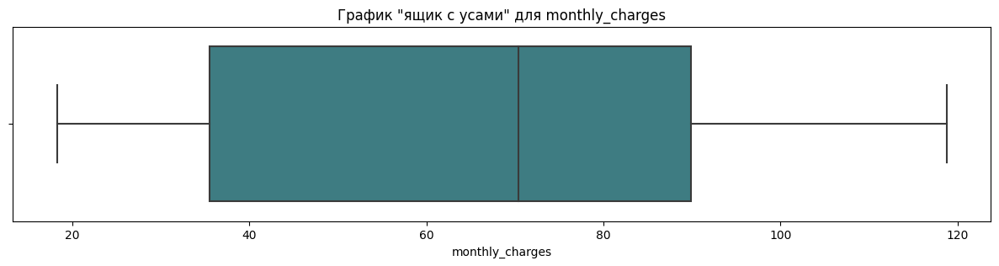

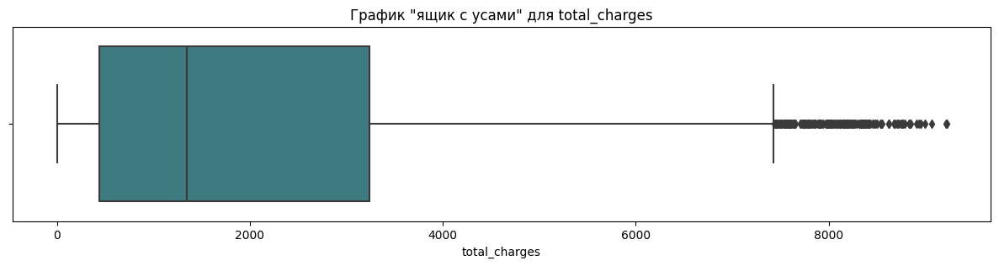

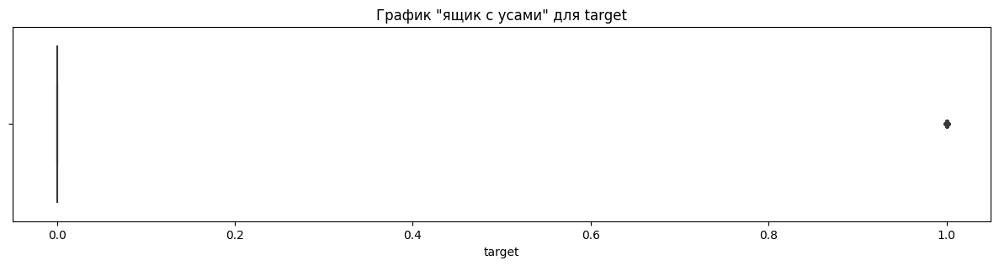

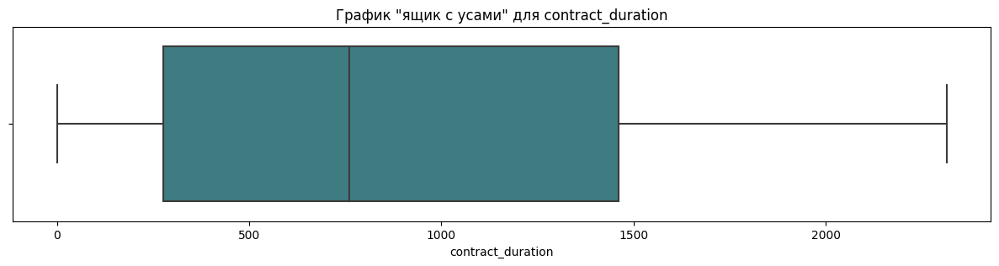

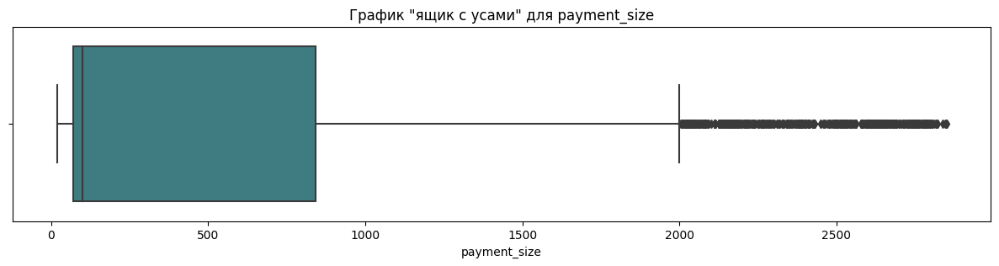

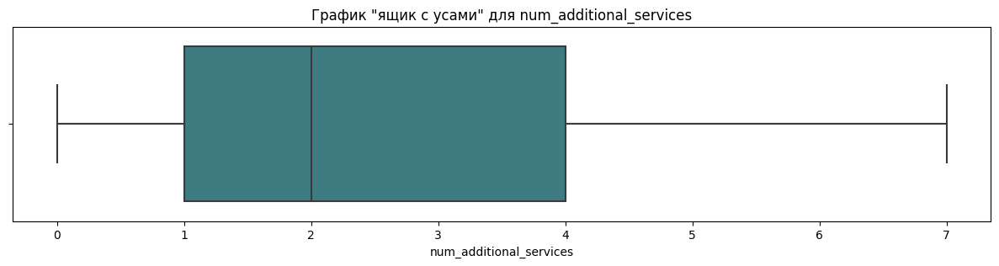

In [116]:
plot_box_charts(data)

На графике `total_chages` и `payment_size` видел перекос влево, который мы предположили выше, справа наблюдается некоторое количество выбросов в части пользователей, с большими тратами за все время. В целом, это не является какой-то аномалией, богатых клиентов всегда мало!

In [117]:
data.head()

,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,target,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,internet_user,multiple_lines,phone_user,contract_duration,regular_payment,payment_size,additional_services,num_additional_services,family_status,service_type
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0002-ORFBO,2019-05-01,2020-02-01,one year,True,mailed check,65.6,631.73,0,female,False,True,True,dsl,False,True,False,True,True,False,True,False,True,276,False,787.2,True,3,married with kids,phone and internet
0003-MKNFE,2019-05-01,2020-02-01,month-to-month,False,mailed check,59.9,539.10,0,male,False,False,False,dsl,False,False,False,False,False,True,True,True,True,276,True,59.9,True,2,single no kids,phone and internet
0004-TLHLJ,2019-09-01,2020-02-01,month-to-month,True,electronic check,73.9,406.45,0,male,False,False,False,fiber optic,False,False,True,False,False,False,True,False,True,153,True,73.9,True,1,single no kids,phone and internet
0011-IGKFF,2018-12-01,2020-02-01,month-to-month,True,electronic check,98.0,1372.00,0,male,True,True,False,fiber optic,False,True,True,False,True,True,True,False,True,427,True,98.0,True,4,married no kids,phone and internet
0013-EXCHZ,2019-09-01,2020-02-01,month-to-month,True,mailed check,83.9,444.67,0,female,True,True,False,fiber optic,False,False,False,True,True,False,True,False,True,153,True,83.9,True,2,married no kids,phone and internet


In [118]:
# определим колонки с непрерывными числовыми признаками (чтобы автоматически не подтягивались дискретные)
num_interval_columns = ['monthly_charges', 'total_charges', 'contract_duration', 'payment_size', 'num_additional_services']
target = ['target']

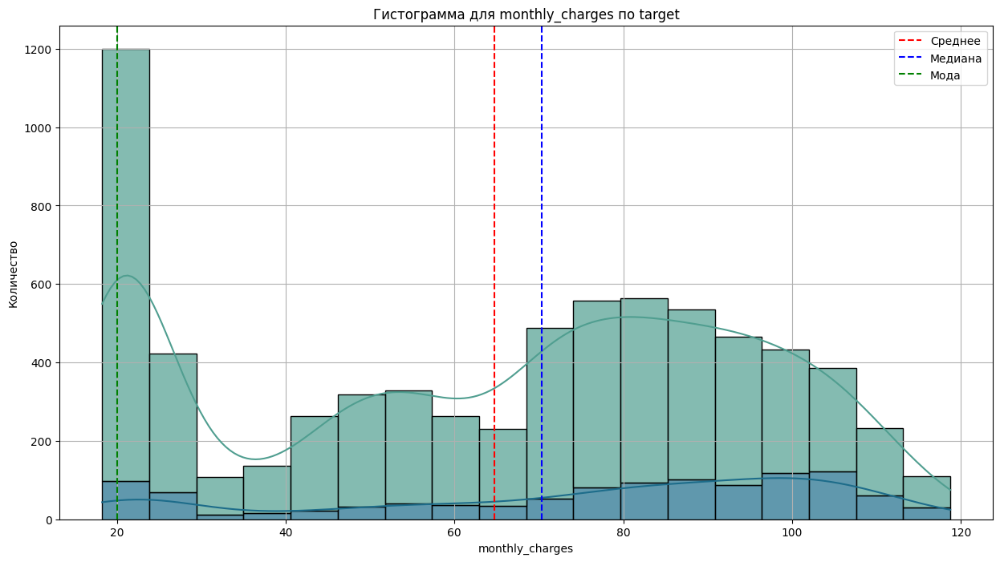

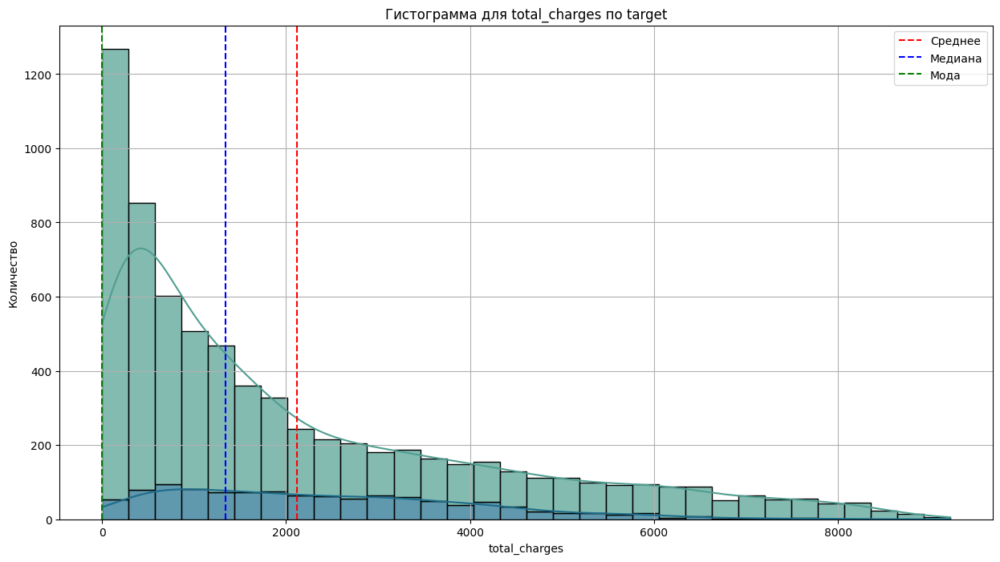

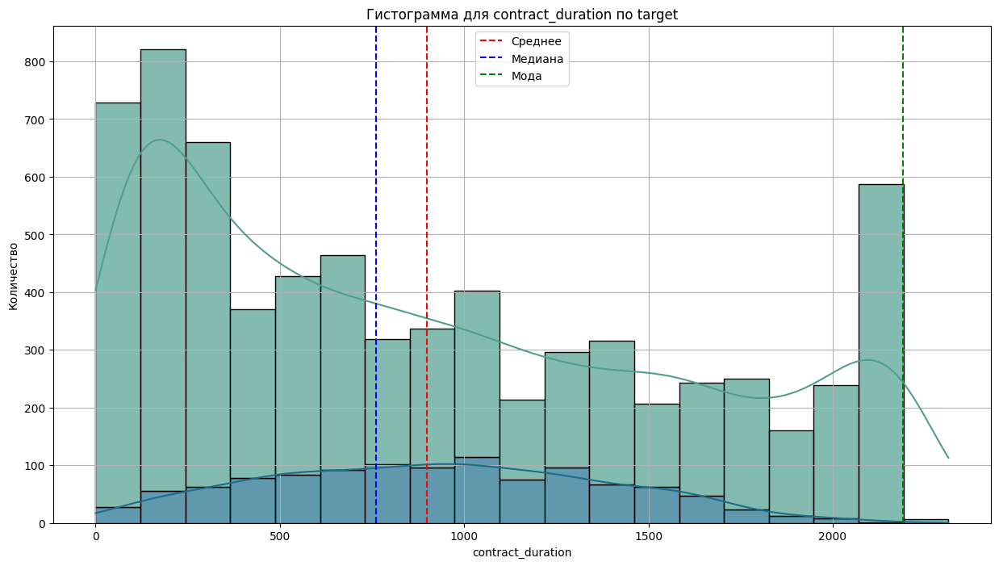

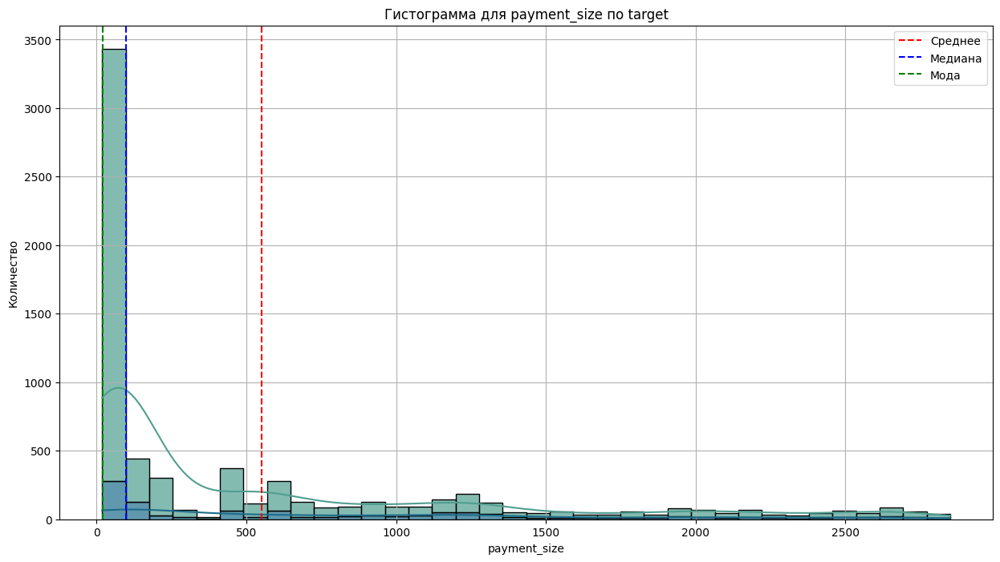

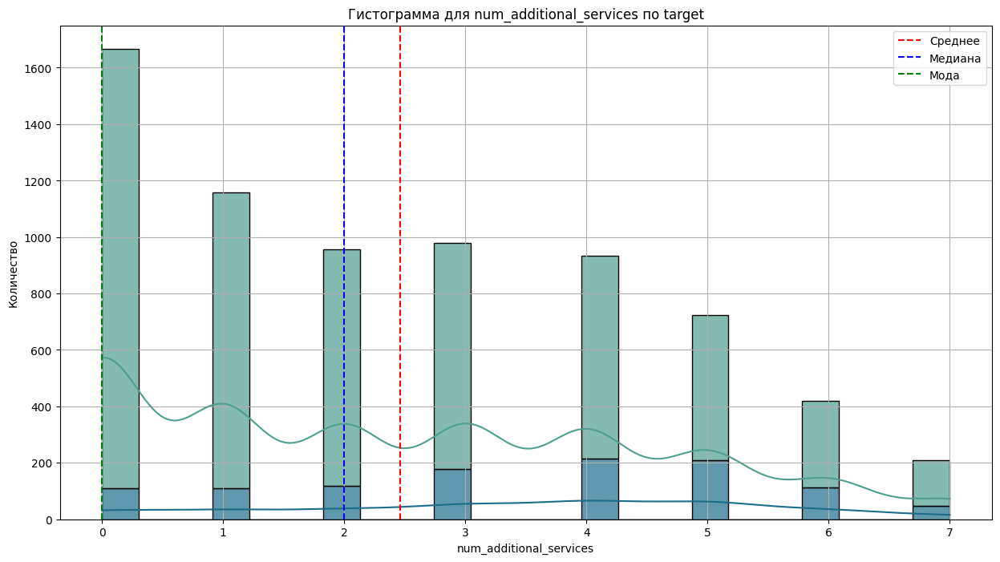

In [119]:
plot_histograms(data[num_interval_columns + target], hue='target')

**Гистограмма для `monthly_charges`:**
- на графике виден достаточно высокий пик в районе 20 денежных единиц (д.е.), вероятно, в этом районе находится стоимость какого-то популярно тарифа.
- на графике также заметно еще 2 пика поменьше в районе 50 д.е. и 80 д.е. Скорей всего эти два пика тоже зарактерны каким-то определенным сегментам покупателей с определенным набором услуг.
- клиенты, расторгнувшие договор, по большей части находятся в правой части графика (в районе 100 д.е.), возможно услуга для них оказалась слишком дорогой или  при таких высоких расходах они остались не довольны качеством обслуживания. 
- В целом график имеет вид схожий с мультимодальным нормальным распределением (3 моды) наложенные друг на друга.

**Гистограмма для `total_charges`:**
- График сильно скошен влево, имеет пик в районе нулевых значений с длинным правым хвостом. Это может указывать на наличие новых клиентов, которые только начали пользоваться услугами и имеют низкие общие расходы.
- Траты пользователей, растогнувших контракт, сдвинуты вправо относительно текущих клиентов. Это говорит о том, что они в среднем понесли большие общие расходы. Это может свидетельствовать о том, что они были недовольны качеством обслуживания при высоких расходах или что тарифы, которые они использовали, не оправдали ожиданий.

**Гистограмма для `contract_duration`:**
- Среди текущих пользователей видно для пики распределения по длительности контрактов находится в районе 200 дней и 2200 дней. Возможно в эти даты проводились какие-то маркетинговые мероприятия.
- Распределение клиентов, разорвавших контракт, имеет вид нормального распределения. При этом наиболее часто контракт разрывают на 1000 дней пользования.

**Гистограмма для `payment_size`:**
- У абсолютного большинства клиентов ежемесячный платеж не превышает 100-150 ден. ед.
- На графике также заметны две группы более состоятельных клиентов: одна в районе 500 ден. ед и другая немного меньше в районе 1200-1300 ден. ед.

**Гистограмма для `num_additional_services`:**
- Ушедшие пользователи заказывали больше дополнительных услуг, что оставшиеся. Распредедение по ним смещено вправо относительно распределения оставшихся пользователей.

#### Качественные признаки

In [120]:
data.columns

Index(['begin_date', 'end_date', 'type', 'paperless_billing', 'payment_method',
       'monthly_charges', 'total_charges', 'target', 'gender',
       'senior_citizen', 'partner', 'dependents', 'internet_service',
       'online_security', 'online_backup', 'device_protection', 'tech_support',
       'streaming_tv', 'streaming_movies', 'internet_user', 'multiple_lines',
       'phone_user', 'contract_duration', 'regular_payment', 'payment_size',
       'additional_services', 'num_additional_services', 'family_status',
       'service_type'],
      dtype='object')

In [121]:
dt_columns = ['begin_date', 'end_date']
target = ['target']
cat_columns = list(set(data.columns) - set(target) - set(num_interval_columns) - set(dt_columns))

In [122]:
cat_columns

['streaming_movies',
 'phone_user',
 'regular_payment',
 'gender',
 'additional_services',
 'senior_citizen',
 'paperless_billing',
 'online_security',
 'online_backup',
 'multiple_lines',
 'payment_method',
 'service_type',
 'type',
 'partner',
 'device_protection',
 'tech_support',
 'streaming_tv',
 'internet_user',
 'internet_service',
 'family_status',
 'dependents']

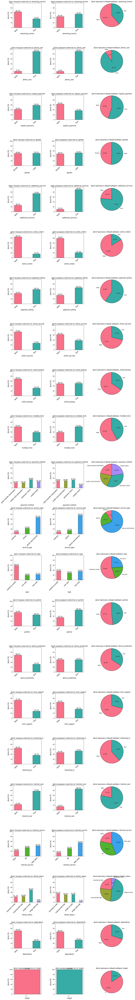

In [123]:
plot_bar_pie_chart(
    data,
    cat_columns+target)

Распределения категориальных признаков:

1. `type`:
- среди ушедших клиентов доля тех, у кого оплата списывается раз в год или раз в два года заметно выше, чем у текущих. Возможно, с их карты единоразово списались большие суммы и это мотивировало их отказаться от услуг.

2. `paperless_billing`:
- Cреди ушедщих пользователей достаточно мало пользователей `mailed check` и заметно больше пользователей, использующих автоматическую оплату (списание с карты или со счета).

3. `gender`, `partner`, `family_status`:
- Среди ушедших клиентов 2/3 имеют партнера, а среди оставшихся большая часть одиноки.
- Уходят в основном женатые, независимо от наличия детей.

4. `internet_service`:
- Среди ушедших клиентов больше относительная доля подключенных через оптоволокно была больше.

5. Дополнительные интернет услуги:
- Среди ушедших пользователей доля пользователей доп. услугами на 10%-20% выше чем у текущих клиентов.

6. `internet_user`:
- 78.3% пользователей пользуются интернетом, а среди ушедших пользователей эта доля достигает 85.5%

7. `multiple_lines`:
- дополнительно услугой подключение телефона к нескольким линиям одновременно пользуются 42.2% клиентов.
- среди ушедших клиентов эта доля значительно выше: 61.6%

8. `additional_services`:
- дополнительными услугами (интернет или телефон) пользуются 76.3% клиентов
- среди ушедших клиентов эта доля выше и достигает 89.9%

9. `target`:
- 15.6% клиентов решило расторгнуть договор. Это свидетельствует о дизбалансе классов в целевой переменной. 


Анализ категориальных признаков показывает, что среди ушедших клиентов наблюдается высокая доля тех, кто использует годовую оплату, автоматическую биллинг и оптоволоконный интернет. Большинство ушедших имеют партнера и пользуются дополнительными услугами, в то время как среди оставшихся клиентов преобладают одинокие. Также у ушедших пользователей выше процент тех, кто подключает телефон к нескольким линиям и активно использует интернет. В конечном итоге, 15.6% клиентов расторгают договор, что указывает на дисбаланс классов в целевой переменной.

### Тарифный план

Оказалось, что распределения пользователей по типам подключения (`internet_service`) отличается для ушедших и оставшихся пользователей. При этом, ранее мы также отмечали разницу количестве покупаемых услуг (`num_additional_services`) и в распределении стоимости (например, `monthly_charges`).

Проверим, возможно доступность услуги и ее стоимость зависят от типа подключения.

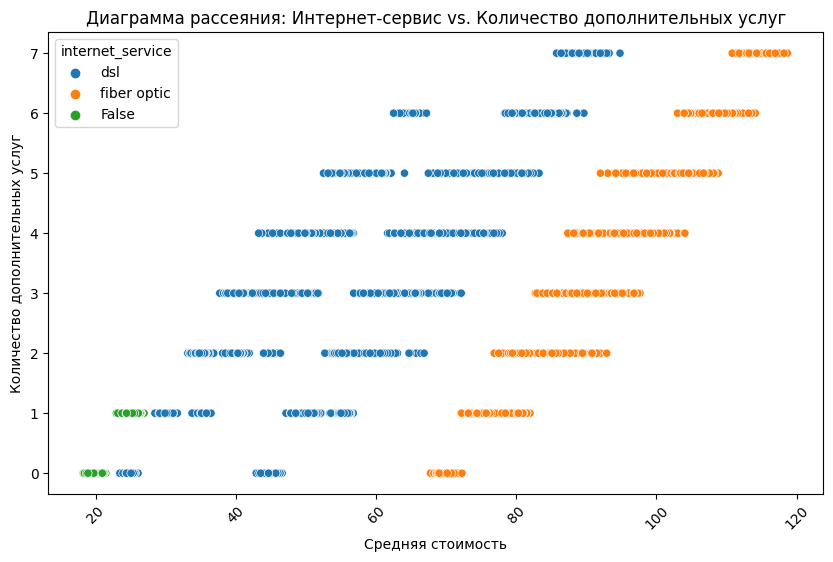

In [124]:
plt.figure(figsize=(10, 6))  # Опционально: задаем размер фигуры
sns.scatterplot(data=data, x='monthly_charges', hue='internet_service', y='num_additional_services')

plt.title('Диаграмма рассеяния: Интернет-сервис vs. Количество дополнительных услуг')
plt.xlabel('Средняя стоимость')
plt.ylabel('Количество дополнительных услуг')
plt.xticks(rotation=45)  # Повернуть метки по оси x, если нужно
plt.show()

Интересно, что с любым количестве доп. услуг на графике явно прослеживаются 3 группы пользователей (тарифов) по их ежемесячной стоимости.

- Заметно, что подключение Интернета по `fiber_optic` дороже чем все другие виды подключения.
- Подключение телефона попадает в самую дешевую группу, но в ней также присутствуют и пользователи интернет через `dsl`
- Пользователи интернета через `dsl` также формируют и среднюю группу.

Возможно, подключение через телефон также осуществляется по `dsl` и разница обуславливается типом заказываемых услуг.

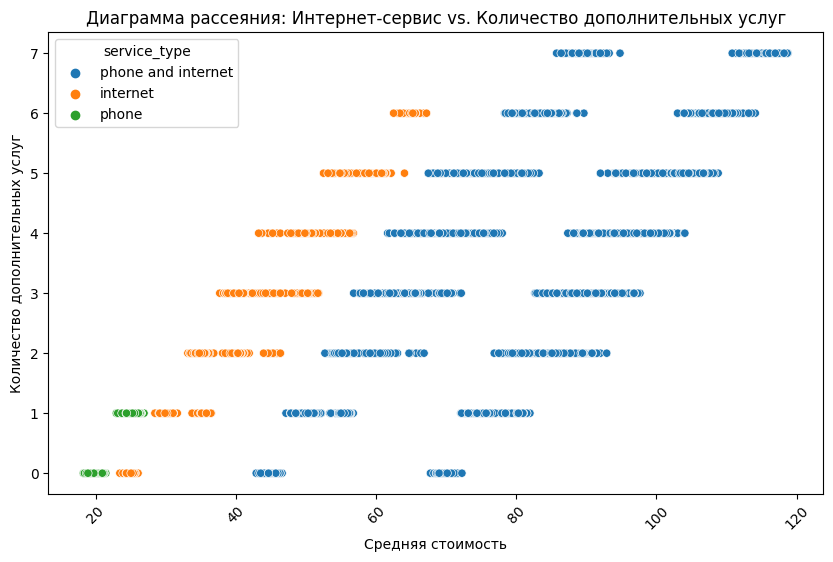

In [125]:
plt.figure(figsize=(10, 6))  # Опционально: задаем размер фигуры
sns.scatterplot(data=data, x='monthly_charges', hue='service_type', y='num_additional_services')

plt.title('Диаграмма рассеяния: Интернет-сервис vs. Количество дополнительных услуг')
plt.xlabel('Средняя стоимость')
plt.ylabel('Количество дополнительных услуг')
plt.xticks(rotation=45)  # Повернуть метки по оси x, если нужно
plt.show()

Кажется, сделанное предположение подтверждается.

Пользователей можно разбить на следующие 3 или 4 группы:

- Комплексные услуги (интернет и телефон) через оптоволокно (`service_type`='phone and internet' и `internet_service`='fiber optic`)
- Комплексные услуги (интернет и телефон) через цифровую абонентскую линия (`service_type`='phone and internet' и `internet_service`='dsl`)
- Интернет через цифровую абонентскую линия (`service_type`='internet' и `internet_service`='dsl`)
- Телефон через цифровую абонентскую линия (`service_type`='phone' и `internet_service`='False')

Последние две группы в целом можно было бы объединить в одну, но ежемесячные траты пользователей за телефон всегда ниже, чем за интернет. Поэтому оставим 4 группы. 

Добавим новый признак в выборку.

In [126]:
# для начала заменим заглушку `False` на dsl
# Очевидно, что телефоны также подключены по данному виду соединения

data['internet_service'] = data['internet_service'].replace('False', 'dsl')

In [127]:
data['internet_service'].value_counts()

dsl            3947
fiber optic    3096
Name: internet_service, dtype: int64

In [128]:
# Определим функцию для классификации
def classify_tariffs(row):
    if row['service_type'] == 'phone and internet' and row['internet_service'] == 'fiber optic':
        return 'all fiber'
    elif row['service_type'] == 'phone and internet' and row['internet_service'] == 'dsl':
        return 'all dsl'
    elif row['service_type'] == 'internet' and row['internet_service'] == 'dsl':
        return 'internet dsl'
    elif row['service_type'] == 'phone' and row['internet_service'] == 'dsl':
        return 'phone dsl'
    else:
        return 'Другие'

In [129]:
data['tariff_type'] = data.apply(classify_tariffs, axis=1)

In [130]:
data['tariff_type'].value_counts()

all fiber       3096
all dsl         1739
phone dsl       1526
internet dsl     682
Name: tariff_type, dtype: int64

In [131]:
data.sample(10, random_state=RANDOM_STATE)

,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,target,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,internet_user,multiple_lines,phone_user,contract_duration,regular_payment,payment_size,additional_services,num_additional_services,family_status,service_type,tariff_type
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
5843-TTHGI,2018-08-01,2020-02-01,month-to-month,True,mailed check,50.00,900.00,0,female,False,False,False,dsl,False,False,True,False,False,False,True,False,True,549,True,50.00,True,1,single no kids,phone and internet,all dsl
1543-LLLFT,2015-01-01,2016-05-01,one year,True,mailed check,98.30,1714.35,1,male,True,True,False,fiber optic,False,True,True,True,True,False,True,True,True,486,False,1179.60,True,5,married no kids,phone and internet,all fiber
0303-UNCIP,2016-09-01,2020-02-01,one year,False,mailed check,65.00,2665.00,0,male,False,False,False,dsl,False,False,True,False,False,True,True,True,True,1248,False,780.00,True,3,single no kids,phone and internet,all dsl
8990-ZXLSU,2019-05-01,2020-02-01,month-to-month,False,electronic check,69.05,621.45,0,female,False,False,False,fiber optic,False,False,False,False,False,False,True,False,True,276,True,69.05,False,0,single no kids,phone and internet,all fiber
3551-HUAZH,2019-09-01,2020-02-01,month-to-month,True,electronic check,74.40,409.20,0,male,True,False,False,fiber optic,False,False,False,False,False,False,True,True,True,153,True,74.40,True,1,single no kids,phone and internet,all fiber
0725-CXOTM,2017-02-01,2020-02-01,one year,True,credit card (automatic),89.65,3324.22,0,female,False,False,False,dsl,True,False,True,True,True,True,True,True,True,1095,False,1075.80,True,6,single no kids,phone and internet,all dsl
8735-NBLWT,2019-05-01,2020-02-01,month-to-month,False,mailed check,20.40,194.62,0,male,False,False,True,dsl,False,False,False,False,False,False,False,False,True,276,True,20.40,False,0,single with kids,phone,phone dsl
6710-HSJRD,2015-01-01,2017-09-01,month-to-month,True,electronic check,114.10,3651.20,1,male,False,True,False,fiber optic,False,True,True,True,True,True,True,True,True,974,True,114.10,True,6,married no kids,phone and internet,all fiber
5013-SBUIH,2015-11-01,2019-12-01,two year,True,electronic check,109.65,5372.85,1,female,False,False,False,fiber optic,True,True,False,True,True,True,True,True,True,1491,False,2631.60,True,6,single no kids,phone and internet,all fiber


In [132]:
# Поскольку добавился новый категориальный признак, обновим список категориальных колонок
cat_columns = list(set(data.columns) - set(target) - set(num_interval_columns) - set(dt_columns))

### Портрет типичного клиента

Проанализировав количественные и качественные признаки, попробуем составить портрет типичного пользователя.

In [133]:
# выведем сводную таблицу
typical_clients = describe_typical_client(data, target_column='target', statistic='median')
# для удобства отсортируем, чтобы категориальные данные шли после числовых
typical_clients = typical_clients.astype('str').sort_values('Портрет клиента (Общий)')

In [134]:
# Напишем функцию, которая красит ячейки "зеленым", если профиль в разрезе по таргету совпадает с общим профилем
# иначе "красным"
def highlight_cells(row):
    
    # Получаем значения для отладки
    target_0 = row['Портрет клиента (Целевой признак: False']
    target_1 = row['Портрет клиента (Целевой признак: True']
    general = row['Портрет клиента (Общий)']

    # Проверяем условия окраски с новыми цветами
    color_0 = 'background-color: #66ff66' if target_0 == general else 'background-color: #ff6666'  # Светлый зеленый и красный
    color_1 = 'background-color: #66ff66' if target_1 == general else 'background-color: #ff6666'  # Светлый зеленый и красный

    # Возвращаем цвета для всех трех колонок
    return ['', color_0, color_1]  # Первая колонка не красится

In [135]:
# Применяем стиль к таблице
styled_typical_clients = typical_clients.style.apply(highlight_cells, axis=1)
styled_typical_clients

KeyError: 'Портрет клиента (Целевой признак: False'

**Сравнительный анализ портрета типичного клиента:**

1. Финансовые показатели:
- Ушедшие клиенты (2139.03) потратили значительно больше, чем действующие (1192.8).
- Их ежемесячные расход также выше (84.2 против 69.2). Вероятно, данные пользователи используют более дорогие тарифы или пользуются дополнительными платными функциями. 
- Также средний размер одного платежа сильно выше в категории ушедших пользователей (592.8 против 94.2), это обусловлено тем, что ушедшие пользователи чаще оплачивают услуги сразу за один-два года.


2. Сроки обслуживания:
Ушедшие клиенты в среднем обслуживались немного дольше чем оставшиеся (915 дней против 702 дней).


3. Услуги и опции:
Ушедшие клиенты используют в среднем 4 вида дополнительных услуг (в основном это: онлайн-бэкапы, стриминг тв и фильмов, множественные телефонные линии), а действующие только 2 вида доп. услуг (четко выделенных категорий не видно). С этим могут быть связаны их повышенные расходы по сравнению с оставшимися клиентами. 

    Примечательно, что ни одна из групп не является активным пользователем технической поддержки, что может указывать на то, что проблема скорей всего носит не технический характер.


4. Семейное положение:
Большинство ушедших клиентов имеют супруга/супругу и не имеют детей, а большинство действующих клиентов одиноки. Наличие семьи может мотивировать клиентов тщательней подходить к финансовому планированию и отказываться от необязательных расходов (доп. услуг). 

Таким образом, ушедшие клиенты, несмотря на более высокие расходы и длительное обслуживание, вероятно, стали недовольны из-за редких (раз в год) больших платежей, существенную часть которых составляет плата за дополнительные услуги. Кроме того, большинство ушедших клиентов имеют семьи, что может способствовать более тщательному финансовому планированию и отказу от необязательных и незапланированных расходов.

### Сегменты пользователей

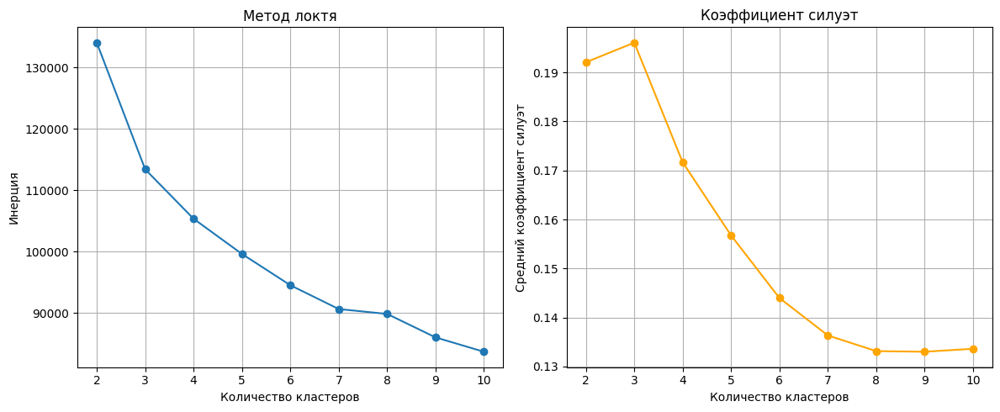

Рекомендуемое количество кластеров: 3


In [136]:
optimal_k, data_segment_preprocessed, preprocessor = preprocess_and_plot_elbow(data)

На графике по методу локтя нет четко выраженного перелома (изгиба) в графике, но видно, что падение инерции замедляется в районе 3-8 кластеров.

На графике с коэффициентами "силуэта" видно, что оптимальное количество кластеров равно 3.

Попробуем использовать 3 кластера для сегментации.

In [137]:
# для визуализации в pairplot используем только непрерывные числовые признаки из исходного датасета
# их надо передать на вход функции
num_interval_columns

['monthly_charges',
 'total_charges',
 'contract_duration',
 'payment_size',
 'num_additional_services']

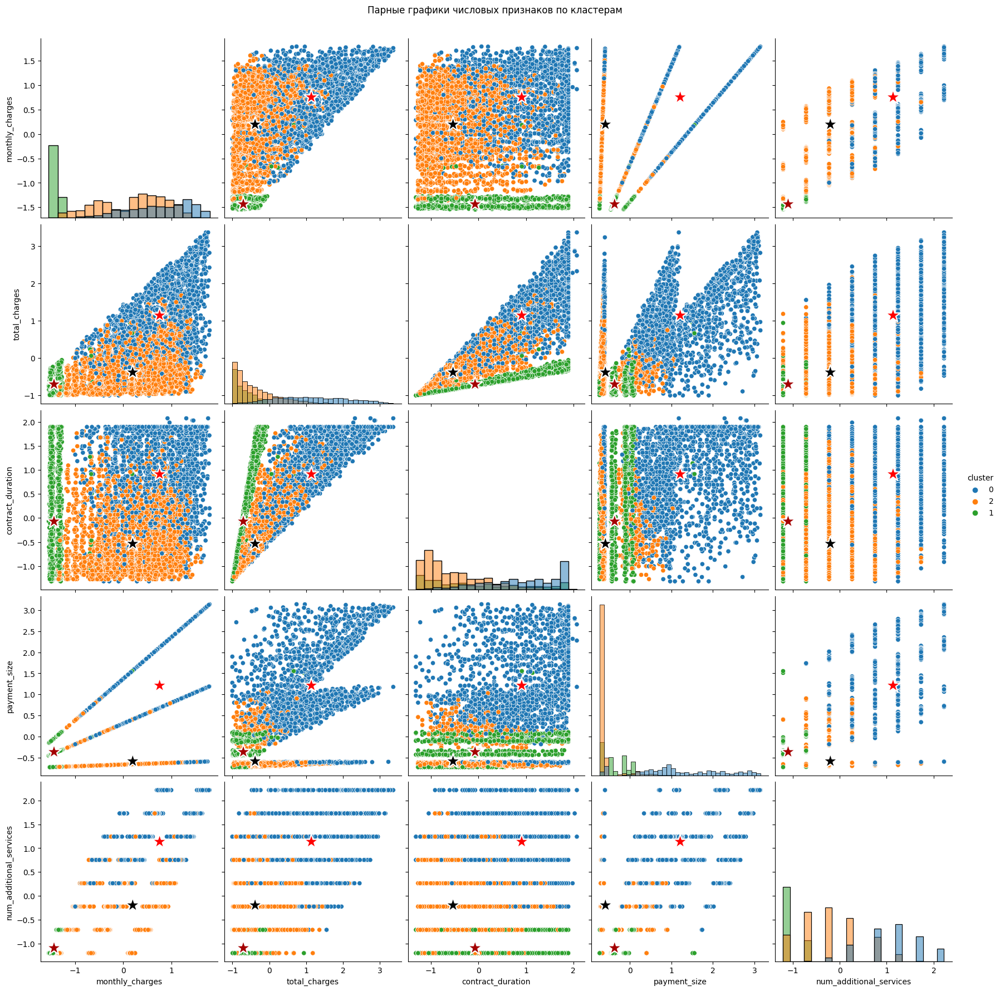

In [138]:
# Пример вызова функции
labels, pairplot, centroids = cluster_and_plot(
    data_segment_preprocessed=data_segment_preprocessed,
    preprocessor=preprocessor,
    optimal_k=optimal_k,
    num_interval_columns=num_interval_columns
)

Визуально, разбивка на 3 кластера выглядит адекватно.

Попробуем добавить метку класса в первоначальную таблицу и построить описание типичного клиента по каждому классу.

In [139]:
data['cluster'] = labels

In [140]:
data.sample(5, random_state=RANDOM_STATE)

,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,target,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,internet_user,multiple_lines,phone_user,contract_duration,regular_payment,payment_size,additional_services,num_additional_services,family_status,service_type,tariff_type,cluster
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
5843-TTHGI,2018-08-01,2020-02-01,month-to-month,True,mailed check,50.00,900.00,0,female,False,False,False,dsl,False,False,True,False,False,False,True,False,True,549,True,50.00,True,1,single no kids,phone and internet,all dsl,2
1543-LLLFT,2015-01-01,2016-05-01,one year,True,mailed check,98.30,1714.35,1,male,True,True,False,fiber optic,False,True,True,True,True,False,True,True,True,486,False,1179.60,True,5,married no kids,phone and internet,all fiber,0
0303-UNCIP,2016-09-01,2020-02-01,one year,False,mailed check,65.00,2665.00,0,male,False,False,False,dsl,False,False,True,False,False,True,True,True,True,1248,False,780.00,True,3,single no kids,phone and internet,all dsl,2
8990-ZXLSU,2019-05-01,2020-02-01,month-to-month,False,electronic check,69.05,621.45,0,female,False,False,False,fiber optic,False,False,False,False,False,False,True,False,True,276,True,69.05,False,0,single no kids,phone and internet,all fiber,2
3551-HUAZH,2019-09-01,2020-02-01,month-to-month,True,electronic check,74.40,409.20,0,male,True,False,False,fiber optic,False,False,False,False,False,False,True,True,True,153,True,74.40,True,1,single no kids,phone and internet,all fiber,2


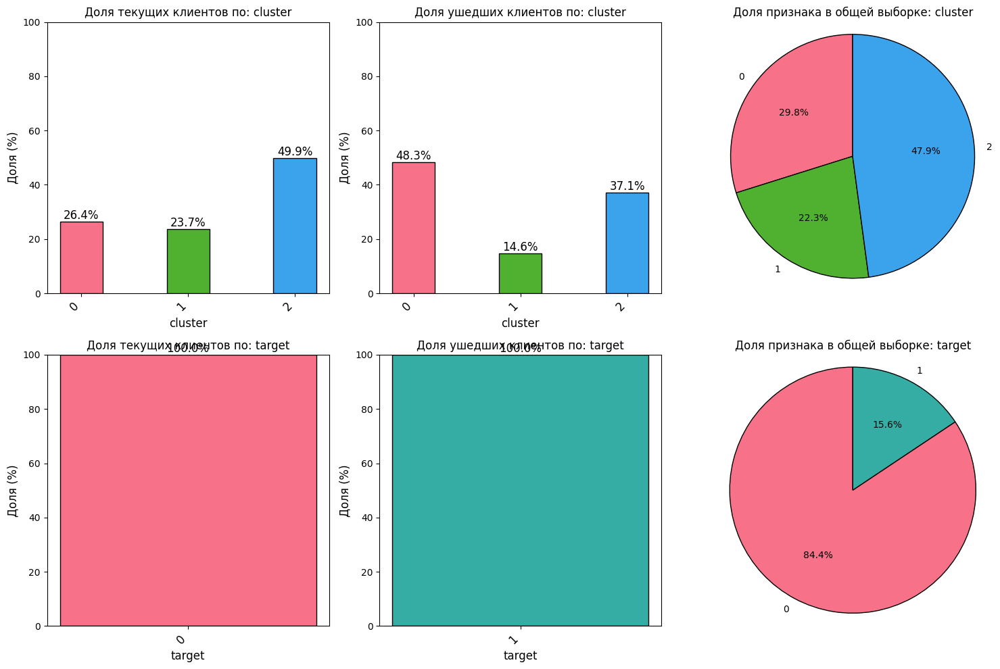

In [141]:
plot_bar_pie_chart(
    data,
    ['cluster', 'target'])

Клиенты распределяются по кластерам следующим образом:
- **Кластер 0:** 29.8%
- **Кластер 1:** 22.3%
- **Кластер 2:** 47.9%

При это среди ушедших клиентов доля в класетере 1 наибольшая и она существенно выше чем среди действующих клиентов.

In [142]:
data.groupby('cluster')['target'].mean()

cluster
0    0.253092
1    0.102679
2    0.120961
Name: target, dtype: float64

Средний процент ухода по кластерам также показывает, что в класетере 0 уходит 25% клиентов, в то время как в других кластерах 10-12%. 

Попробуем построить портрет типичного клиента в каждом кластере.

In [143]:
# выведем сводную таблицу
typical_clients_cluster = describe_typical_client(data, target_column='cluster', statistic='mean')
# для удобства отсортируем, чтобы категориальные данные шли после числовых
typical_clients_cluster = typical_clients_cluster.astype('str').sort_values('Портрет клиента (Общий)')

In [144]:
typical_clients_cluster

,Портрет клиента (Общий),Портрет клиента (Целевой признак: 0,Портрет клиента (Целевой признак: 2,Портрет клиента (Целевой признак: 1
target,0.15632542950447254,0.2530922930542341,0.12096056922620813,0.10267857142857142
cluster,1.1804628709356808,0.0,2.0,1.0
num_additional_services,2.45974726678972,4.782112274024739,2.054550844945153,0.2181122448979592
begin_date,2017-04-30 13:01:50.918642688,2015-05-19 19:59:32.597526016,2018-06-10 04:21:42.104951040,2017-07-21 01:04:17.142856960
end_date,2019-10-16 02:22:05.912253184,2019-07-18 13:00:58.230256896,2019-11-25 08:34:26.291135488,2019-11-18 13:15:18.367346944
total_charges,2115.3128851341758,4526.472483349191,1302.8539549362583,630.7251913265306
payment_size,550.792808462303,1436.7521883920074,122.64691669137268,284.11517857142854
monthly_charges,64.76169246059918,87.49624167459561,70.67668247850578,21.56061862244898
contract_duration,898.5557290927162,1520.709324452902,533.1755114141714,850.5076530612245
streaming_tv,False,True,False,False


Дополнительно визуализируем доли пользователей по булевым типам данных.

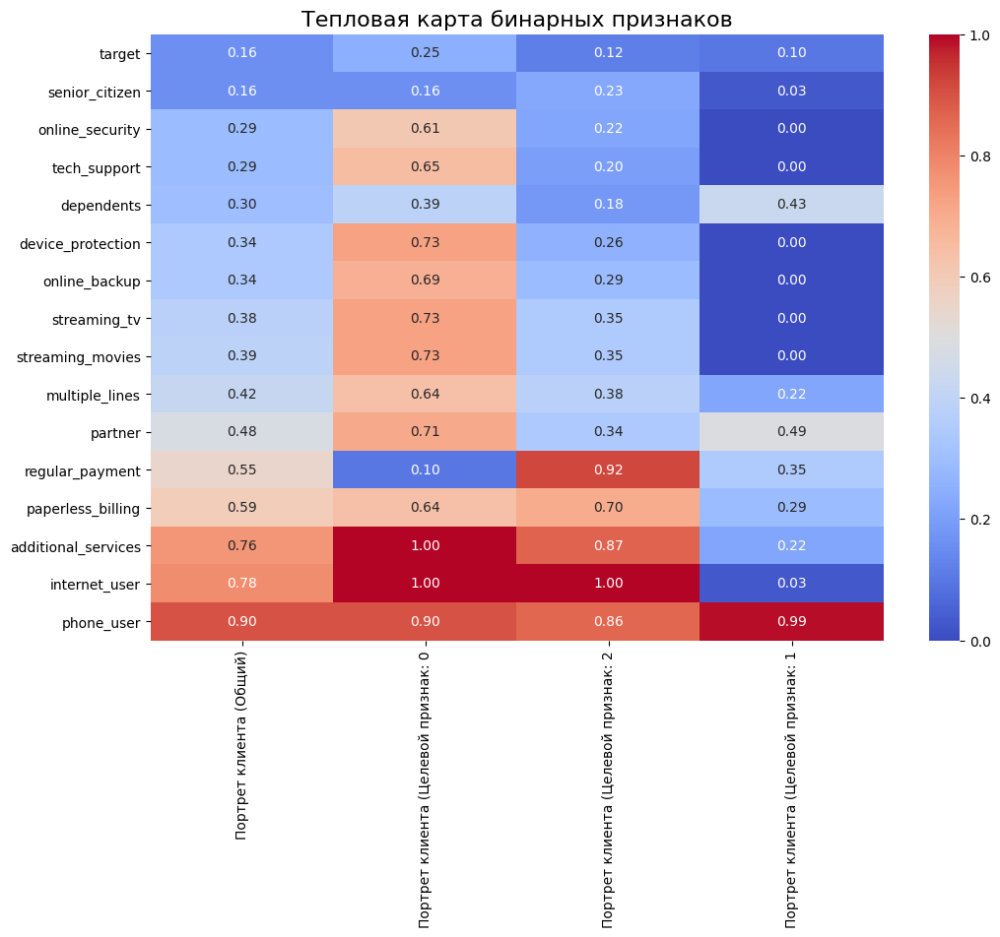

In [145]:
# Копируем данные и преобразуем типы
data_numeric = data.copy().astype('int', errors='ignore')

# Описание типичного клиента
typical_clients = describe_typical_client(data_numeric, target_column='cluster', statistic='mean')

# Сортируем для удобства
typical_clients = typical_clients.astype('str').sort_values('Портрет клиента (Общий)')

# Функция для округления
def round_if_numeric(value):
    try:
        return round(pd.to_numeric(value), 2)
    except (ValueError, TypeError):
        return value  # Возвращаем значение без изменений, если не числовое

# Применяем функцию ко всему DataFrame
rounded_df = typical_clients.applymap(round_if_numeric)

# Убираем ненужные строки
index_position = rounded_df.index.get_loc('cluster') - 1
rounded_df = rounded_df.iloc[:index_position + 1].astype('float')

# Создание тепловой карты
plt.figure(figsize=(12, 8))
sns.heatmap(rounded_df, annot=True, cmap='coolwarm', cbar=True, fmt=".2f")

# Добавляем заголовки и подписи
plt.title('Тепловая карта бинарных признаков', fontsize=16)

# Отображение графика
plt.show()

Таким образом, сегментам можно дать следующую характеристику:

**Кластер 0: Комплексный премиум (интернет+телефон)**
- Пользователь: Телефон и интернет
- Тип оплаты: Раз в два года, автоматическое списание
- Общие расходы: 4526
- Ежемесячные расходы: 87
- Длительность договора: 1520 дня (4 года) 
- Доп. услуги: Максимальное (в среднем 4-5 доп. услуг)
- Профиль пользователя: замужняя женщина с детьми

**Кластер 2: Комплексный базовый (интернет+телефон)**
- Пользователь: Телефон и интернет
- Тип оплаты: ежемесячно, электронный чек
- Общие расходы: 1302
- Ежемесячные расходы: 71
- Длительность договора: 533 дня (1.5 года) 
- Доп. услуги: Среднее (в среднем 2 доп. услуги)
- Профиль пользователя: одинокий мужчина

**Кластер 1: Телефон базовый**
- Пользователь: Телефон
- Тип оплаты: Раз в два года, чек по почте
- Общие расходы: 630
- Ежемесячные расходы: 22
- Длительность договора: 851 дня (2.5 года) 
- Доп. услуги: Минимальное (22% подключены под многоканальной линии)
- Профиль пользователя: одинокий мужчина

Добавим сегмент как дополнительный признак в таблицу.

In [146]:
data['cluster'] = labels

In [147]:
data.sample(5, random_state=RANDOM_STATE)

,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,target,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,internet_user,multiple_lines,phone_user,contract_duration,regular_payment,payment_size,additional_services,num_additional_services,family_status,service_type,tariff_type,cluster
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
5843-TTHGI,2018-08-01,2020-02-01,month-to-month,True,mailed check,50.00,900.00,0,female,False,False,False,dsl,False,False,True,False,False,False,True,False,True,549,True,50.00,True,1,single no kids,phone and internet,all dsl,2
1543-LLLFT,2015-01-01,2016-05-01,one year,True,mailed check,98.30,1714.35,1,male,True,True,False,fiber optic,False,True,True,True,True,False,True,True,True,486,False,1179.60,True,5,married no kids,phone and internet,all fiber,0
0303-UNCIP,2016-09-01,2020-02-01,one year,False,mailed check,65.00,2665.00,0,male,False,False,False,dsl,False,False,True,False,False,True,True,True,True,1248,False,780.00,True,3,single no kids,phone and internet,all dsl,2
8990-ZXLSU,2019-05-01,2020-02-01,month-to-month,False,electronic check,69.05,621.45,0,female,False,False,False,fiber optic,False,False,False,False,False,False,True,False,True,276,True,69.05,False,0,single no kids,phone and internet,all fiber,2
3551-HUAZH,2019-09-01,2020-02-01,month-to-month,True,electronic check,74.40,409.20,0,male,True,False,False,fiber optic,False,False,False,False,False,False,True,True,True,153,True,74.40,True,1,single no kids,phone and internet,all fiber,2


### Корреляционный анализ

Посмотрим на корреляции признаков и постараемся выбрать только те признаки, которые больше всего влияют на таргет.

При этом, поскольку целевой признак был создан на основе колонки `end_date`, мы не сможем использовать его чтобы не допустичь утечки целевого признака при обучении моделей. 

`begin_date` также участвовала при создании колонки `contract_duration`, поэтому если мы оставим `begin_date` может произойти утечка признака. К тому же эта колонка представлена в формате datetime и ее не удобно использовать для обучения модели (вероятно, придется извлекать из нее другие признаки - час, месяц, год и т.д.) или приводит к 'int' и масштабировать.

Поэтому, колонки `end_date` и  `begin_date` удалим из выборки.

In [148]:
# создадим копию data в которой оставим только нужные признаки
data_corr = data.copy()
data_corr = data_corr.drop(['end_date', 'begin_date'], axis=1)

In [149]:
data_corr.head(2)

,type,paperless_billing,payment_method,monthly_charges,total_charges,target,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,internet_user,multiple_lines,phone_user,contract_duration,regular_payment,payment_size,additional_services,num_additional_services,family_status,service_type,tariff_type,cluster
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0002-ORFBO,one year,True,mailed check,65.6,631.73,0,female,False,True,True,dsl,False,True,False,True,True,False,True,False,True,276,False,787.2,True,3,married with kids,phone and internet,all dsl,0
0003-MKNFE,month-to-month,False,mailed check,59.9,539.10,0,male,False,False,False,dsl,False,False,False,False,False,True,True,True,True,276,True,59.9,True,2,single no kids,phone and internet,all dsl,2


In [150]:
num_interval_columns

['monthly_charges',
 'total_charges',
 'contract_duration',
 'payment_size',
 'num_additional_services']

In [151]:
def correlations(data_corr):
    # Вычисляем корреляционную матрицу
    corr_matrix = data_corr.phik_matrix(interval_cols=num_interval_columns)

    # Сортируем корреляционную матрицу по значениям корреляции с 'target'
    sorted_corr_matrix = corr_matrix.loc[corr_matrix['target'].abs().sort_values(ascending=True).index,
                                          corr_matrix['target'].abs().sort_values(ascending=False).index]

    # Визуализируем отсортированную корреляционную матрицу
    plt.figure(figsize=(20, 20))
    sns.heatmap(sorted_corr_matrix, annot=True, cmap='Greens')
    plt.title("Корреляционная матрица с сортировкой по target")
    plt.show()

    # Возвращаем отсортированную матрицу как датафрейм
    return sorted_corr_matrix

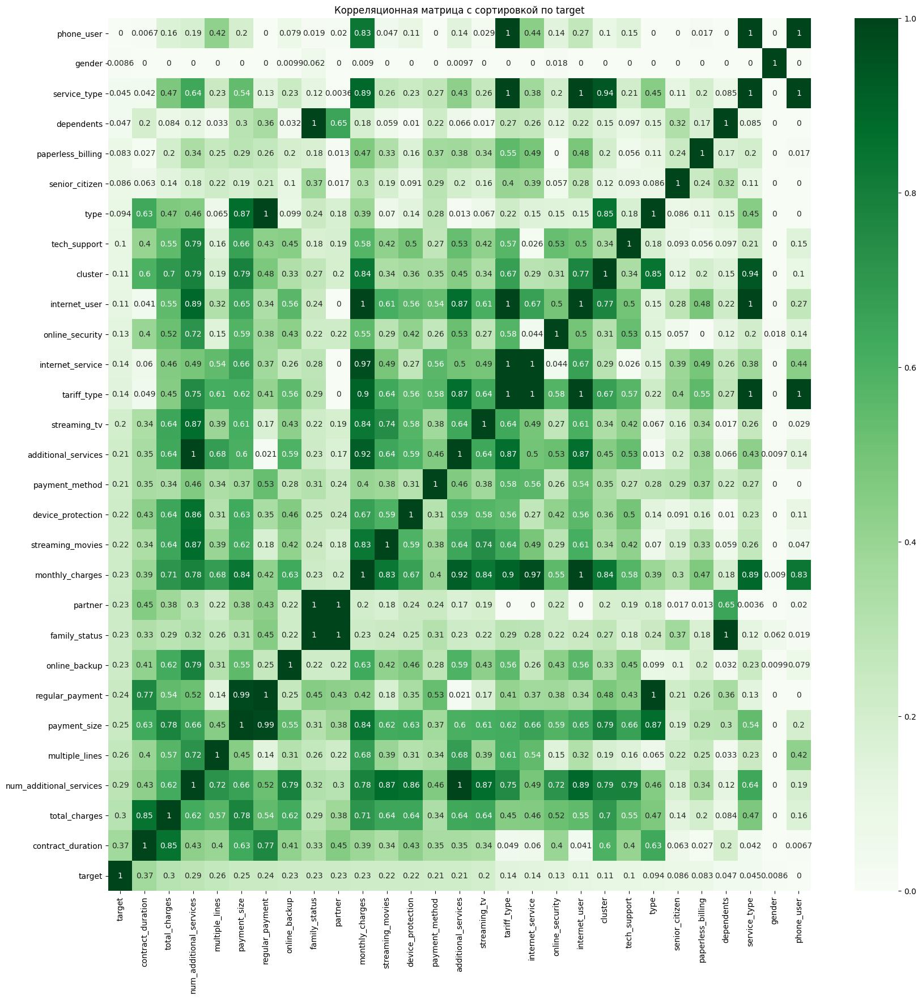

In [152]:
correlation_df = correlations(data_corr)

На рисунке видна мультиколлинеарность по ряду признаков. Сильно коррелирующие признаки необходимо убрать, чтобы избавиться от мультиколлинеарности.

Мультиколлинеарных признаков много, и достаточно сложно визуально оценить какие из них следует удалить, а каие оставить.

Напишем функцию для автоматического удаления мультиколлинеарных признаков из матрицы корреляции.

Она анализирует матрицу корреляции признаков и исключает те, которые имеют высокую корреляцию (выше установленного порога) 
с другими признаками, чтобы предотвратить дублирование информации и улучшить качество модели.

Принцип отбора признаков: 
- Для каждого признака функция проверяет его корреляцию с другими признаками.
- Если корреляция между двумя признаками превышает заданный порог, один из них (более коррелирующий с таргетом) исключается.
- Функция отслеживает корреляцию признаков с целевой переменной, и исключает менее значимый признак.

In [153]:
def remove_autocorrelated_features(corr_matrix, target_variable_name, threshold=0.9):
    """
    Функция для удаления автокоррелирующих признаков из матрицы корреляции.

    Параметры:
    - corr_matrix (DataFrame): матрица корреляции признаков.
    - target_variable_name (str): имя целевой переменной для проверки корреляции.
    - threshold (float): пороговое значение для определения высокой корреляции (по умолчанию 0.9).

    Возвращает:
    - list: список признаков, которые были исключены.
    """

    # Создаем множество для логов исключенных признаков
    excluded_features = set()
    
    # Копируем матрицу корреляции, чтобы не изменять оригинал
    matrix_copy = corr_matrix.copy()

    # Идем по всем колонкам матрицы корреляции
    for col in matrix_copy.columns:
        if col in excluded_features:  # Пропускаем уже исключенные признаки
            continue
        
        # Проверяем корреляцию текущего признака (col) с остальными признаками
        for row in matrix_copy.columns:
            if row != col and matrix_copy.loc[row, col] >= threshold:  # Проверяем на наличие высокой корреляции
                if row not in excluded_features:  # Убедимся, что мы еще не исключили эту колонку
                    excluded_features.add(row)  # Добавляем текущий признак в список исключенных
                    
                    # Получаем корреляцию с целевой переменной для обоих признаков
                    correlation_with_target_row = round(matrix_copy.loc[row, target_variable_name], 2)
                    correlation_with_target_col = round(matrix_copy.loc[col, target_variable_name], 2)
                    correlation_value = round(matrix_copy.loc[row, col], 2)
                    
                    # Выводим информацию о том, какой признак исключается и почему
                    print(f"Исключаем признак: {row} из-за высокой корреляции с {col} "
                          f"(значение: {correlation_value}, корреляции с целевой переменной: [{correlation_with_target_row}, {correlation_with_target_col}])")
                
                # Удаляем колонку только после завершения проверки текущей колонки
                matrix_copy.drop(columns=[row], inplace=True, errors='ignore')
                matrix_copy.drop(index=row, inplace=True, errors='ignore')
    
    # Удаляем все признаки, которые были отмечены для исключения из матрицы корреляции
    matrix_copy.drop(columns=excluded_features, inplace=True, errors='ignore')

    # Преобразуем множество исключенных признаков в список для последующего использования
    excluded_features = list(excluded_features)
    
    # Выводим список исключенных признаков
    print("Исключенные признаки:", excluded_features)
    
    # Визуализируем отсортированную корреляционную матрицу
    plt.figure(figsize=(20, 20))
    sns.heatmap(matrix_copy, annot=True, cmap='Greens')
    plt.title("Корреляционная матрица с сортировкой по target")
    plt.show()
    
    return  excluded_features  # Возвращаем список исключенных признаков

Исключаем признак: additional_services из-за высокой корреляции с num_additional_services (значение: 1.0, корреляции с целевой переменной: [0.21, 0.29])
Исключаем признак: regular_payment из-за высокой корреляции с payment_size (значение: 0.99, корреляции с целевой переменной: [0.24, 0.25])
Исключаем признак: partner из-за высокой корреляции с family_status (значение: 1.0, корреляции с целевой переменной: [0.23, 0.23])
Исключаем признак: dependents из-за высокой корреляции с family_status (значение: 1.0, корреляции с целевой переменной: [0.05, 0.23])
Исключаем признак: tariff_type из-за высокой корреляции с monthly_charges (значение: 0.9, корреляции с целевой переменной: [0.14, 0.23])
Исключаем признак: internet_service из-за высокой корреляции с monthly_charges (значение: 0.97, корреляции с целевой переменной: [0.14, 0.23])
Исключаем признак: internet_user из-за высокой корреляции с monthly_charges (значение: 1.0, корреляции с целевой переменной: [0.11, 0.23])
Исключаем признак: servi

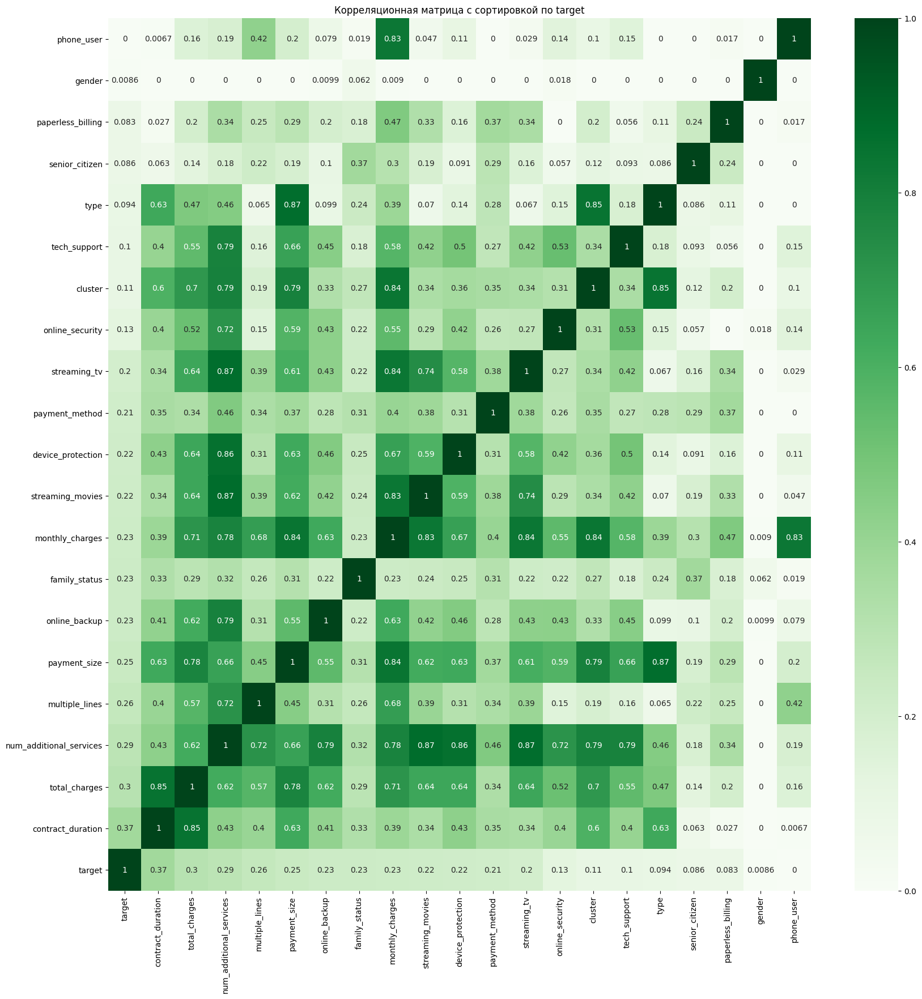

In [154]:
columns_to_remove = remove_autocorrelated_features(correlation_df, target_variable_name='target')

Мультиколлинеарность устранена.
Заметим также, что признаки `gender` и `phone_user` практически не влияют на таргет. Удалим их из выборки.

In [155]:
# Удалим лишние колонки из самого датасета
data_corr = data_corr.drop(columns_to_remove+['gender', 'phone_user'], axis=1)

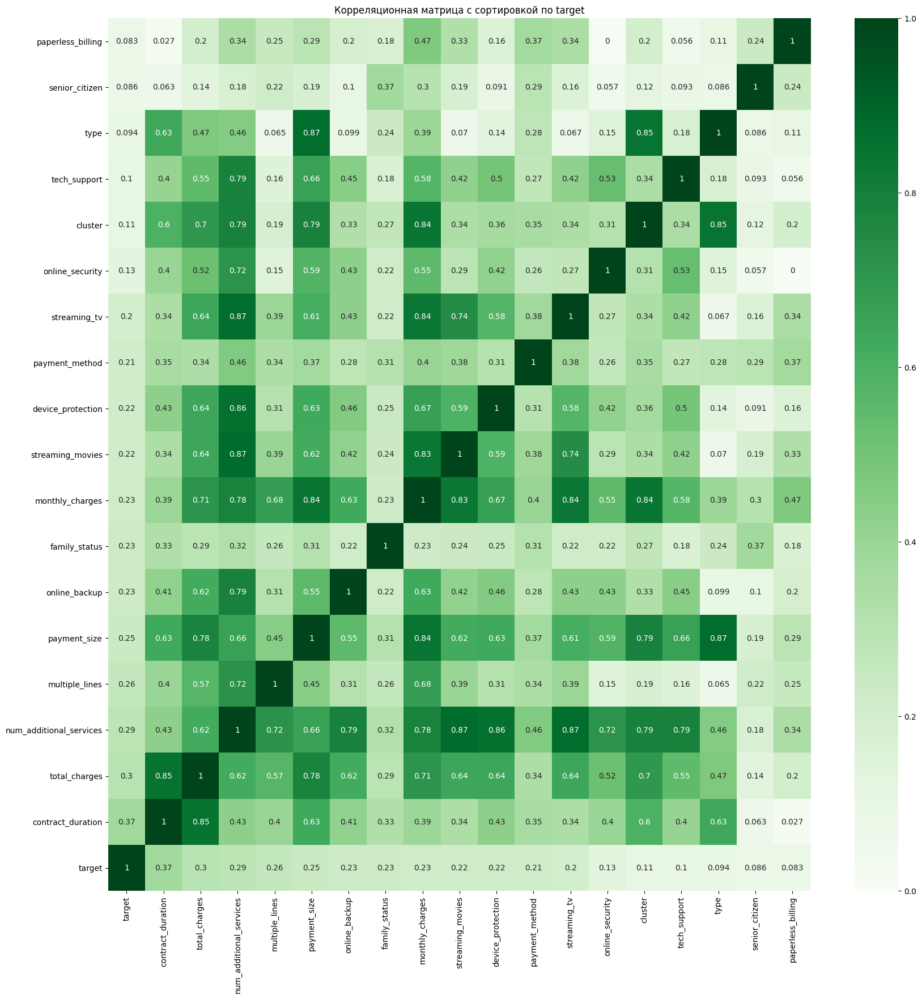

In [156]:
correlation_df = correlations(data_corr)

In [157]:
data_corr.columns

Index(['type', 'paperless_billing', 'payment_method', 'monthly_charges',
       'total_charges', 'target', 'senior_citizen', 'online_security',
       'online_backup', 'device_protection', 'tech_support', 'streaming_tv',
       'streaming_movies', 'multiple_lines', 'contract_duration',
       'payment_size', 'num_additional_services', 'family_status', 'cluster'],
      dtype='object')

В результате мы отобрали нужные признаки и избавились от мультиколлинеарности. 

### Выводы

**1. Распределение данных и выбросы**

- Количественные признаки:

 - begin_date и end_date: Даты варьируются с 2013-10-01 по 2020-02-01.
 - monthly_charges: Среднее значение — 64.76, максимальное — 118.75. Медиана (70.35) указывает на правостороннее скошенное распределение.
 - total_charges: Среднее — 2115.31, с максимально возможным значением 9221.38. Медиана (1343.35) ниже среднего, что свидетельствует о левостороннем сдвиге в распределении.
 - contract_duration: Средний срок — 898 дней, достаточно большое стандартное отклонение — 683 дня.
 - payment_size: Средний размер платежа — 551 ден. ед., медиана — 100 ден. ед. Распределение сильно скошено влево.
 - num_additional_services: В среднем пользователи имеют 2-3 дополнительных услуги.

Гистограммы показывают, что у пользователей, расторгнувших договор, расходы и длительность контракта существенно выше, чем у действующих клиентов.

- Качественные признаки:

 - Ушедшие клиенты чаще используют годовую оплату и автоматическую биллинг, имеют партнеров и пользуются дополнительными интернет-услугами.

**2. Тарифный план**

Распределение пользователей по типам подключения различается. Подключение через оптоволокно дороже, чем через DSL. При комбинации типа подключения и типа используемых услуг все пользователи очень четко распадаются на 4 группы клиентов по ежемесячно стоимости их услуг:

 - Комплексные услуги (интернет и телефон) через оптоволокно
 - Комплексные услуги (интернет и телефон) через цифровую абонентскую линия
 - Интернет через цифровую абонентскую линия
 - Телефон через цифровую абонентскую линия
 
Назовем такие группы клиентов по их месячной стоимости в зависимости от типа подключения и типа услуг - тарифным планом и добавим этот признак в таблицу.

**3. Портрет типичного клиента**

Были построены портреты ушедших и оставшихся пользователей. В результате было отмечено, что ушедшие клиенты тратят больше, имеют более длительные контракты и используют больше дополнительных услуг. Большинство ушедших клиентов имеют семью, что может влиять на финансовые решения.

**4. Сегменты пользователей**

Была проведена автоматическая сегментация пользователей с использование инструмента кластеризации KMeans.

Было определено оптимальное количество кластеров — 3. Кластеры имеют различия в типах пользователей, расходах и длительности контрактов. Условно, каждому кластеру можно дать следующие характеристики (названия).

Кластер 0: Премиум пользователи с высокими расходами.
Кластер 1: Базовые телефонные пользователи с низкими расходами.
Кластер 2: Базовые пользователи интернета с умеренными расходами.

**5. Корреляционный анализ**

Удалены признаки с высокой взаимной корреляцией, чтобы избежать мультиколлинеарности. Выделены наиболее значимые признаки для дальнейшего анализа.

## Обучение моделей

### Описание признаков и выбор метрики

In [158]:
data_corr.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7043 entries, 0002-ORFBO to 9995-HOTOH
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   type                     7043 non-null   object 
 1   paperless_billing        7043 non-null   bool   
 2   payment_method           7043 non-null   object 
 3   monthly_charges          7043 non-null   float64
 4   total_charges            7043 non-null   float64
 5   target                   7043 non-null   int32  
 6   senior_citizen           7043 non-null   bool   
 7   online_security          7043 non-null   bool   
 8   online_backup            7043 non-null   bool   
 9   device_protection        7043 non-null   bool   
 10  tech_support             7043 non-null   bool   
 11  streaming_tv             7043 non-null   bool   
 12  streaming_movies         7043 non-null   bool   
 13  multiple_lines           7043 non-null   bool   
 14  contract_durat

Часть наших категориальных признаков имеют тип 'bool' или 'number', но все они имеет числовой смысл (например cluster [0, 1, 2] не говорит о том, что кластер 2 лучше или больше чем кластер 0).

Чтобы данные признаки обрабатывались корректно, приведем все категориальные признаки в тип `category`.

In [159]:
# определим категориальные переменные
to_cat = [
    'type',
    'paperless_billing',
    'payment_method',
    'senior_citizen',
    'online_security',
    'online_backup',
    'device_protection',
    'tech_support',
    'streaming_tv',
    'streaming_movies',
    'multiple_lines',
    'family_status',
    'cluster'
]

In [160]:
# На всякий случай переведем категориальные переменные в тип `category`
data_corr[to_cat] = data_corr[to_cat].astype('category')

In [161]:
data_corr.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7043 entries, 0002-ORFBO to 9995-HOTOH
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   type                     7043 non-null   category
 1   paperless_billing        7043 non-null   category
 2   payment_method           7043 non-null   category
 3   monthly_charges          7043 non-null   float64 
 4   total_charges            7043 non-null   float64 
 5   target                   7043 non-null   int32   
 6   senior_citizen           7043 non-null   category
 7   online_security          7043 non-null   category
 8   online_backup            7043 non-null   category
 9   device_protection        7043 non-null   category
 10  tech_support             7043 non-null   category
 11  streaming_tv             7043 non-null   category
 12  streaming_movies         7043 non-null   category
 13  multiple_lines           7043 non-null   category
 14

**Выбор метрики:**

По условиям задачи:

- Основная метрика: **AUC-ROC**
- Дополнительная метрика: **Accuracy**

### Подготовка данных

In [162]:
# Выделим целевую переменную и входящие признаки в разные переменные
y = data_corr['target']
X = data_corr.drop('target', axis=1)

print(y.shape, X.shape)

(7043,) (7043, 18)


In [163]:
# Разделим данные на обучающий и тестовый набор
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=TEST_SIZE,
    random_state=RANDOM_STATE,
    stratify=y
)

# Проверим размеры выборок
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(5282, 18) (5282,) (1761, 18) (1761,)


### Создание пайплайна

In [164]:
data_corr.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7043 entries, 0002-ORFBO to 9995-HOTOH
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   type                     7043 non-null   category
 1   paperless_billing        7043 non-null   category
 2   payment_method           7043 non-null   category
 3   monthly_charges          7043 non-null   float64 
 4   total_charges            7043 non-null   float64 
 5   target                   7043 non-null   int32   
 6   senior_citizen           7043 non-null   category
 7   online_security          7043 non-null   category
 8   online_backup            7043 non-null   category
 9   device_protection        7043 non-null   category
 10  tech_support             7043 non-null   category
 11  streaming_tv             7043 non-null   category
 12  streaming_movies         7043 non-null   category
 13  multiple_lines           7043 non-null   category
 14

In [165]:
# Создадим списки с названиями признаков
ohe_columns = X_train.select_dtypes(include=['object', 'category']).columns.tolist()

num_columns = X_train.select_dtypes(include=['number', 'bool']).columns.tolist()

In [166]:
ohe_columns

['type',
 'paperless_billing',
 'payment_method',
 'senior_citizen',
 'online_security',
 'online_backup',
 'device_protection',
 'tech_support',
 'streaming_tv',
 'streaming_movies',
 'multiple_lines',
 'family_status',
 'cluster']

In [167]:
num_columns

['monthly_charges',
 'total_charges',
 'contract_duration',
 'payment_size',
 'num_additional_services']

In [168]:
# проверка что все колонки используются
len(X_train.columns) == len(ohe_columns) + len(num_columns)

True

In [169]:
# создаём пайплайн для подготовки признаков из списка ohe_columns
ohe_pipe = Pipeline(
    [('ohe', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False))]
)

In [170]:
# Создаем пайплайн для числовых признаков с масштабированием и полиномами
num_pipe = Pipeline([
    ('scaler', StandardScaler()),  # Масштабируем числовые признаки
    ('poly', PolynomialFeatures(degree=1, include_bias=False))  # Генерируем полиномиальные признаки
])

In [171]:
# Комбинируем обработчики для категориальных и числовых признаков
data_preprocessor = ColumnTransformer(
    [
        ('ohe', ohe_pipe, ohe_columns),  # Обработка категориальных признаков
        ('num', num_pipe, num_columns)    # Обработка числовых признаков
    ],
    remainder='passthrough'  # Оставляем остальные признаки без изменений
)

In [172]:
# создадим итоговый пайплайн
pipe = Pipeline([
    ('preprocessor', data_preprocessor),  # Препроцессор данных
    ('models', LogisticRegression(random_state=RANDOM_STATE, class_weight='balanced'))  # Модель
])

### Поиск лучшей модели

#### Базовые модели без перебора гиперпараметров

In [173]:
param_grid_base = [
    {
        'models': [DecisionTreeClassifier(random_state=RANDOM_STATE)]
    },
    {
        'models': [LogisticRegression(random_state=RANDOM_STATE, class_weight='balanced')]
    },
    {
        'models': [KNeighborsClassifier()]
    },
    {
        'models': [SVC(random_state=RANDOM_STATE, probability=False)] #отключим расчет вероятностей при подборей гиперпараметров
    },
    {
        'models': [CatBoostClassifier(random_seed=RANDOM_STATE, verbose=0)]
    },
    {
        'models': [LGBMClassifier(random_state=RANDOM_STATE, verbose=0)]
    },
    {
        'models': [RandomForestClassifier(random_state=RANDOM_STATE)]
    },
    {
        'models': [GradientBoostingClassifier(random_state=RANDOM_STATE)]
    }
]

In [174]:
%%time
gs, results, score = find_best_model(
    pipe,
    param_grid_base,
    X_train,
    y_train,
    cv=3,
    scoring='roc_auc',
    search_type='grid'
)

Лучшая модель и её параметры:
Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['type', 'paperless_billing',
                                                   'payment_method',
                                                   'senior_citizen',
                                                   'online_security',
                                                   'online_backup',
                                                   'device_protection',
           

In [175]:
results

,param_models,mean_fit_time,mean_score_time,params,mean_test_score
4,<catboost.core.CatBoostClassifier object at 0x0000023D6ACFCF10>,7.332677,0.055174,{'models': <catboost.core.CatBoostClassifier object at 0x0000023D6ACFCF10>},0.866186
5,"LGBMClassifier(random_state=231224, verbose=0)",2.964427,0.068223,"{'models': LGBMClassifier(random_state=231224, verbose=0)}",0.854347
7,GradientBoostingClassifier(random_state=231224),2.045800,0.051178,{'models': GradientBoostingClassifier(random_state=231224)},0.841588
6,RandomForestClassifier(random_state=231224),1.170322,0.144934,{'models': RandomForestClassifier(random_state=231224)},0.806660
3,SVC(random_state=231224),0.522741,0.968889,{'models': SVC(random_state=231224)},0.768971
1,"LogisticRegression(class_weight='balanced', random_state=231224)",0.090906,0.036029,"{'models': LogisticRegression(class_weight='balanced', random_state=231224)}",0.767538
2,KNeighborsClassifier(),0.068019,1.307439,{'models': KNeighborsClassifier()},0.751181
0,DecisionTreeClassifier(random_state=231224),0.099210,0.038916,{'models': DecisionTreeClassifier(random_state=231224)},0.634963


В базовом исполнении лучше всего показали себя бустинговые модели. 

Следом за ними следуют RandomForesst, SVC и LogisticRegression.

Попробуем подобрать гиперпараметры к следующим моделям из разных семейств (бустинг, деревья, SVC и логисическая регрессия):
- CatBoostClassifier
- RandomForestClassifier
- SVC
- LogisticRegression

Начнем с более простых моделей.

#### Подбор гиперпараметров с помощью Optuna

In [176]:
# Датафрейм для записи всех результатов
all_results = pd.DataFrame()

##### LogisticRegression

In [177]:
def objective_log_saga(trial):
    model_name = 'logistic'
    
    param = {}
        
    # Параметры модели
    param['C'] = trial.suggest_discrete_uniform('C', 0.01, 100, 0.01)
    param['solver'] = trial.suggest_categorical('solver', ['saga'])
    param['penalty'] = trial.suggest_categorical('penalty', ['elasticnet'])
    param['l1_ratio'] = trial.suggest_discrete_uniform('l1_ratio', 0.01, 1, 0.01)
    param['max_iter'] = trial.suggest_int('max_iter', 200, 400)
    
    # Параметры poly
    param['use_poly'] = trial.suggest_categorical('use_poly', [True, False])
    param['poly_degree'] = trial.suggest_int('poly_degree', 2, 3)
    
    # Записываем название модели в пользовательские атрибуты
    trial.set_user_attr('model_name', model_name)

    # Создаем пайплайн
    pipe = create_pipeline(
        model_name,
        **param
    )

    # Кросс-валидация
    scores = cross_val_score(pipe, X_train, y_train, cv=5, scoring='roc_auc')
    report_cross_validation_scores(trial, scores)
    
    # Возвращаем среднее значение ROC AUC
    return scores.mean()

In [178]:
study_log_saga = run_study(objective_log_saga, n_trials=30)

[I 2025-01-13 11:03:49,485] A new study created in memory with name: no-name-cd089b97-68eb-4ef5-b5df-b6c65eadd6be
Optimizing:  67%|██████████████████████████████████████████████▋                       | 20/30 [01:26<01:09,  6.96s/it][I 2025-01-13 11:05:23,375] Trial 20 finished with value: 0.8345663820882538 and parameters: {'C': 64.36, 'solver': 'saga', 'penalty': 'elasticnet', 'l1_ratio': 0.44, 'max_iter': 317, 'use_poly': True, 'poly_degree': 3}. Best is trial 18 with value: 0.8345759136908952.


Optimizing: 100%|██████████████████████████████████████████████████████████████████████| 30/30 [02:50<00:00,  5.67s/it]

Best score: 0.8346087921147392
Best model parameters: {'C': 3.76, 'solver': 'saga', 'penalty': 'elasticnet', 'l1_ratio': 0.01, 'max_iter': 272, 'use_poly': True, 'poly_degree': 3}
Best model:


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['type', 'paperless_billing',
                                                   'payment_method',
                                                   'senior_citizen',
                                                   'online_security',
                                                   'online_backup',
                                                   'device_protection',
                                                   'tech_support',
                                                   'streaming_tv',
                                                   'streaming_...
                                                 ('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler()),
                                                                  ('poly',
                                                                   PolynomialFeatures(degree=3,
                                                                                      include_bias=False))]),
                                                  ['monthly_charges',
                                                   'total_charges',
                                                   'contract_duration',
                                                   'payment_size',
                                                   'num_additional_services'])])),
                ('model',
                 LogisticRegression(C=3.76, class_weight='balanced',
                                    l1_ratio=0.01, max_iter=272,
                                    penalty='elasticnet', random_state=231224,
                                    solver='saga'))])

In [179]:
show_results(study_log_saga, show_terminator=True)

,number,value,datetime_start,datetime_complete,duration,params_C,params_l1_ratio,params_max_iter,params_penalty,params_poly_degree,params_solver,params_use_poly,user_attrs_model_name,system_attrs_terminator:cv_scores,state
29,29,0.834609,2025-01-13 11:06:30.457311,2025-01-13 11:06:39.713696,0 days 00:00:09.256385,3.76,0.01,272,elasticnet,3,saga,True,logistic,"[0.833238211713548, 0.8231849958757589, 0.8556813930551305, 0.828820188416148, 0.8321191715131109]",COMPLETE
27,27,0.834609,2025-01-13 11:06:09.377443,2025-01-13 11:06:18.793018,0 days 00:00:09.415575,15.72,0.16,276,elasticnet,3,saga,True,logistic,"[0.8332246229107215, 0.8232728895379497, 0.8556609869741183, 0.8288541985511682, 0.8320307451620583]",COMPLETE
28,28,0.834601,2025-01-13 11:06:18.795642,2025-01-13 11:06:30.454300,0 days 00:00:11.658658,10.60,0.18,273,elasticnet,3,saga,True,logistic,"[0.8332042397064818, 0.8232052790285722, 0.8557154031901507, 0.8288473965241642, 0.8320307451620583]",COMPLETE
25,25,0.834591,2025-01-13 11:05:54.497270,2025-01-13 11:06:01.802725,0 days 00:00:07.305455,28.46,0.03,303,elasticnet,3,saga,True,logistic,"[0.833177062100829, 0.8233743053020163, 0.8555793626500697, 0.8290310512532735, 0.8317926742169166]",COMPLETE
24,24,0.834584,2025-01-13 11:05:46.851910,2025-01-13 11:05:54.488969,0 days 00:00:07.637059,45.71,0.16,315,elasticnet,3,saga,True,logistic,"[0.8330819404810437, 0.8234013495057672, 0.8554841342720131, 0.8290922694963099, 0.831860694486957]",COMPLETE


100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [00:01<00:00, 20.62it/s]


In [180]:
# Сохранение результатов в all_results
all_results = pd.concat([all_results, pd.DataFrame(study_log_saga.trials_dataframe())], ignore_index=True)

Получилось достичь весьма неплохих результатов. Немного недотянули до таргета 0.85.

На графиках видно, что полиномизация признаков помогла улучшить качество, а перебор всех остальных значений не сильно влияет на качество модели.

Выше мы попробовали решатель `saga` со штрафом `elasticnet`, который одновременно учитывает оба типа регуляризации (l1, l2).

Попробуем другой решатель `liblinear` и штрафы l1 и l2 по отдельности.

In [181]:
# целевая функция для логистической регрессии (liblinear, l1/l2)
def objective_log_lib(trial):
    model_name = 'logistic'
    
    param = {}
        
    # Параметры model
    param['C'] = trial.suggest_discrete_uniform('C', 0.01, 100, 0.01)
    param['solver'] = trial.suggest_categorical('solver', ['liblinear'])
    param['penalty'] = trial.suggest_categorical('penalty', ['l1', 'l2'])
    param['max_iter'] = trial.suggest_int('max_iter', 200, 400)
    
    # Параметры poly
    param['use_poly'] = trial.suggest_categorical('use_poly', [True, False])
    param['poly_degree'] = trial.suggest_int('poly_degree', 2, 3)
    
    # Запишем название модели в пользовательские аттрибуты, чтобы сохранить в сводной таблице
    trial.set_user_attr('model_name', model_name)

    # Создадим пайплайн
    pipe = create_pipeline(
        model_name,
        **param
    )
    
    # Кросс-валидация
    scores = cross_val_score(pipe, X_train, y_train, cv=5, scoring='roc_auc')
    report_cross_validation_scores(trial, scores)
    
    # Возвращаем среднее значение ROC AUC
    return scores.mean()

In [182]:
study_log_lib = run_study(objective_log_lib, n_trials=30)

[I 2025-01-13 11:06:50,670] A new study created in memory with name: no-name-86caf804-d864-44ed-a211-26ab2e1a2c7b
Optimizing:  70%|█████████████████████████████████████████████████                     | 21/30 [03:59<00:41,  4.64s/it][I 2025-01-13 11:10:51,273] Trial 21 finished with value: 0.8334562545313581 and parameters: {'C': 0.27, 'solver': 'liblinear', 'penalty': 'l1', 'max_iter': 222, 'use_poly': True, 'poly_degree': 2}. Best is trial 11 with value: 0.8337503772806991.


Optimizing: 100%|██████████████████████████████████████████████████████████████████████| 30/30 [04:24<00:00,  8.83s/it]

Best score: 0.8339555892059096
Best model parameters: {'C': 1.25, 'solver': 'liblinear', 'penalty': 'l1', 'max_iter': 258, 'use_poly': True, 'poly_degree': 2}
Best model:


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['type', 'paperless_billing',
                                                   'payment_method',
                                                   'senior_citizen',
                                                   'online_security',
                                                   'online_backup',
                                                   'device_protection',
                                                   'tech_support',
                                                   'streaming_tv',
                                                   'streaming_...
                                                   'family_status',
                                                   'cluster']),
                                                 ('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler()),
                                                                  ('poly',
                                                                   PolynomialFeatures(include_bias=False))]),
                                                  ['monthly_charges',
                                                   'total_charges',
                                                   'contract_duration',
                                                   'payment_size',
                                                   'num_additional_services'])])),
                ('model',
                 LogisticRegression(C=1.25, class_weight='balanced',
                                    max_iter=258, penalty='l1',
                                    random_state=231224, solver='liblinear'))])

In [183]:
show_results(study_log_lib, show_terminator=True)

,number,value,datetime_start,datetime_complete,duration,params_C,params_max_iter,params_penalty,params_poly_degree,params_solver,params_use_poly,user_attrs_model_name,system_attrs_terminator:cv_scores,state
28,28,0.833956,2025-01-13 11:11:13.339956,2025-01-13 11:11:15.076530,0 days 00:00:01.736574,1.25,258,l1,2,liblinear,True,logistic,"[0.8333265389319198, 0.8222181655916596, 0.8591164166921743, 0.8233717647859061, 0.8317450600278884]",COMPLETE
11,11,0.833750,2025-01-13 11:10:14.075824,2025-01-13 11:10:17.078450,0 days 00:00:03.002626,2.51,215,l1,2,liblinear,True,logistic,"[0.8329052860442995, 0.822123510878531, 0.8590075842601096, 0.823773084379145, 0.8309424208414107]",COMPLETE
10,10,0.833746,2025-01-13 11:10:11.184092,2025-01-13 11:10:14.073645,0 days 00:00:02.889553,2.80,209,l1,2,liblinear,True,logistic,"[0.8330004076640848, 0.8220559003691534, 0.858919157909057, 0.8238615107301976, 0.8308948066523822]",COMPLETE
14,14,0.833734,2025-01-13 11:10:27.332593,2025-01-13 11:10:30.347231,0 days 00:00:03.014638,3.28,224,l1,2,liblinear,True,logistic,"[0.8330411740725642, 0.8219882898597757, 0.8589735741250892, 0.823902322892222, 0.8307655681393054]",COMPLETE
24,24,0.833611,2025-01-13 11:11:00.059766,2025-01-13 11:11:03.902613,0 days 00:00:03.842847,7.19,239,l1,2,liblinear,True,logistic,"[0.8329868188612584, 0.8218598298919584, 0.8585926606128625, 0.8240723735673231, 0.8305411012481719]",COMPLETE


100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [00:01<00:00, 24.82it/s]


In [184]:
# Сохранение результатов в all_results
all_results = pd.concat([all_results, pd.DataFrame(study_log_lib.trials_dataframe())], ignore_index=True)

С новым решателем качество модели практически не поменялось.

##### SVC

In [185]:
def objective_svc(trial):
    model_name = 'svm'
    param = {}
    
    # Предлагаем гиперпараметры для SVC
    param['C'] = trial.suggest_discrete_uniform('C', 0.01, 100, 0.01)
    param['kernel'] = trial.suggest_categorical('kernel', ['poly', 'rbf', 'sigmoid'])  # Ядро
    param['degree'] = trial.suggest_int('degree', 1, 10)
    
    trial.set_user_attr('model_name', model_name)

    # Создаем пайплайн с SVC
    pipe = create_pipeline(
        model_name,
        **param
    )

    # Кросс-валидация
    scores = cross_val_score(pipe, X_train, y_train, cv=5, scoring='roc_auc')
    report_cross_validation_scores(trial, scores)
    
    # Возвращаем среднее значение ROC AUC
    return scores.mean()

In [186]:
study_svc = run_study(objective_svc, n_trials=30)

[I 2025-01-13 11:11:17,890] A new study created in memory with name: no-name-9a82baaf-4161-4a38-93fd-d57268d52afc
Optimizing:  83%|██████████████████████████████████████████████████████████▎           | 25/30 [01:31<00:15,  3.08s/it][I 2025-01-13 11:12:53,553] Trial 25 finished with value: 0.7439059451581069 and parameters: {'C': 22.250000000000004, 'kernel': 'rbf', 'degree': 6}. Best is trial 23 with value: 0.7682434303830884.


Optimizing: 100%|██████████████████████████████████████████████████████████████████████| 30/30 [01:52<00:00,  3.74s/it]

Best score: 0.7682434303830884
Best model parameters: {'C': 0.27, 'kernel': 'rbf', 'degree': 6}
Best model:


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['type', 'paperless_billing',
                                                   'payment_method',
                                                   'senior_citizen',
                                                   'online_security',
                                                   'online_backup',
                                                   'device_protection',
                                                   'tech_support',
                                                   'streaming_tv',
                                                   'streaming_movies',
                                                   'multiple_lines',
                                                   'family_status',
                                                   'cluster']),
                                                 ('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['monthly_charges',
                                                   'total_charges',
                                                   'contract_duration',
                                                   'payment_size',
                                                   'num_additional_services'])])),
                ('model', SVC(C=0.27, degree=6, random_state=231224))])

In [187]:
show_results(study_svc, show_terminator=True)

,number,value,datetime_start,datetime_complete,duration,params_C,params_degree,params_kernel,user_attrs_model_name,system_attrs_terminator:cv_scores,state
23,23,0.768243,2025-01-13 11:12:43.817983,2025-01-13 11:12:46.608580,0 days 00:00:02.790597,0.27,6,rbf,svm,"[0.7618630248675091, 0.7370965342852893, 0.7875522905825936, 0.7702887460463218, 0.7844165561337277]",COMPLETE
24,24,0.768243,2025-01-13 11:12:46.610586,2025-01-13 11:12:49.402397,0 days 00:00:02.791811,0.27,6,rbf,svm,"[0.7618630248675091, 0.7370965342852893, 0.7875522905825936, 0.7702887460463218, 0.7844165561337277]",COMPLETE
21,21,0.767005,2025-01-13 11:12:37.373342,2025-01-13 11:12:40.270364,0 days 00:00:02.897022,0.65,6,rbf,svm,"[0.7708724011414594, 0.733702486714535, 0.784715845321906, 0.7679760568649459, 0.7777573716967655]",COMPLETE
11,11,0.764615,2025-01-13 11:12:00.531546,2025-01-13 11:12:03.615598,0 days 00:00:03.084052,2.39,4,rbf,svm,"[0.7613806223671695, 0.7303692886022204, 0.7960820324456688, 0.7623779886406148, 0.7728667142808557]",COMPLETE
10,10,0.763813,2025-01-13 11:11:57.440244,2025-01-13 11:12:00.531546,0 days 00:00:03.091302,2.78,4,rbf,svm,"[0.7598450876477783, 0.731356402039133, 0.7940210182634425, 0.7618610345883073, 0.7719824507703295]",COMPLETE


100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [00:01<00:00, 27.41it/s]


In [188]:
# Сохранение результатов в all_results
all_results = pd.concat([all_results, pd.DataFrame(study_svc.trials_dataframe())], ignore_index=True)

Лучше всех справилось `rbf` ядро, но качество модели не очень хорошее. 

##### RandomForestClassifier

In [189]:
def objective_rfc(trial):
    model_name = 'random_forest'
    param = {}
    
    # Предлагаем гиперпараметры для RandomForestClassifier
    param['n_estimators'] = trial.suggest_int('n_estimators', 10, 1000, 10)  # Количество деревьев в лесу
    param['max_depth'] = trial.suggest_int('max_depth', 1, 30)          # Максимальная глубина дерева
    param['min_samples_split'] = trial.suggest_int('min_samples_split', 2, 30)  # Минимальное количество образцов, необходимых для разделения узла
    param['min_samples_leaf'] = trial.suggest_int('min_samples_leaf', 1, 30)      # Минимальное количество образцов, необходимых для листа
        
    trial.set_user_attr('model_name', model_name)

    # Создаем пайплайн с RandomForestClassifier
    pipe = create_pipeline(
        model_name,
        **param
    )

    # Кросс-валидация
    scores = cross_val_score(pipe, X_train, y_train, cv=5, scoring='roc_auc')
    report_cross_validation_scores(trial, scores)
    
    # Возвращаем среднее значение ROC AUC
    return scores.mean()

In [190]:
study_rfc = run_study(objective_rfc, n_trials=30)

[I 2025-01-13 11:13:12,114] A new study created in memory with name: no-name-ee5b0402-b27d-42b7-97cf-52790427a47c
Optimizing:  73%|███████████████████████████████████████████████████▎                  | 22/30 [04:13<01:18,  9.85s/it][I 2025-01-13 11:17:37,757] Trial 22 finished with value: 0.8280555872385073 and parameters: {'n_estimators': 490, 'max_depth': 17, 'min_samples_split': 18, 'min_samples_leaf': 12}. Best is trial 18 with value: 0.8296321960911233.


Optimizing: 100%|██████████████████████████████████████████████████████████████████████| 30/30 [05:12<00:00, 10.41s/it]

Best score: 0.8296321960911233
Best model parameters: {'n_estimators': 300, 'max_depth': 12, 'min_samples_split': 18, 'min_samples_leaf': 11}
Best model:


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['type', 'paperless_billing',
                                                   'payment_method',
                                                   'senior_citizen',
                                                   'online_security',
                                                   'online_backup',
                                                   'device_protection',
                                                   'tech_support',
                                                   'streaming_tv',
                                                   'streaming_...,
                                                   'multiple_lines',
                                                   'family_status',
                                                   'cluster']),
                                                 ('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['monthly_charges',
                                                   'total_charges',
                                                   'contract_duration',
                                                   'payment_size',
                                                   'num_additional_services'])])),
                ('model',
                 RandomForestClassifier(class_weight='balanced', max_depth=12,
                                        min_samples_leaf=11,
                                        min_samples_split=18, n_estimators=300,
                                        random_state=231224))])

In [191]:
show_results(study_rfc, show_terminator=True)

,number,value,datetime_start,datetime_complete,duration,params_max_depth,params_min_samples_leaf,params_min_samples_split,params_n_estimators,user_attrs_model_name,system_attrs_terminator:cv_scores,state
18,18,0.829632,2025-01-13 11:16:56.779312,2025-01-13 11:17:04.095024,0 days 00:00:07.315712,12,11,18,300,random_forest,"[0.8329256692485393, 0.8133341446594458, 0.842199775533109, 0.8289494269292249, 0.8307519640852974]",COMPLETE
26,26,0.829554,2025-01-13 11:17:59.949398,2025-01-13 11:18:08.379780,0 days 00:00:08.430382,11,4,25,340,random_forest,"[0.8338021470308465, 0.8131583573350641, 0.8421249532360643, 0.8294187667925043, 0.8292657211849132]",COMPLETE
21,21,0.828914,2025-01-13 11:17:13.840002,2025-01-13 11:17:25.989105,0 days 00:00:12.149103,11,11,20,510,random_forest,"[0.8305340399510802, 0.8126918448203588, 0.8418460701288984, 0.8287521681461074, 0.8307451620582934]",COMPLETE
27,27,0.828800,2025-01-13 11:18:08.381879,2025-01-13 11:18:13.793328,0 days 00:00:05.411449,16,12,26,220,random_forest,"[0.8320627802690582, 0.8118737576568902, 0.8436077951229467, 0.826391864775703, 0.8300649593578886]",COMPLETE
6,6,0.828774,2025-01-13 11:14:19.788552,2025-01-13 11:14:32.507581,0 days 00:00:12.719029,10,6,9,520,random_forest,"[0.8327761924174479, 0.8135843035441429, 0.8453083018739584, 0.8244192769445294, 0.8277794782845288]",COMPLETE


100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [00:01<00:00, 22.17it/s]


In [192]:
# Сохранение результатов в all_results
all_results = pd.concat([all_results, pd.DataFrame(study_rfc.trials_dataframe())], ignore_index=True)

Качество модели получить немного хуже чем у логистической регрессии, тем не менее оно ниже установленного порога 0.85, а значит модель не удовлетворяет необходимым условиям.

##### CatBoost

In [193]:
def objective_cat(trial):
    model_name = 'catboost'
    param = {}

    # Предлагаем гиперпараметры для CatBoostClassifier
    param['iterations'] = trial.suggest_int('iterations', 100, 1000)  # Количество итераций
    param['learning_rate'] = trial.suggest_discrete_uniform('learning_rate', 0.01, 1, 0.01)  # Темп обучения
    param['depth'] = trial.suggest_int('depth', 2, 4)  # Глубина деревьев
    param['l2_leaf_reg'] = trial.suggest_discrete_uniform('l2_leaf_reg', 0.01, 1, 0.01)  # Регуляризация
    param['bagging_temperature'] = trial.suggest_discrete_uniform('bagging_temperature', 0.01, 1, 0.01)  # Температура бэггинга
    
    trial.set_user_attr('model_name', model_name)

    # Создаем пайплайн
    pipe = create_pipeline(
        model_name,
        **param
    )

    # Кросс-валидация
    scores = cross_val_score(pipe, X_train, y_train, cv=5, scoring='roc_auc')
    report_cross_validation_scores(trial, scores)
    
    # Возвращаем среднее значение ROC AUC
    return scores.mean()

In [194]:
study_cat = run_study(objective_cat, n_trials=60)

[I 2025-01-13 11:18:26,975] A new study created in memory with name: no-name-6f41957d-1156-4f43-9e5c-1940a2f57805
Optimizing:  33%|███████████████████████▎                                              | 20/60 [02:38<06:09,  9.25s/it][I 2025-01-13 11:21:17,081] Trial 20 finished with value: 0.9299477613219548 and parameters: {'iterations': 990, 'learning_rate': 0.33, 'depth': 2, 'l2_leaf_reg': 0.65, 'bagging_temperature': 0.19}. Best is trial 1 with value: 0.9322439142902187.


Optimizing:  70%|█████████████████████████████████████████████████                     | 42/60 [05:51<01:58,  6.60s/it][I 2025-01-13 11:24:24,772] Trial 42 finished with value: 0.9300774529237504 and parameters: {'iterations': 490, 'learning_rate': 0.42000000000000004, 'depth': 2, 'l2_leaf_reg': 0.09999999999999999, 'bagging_temperature': 0.05}. Best is trial 41 with value: 0.9338924863210728.


Optimizing: 100%|██████████████████████████████████████████████████████████████████████| 60/60 [08:02<00:00,  8.05s/it]

Best score: 0.9356706060046175
Best model parameters: {'iterations': 750, 'learning_rate': 0.26, 'depth': 2, 'l2_leaf_reg': 0.02, 'bagging_temperature': 0.01}
Best model:


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['type', 'paperless_billing',
                                                   'payment_method',
                                                   'senior_citizen',
                                                   'online_security',
                                                   'online_backup',
                                                   'device_protection',
                                                   'tech_support',
                                                   'streaming_tv',
                                                   'streaming_movies',
                                                   'multiple_lines',
                                                   'family_status',
                                                   'cluster']),
                                                 ('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['monthly_charges',
                                                   'total_charges',
                                                   'contract_duration',
                                                   'payment_size',
                                                   'num_additional_services'])])),
                ('model',
                 <catboost.core.CatBoostClassifier object at 0x0000023D751D9EE0>)])

In [195]:
show_results(study_cat, show_terminator=True)

,number,value,datetime_start,datetime_complete,duration,params_bagging_temperature,params_depth,params_iterations,params_l2_leaf_reg,params_learning_rate,user_attrs_model_name,system_attrs_terminator:cv_scores,state
55,55,0.935671,2025-01-13 11:25:49.693102,2025-01-13 11:25:58.669061,0 days 00:00:08.975959,0.01,2,750,0.02,0.26,catboost,"[0.9341826335099878, 0.9110989412194231, 0.9544332210998876, 0.9419310954664489, 0.9367071387273408]",COMPLETE
57,57,0.934394,2025-01-13 11:26:07.197592,2025-01-13 11:26:15.948761,0 days 00:00:08.751169,0.05,2,771,0.01,0.26,catboost,"[0.9350794944965348, 0.9124241072032236, 0.94610073801993, 0.9433799272183111, 0.9349862258953169]",COMPLETE
41,41,0.933892,2025-01-13 11:24:10.939621,2025-01-13 11:24:18.847188,0 days 00:00:07.907567,0.05,2,678,0.11,0.25,catboost,"[0.9322666123114554, 0.9131948670101281, 0.9477536305819134, 0.9428969833010237, 0.9333503384008435]",COMPLETE
54,54,0.932969,2025-01-13 11:25:41.879443,2025-01-13 11:25:49.688982,0 days 00:00:07.809539,0.04,2,668,0.11,0.31,catboost,"[0.9299836934366082, 0.9133774153854475, 0.950154746114342, 0.9389518076386763, 0.9323776485392646]",COMPLETE
43,43,0.932703,2025-01-13 11:24:24.773189,2025-01-13 11:24:31.939075,0 days 00:00:07.165886,0.11,2,594,0.23,0.31,catboost,"[0.9275512977306699, 0.9077116546996065, 0.9497466244940992, 0.9451824643743836, 0.9333231302928272]",COMPLETE


100%|██████████████████████████████████████████████████████████████████████████████████| 60/60 [00:02<00:00, 21.90it/s]


In [196]:
# Сохранение результатов в all_results
all_results = pd.concat([all_results, pd.DataFrame(study_cat.trials_dataframe())], ignore_index=True)

Существенный прогресс в качестве по сравнению со стандартными моделями!

Данная модель показала метрику ROC_AUC = 0.935, что выше чем 0.85 по условиям задачи.

На графике Terminator Imporvement видно, что дальнейшие поиски оптимальной моделе в заданном пространстве параметров не приводят к существенному улучшению качество модели, а наоборот начинает расти ошибка на кроссвалидации. Если еще больше увеличить число эпох, то вероятно модель может начать переобучаться.

Значит можем остановиться на текущей версии модели.

##### Dummy-модели

In [197]:
param_grid_dummy = [
    {
        'models': [DummyClassifier(random_state=RANDOM_STATE)],
        'models__strategy': ['most_frequent', 'prior', 'stratified', 'uniform'],
    },
    {
        'models': [DummyClassifier(random_state=RANDOM_STATE, strategy='constant')],
        'models__constant': [0, 1]
    }
]

In [198]:
%%time
gs_dummy, results_dummy, score_dummy = find_best_model(
    pipe,
    param_grid_dummy,
    X_train,
    y_train,
    cv=3,
    scoring='roc_auc',
    search_type='grid'
)

Лучшая модель и её параметры:
Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['type', 'paperless_billing',
                                                   'payment_method',
                                                   'senior_citizen',
                                                   'online_security',
                                                   'online_backup',
                                                   'device_protection',
           

In [199]:
results_dummy

,param_models,mean_fit_time,mean_score_time,params,mean_test_score
0,DummyClassifier(random_state=231224),0.058185,0.033986,"{'models': DummyClassifier(random_state=231224), 'models__strategy': 'most_frequent'}",0.500000
1,DummyClassifier(random_state=231224),0.060474,0.028999,"{'models': DummyClassifier(random_state=231224), 'models__strategy': 'prior'}",0.500000
3,DummyClassifier(random_state=231224),0.042820,0.031957,"{'models': DummyClassifier(random_state=231224), 'models__strategy': 'uniform'}",0.500000
4,"DummyClassifier(random_state=231224, strategy='constant')",0.046567,0.031747,"{'models': DummyClassifier(random_state=231224, strategy='constant'), 'models__constant': 0}",0.500000
5,"DummyClassifier(random_state=231224, strategy='constant')",0.054756,0.033819,"{'models': DummyClassifier(random_state=231224, strategy='constant'), 'models__constant': 1}",0.500000
2,DummyClassifier(random_state=231224),0.062912,0.030682,"{'models': DummyClassifier(random_state=231224), 'models__strategy': 'stratified'}",0.499592


Dummy модели показывают стабильно ROC-AUC=0.5, что намного хуже чем у нашей лучшей модели.

#### Выбор лучшей модели

In [200]:
all_results.sort_values(by='value', ascending=False).head()

,number,value,datetime_start,datetime_complete,duration,params_C,params_l1_ratio,params_max_iter,params_penalty,params_poly_degree,params_solver,params_use_poly,user_attrs_model_name,system_attrs_terminator:cv_scores,state,params_degree,params_kernel,params_max_depth,params_min_samples_leaf,params_min_samples_split,params_n_estimators,params_bagging_temperature,params_depth,params_iterations,params_l2_leaf_reg,params_learning_rate
175,55,0.935671,2025-01-13 11:25:49.693102,2025-01-13 11:25:58.669061,0 days 00:00:08.975959,NaN,NaN,NaN,NaN,NaN,NaN,NaN,catboost,"[0.9341826335099878, 0.9110989412194231, 0.9544332210998876, 0.9419310954664489, 0.9367071387273408]",COMPLETE,NaN,NaN,NaN,NaN,NaN,NaN,0.01,2.0,750.0,0.02,0.26
177,57,0.934394,2025-01-13 11:26:07.197592,2025-01-13 11:26:15.948761,0 days 00:00:08.751169,NaN,NaN,NaN,NaN,NaN,NaN,NaN,catboost,"[0.9350794944965348, 0.9124241072032236, 0.94610073801993, 0.9433799272183111, 0.9349862258953169]",COMPLETE,NaN,NaN,NaN,NaN,NaN,NaN,0.05,2.0,771.0,0.01,0.26
161,41,0.933892,2025-01-13 11:24:10.939621,2025-01-13 11:24:18.847188,0 days 00:00:07.907567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,catboost,"[0.9322666123114554, 0.9131948670101281, 0.9477536305819134, 0.9428969833010237, 0.9333503384008435]",COMPLETE,NaN,NaN,NaN,NaN,NaN,NaN,0.05,2.0,678.0,0.11,0.25
174,54,0.932969,2025-01-13 11:25:41.879443,2025-01-13 11:25:49.688982,0 days 00:00:07.809539,NaN,NaN,NaN,NaN,NaN,NaN,NaN,catboost,"[0.9299836934366082, 0.9133774153854475, 0.950154746114342, 0.9389518076386763, 0.9323776485392646]",COMPLETE,NaN,NaN,NaN,NaN,NaN,NaN,0.04,2.0,668.0,0.11,0.31
163,43,0.932703,2025-01-13 11:24:24.773189,2025-01-13 11:24:31.939075,0 days 00:00:07.165886,NaN,NaN,NaN,NaN,NaN,NaN,NaN,catboost,"[0.9275512977306699, 0.9077116546996065, 0.9497466244940992, 0.9451824643743836, 0.9333231302928272]",COMPLETE,NaN,NaN,NaN,NaN,NaN,NaN,0.11,2.0,594.0,0.23,0.31


In [201]:
final_study_results = pd.DataFrame(all_results.groupby('user_attrs_model_name')['value'].max())
final_study_results.columns = ['ROC-AUC']
final_study_results

,ROC-AUC
user_attrs_model_name,
catboost,0.935671
logistic,0.834609
random_forest,0.829632
svm,0.768243


Явным победителем среди модедей стала CatBoostClassifier с показателем ROC-AUC = 0.93.

Случайный лес и логистическая регрессия немного не дотянули до порога, а SVC показа себя хуже всего. Скорей всего в данных есть нелинейный связи, которые не получилось уловить этим моделям. Для улучшения работы линейных моделей можно порекомендовать добавть больше входящих признаков (например, о действительных тарифных планах, фактических объемах потребляемого трафика, звонков, прошлых рекламных кампаниях и т.д.).

В любом случае, в качестве лучшей модели выберем **CatBoostClassifier.**

In [202]:
# запишем лучшую модель
final_model = extract_best_pipe(study_cat)
final_model

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['type', 'paperless_billing',
                                                   'payment_method',
                                                   'senior_citizen',
                                                   'online_security',
                                                   'online_backup',
                                                   'device_protection',
                                                   'tech_support',
                                                   'streaming_tv',
                                                   'streaming_movies',
                                                   'multiple_lines',
                                                   'family_status',
                                                   'cluster']),
                                                 ('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['monthly_charges',
                                                   'total_charges',
                                                   'contract_duration',
                                                   'payment_size',
                                                   'num_additional_services'])])),
                ('model',
                 <catboost.core.CatBoostClassifier object at 0x0000023D75CD65B0>)])

In [203]:
# На всякий случай перепроверим верно ли записалась модель и расчитаем метрику кроссвалидации на ней
cross_val_score(final_model, X_train, y_train, cv=5, scoring='roc_auc').mean()

0.9356706060046175

#### Оценка качества лучшей модели

Метрика ROC-AUC на кросс-валидации: 0.9356706060046175
Метрика ROC-AUC на тестовой выборке: 0.9237122231738651

Accuracy: 0.938671209540034
Recall: 0.6472727272727272
Precision: 0.9417989417989417
График ROC-AUC на тестовой выборке


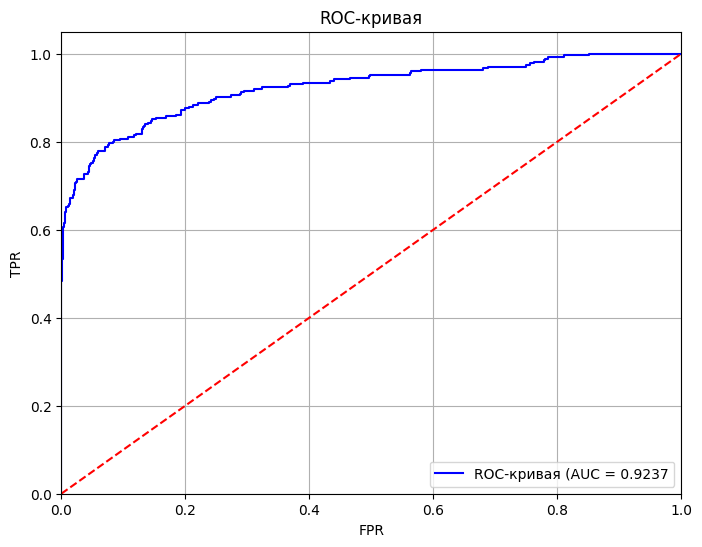

Матрица ошибок на тестовой выборке


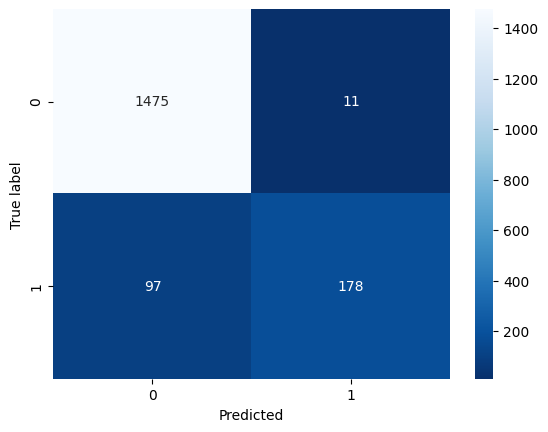

In [204]:
final_model.fit(X_train, y_train)

# Предсказания и вероятности
y_test_pred = final_model.predict(X_test)
y_test_proba = final_model.predict_proba(X_test)[:, 1]

# Метрики
roc_auc_cv = study_cat.best_trial.value
roc_auc_test = roc_auc_score(y_test, y_test_proba)

print(f'Метрика ROC-AUC на кросс-валидации: {roc_auc_cv}')
print(f'Метрика ROC-AUC на тестовой выборке: {roc_auc_test}')
print()


# Рассчет метрик
accuracy = accuracy_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
precision = precision_score(y_test, y_test_pred)

# Вывод результатов
print(f'Accuracy: {accuracy}')
print(f'Recall: {recall}')
print(f'Precision: {precision}')

# Построение ROC-кривой и матрицы ошибок
print("График ROC-AUC на тестовой выборке")
plot_roc_curve(y_test, y_test_proba)

print("Матрица ошибок на тестовой выборке")
cm = confusion_matrix(y_test, y_test_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues_r')
plt.ylabel('True label')
plt.xlabel('Predicted')
plt.show()

- **ROC-AUC:** Значения ROC-AUC близки к 1, что указывает на высокую способность модели различать положительные и отрицательные классы. Значение **0.9356** на кросс-валидации и **0.9237** на тестовой выборке говорит о том, что модель хорошо обобщает данные и практически не переобучена.

- **Acuracy:** Доля правильных предсказаний составляет примерно **93.86%**. Это свидетельствует о том, что модель в целом хорошо справляется с задачей классификации. Однако стоит помнить, что этот показатель может быть обманчивым в случае несбалансированных классов.

- **Recall:** Recall (полнота) составляет **64.73%**, что означает, что модель правильно предсказывает 64.73% всех положительных случаев. Это может указывать на то, что модель не так хорошо идентифицирует положительные классы, и есть место для улучшения в этой области.

- **Precision:**  Precision (точность) составляет **94.18%**, что означает, что из всех предсказанных положительных случаев 94.18% действительно являются положительными. Это очень хороший показатель, указывающий на то, что модель в основном правильно классифицирует положительные случаи.

Высокие значения ROC-AUC и accuracy при низких значениях precision и recall могут указывать на несколько факторов, связанных с характеристиками данных и моделью:

1. Несбалансированные классы

В нашем наборе данных классы сильно несбалансированы (всего 16% положительных меток), это может привести к высоким значениям Accuracy и ROC-AUC, даже если модель плохо распознает положительные случаи. Модель может чаще предсказывать отрицательный класс и все равно получать высокую точность.

2. ROC-AUC как мера качества

ROC-AUC измеряет способность модели различать классы, а не абсолютное количество правильных предсказаний. Высокое значение AUC может быть достигнуто, если модель хорошо различает классы на различных порогах, даже если сам порог для принятия решения о положительном классе не оптимален.

3. Порог классификации

Стандартный порог для бинарной классификации (0.5) может не быть оптимальным для нашей задачи. Если мы попробуем увеличить порог, это может повысить precision, но снизить recall, и наоборот. Вероятно, модель делает много предсказаний для положительного класса, но эти предсказания не очень точные, что объясняет низкий recall.

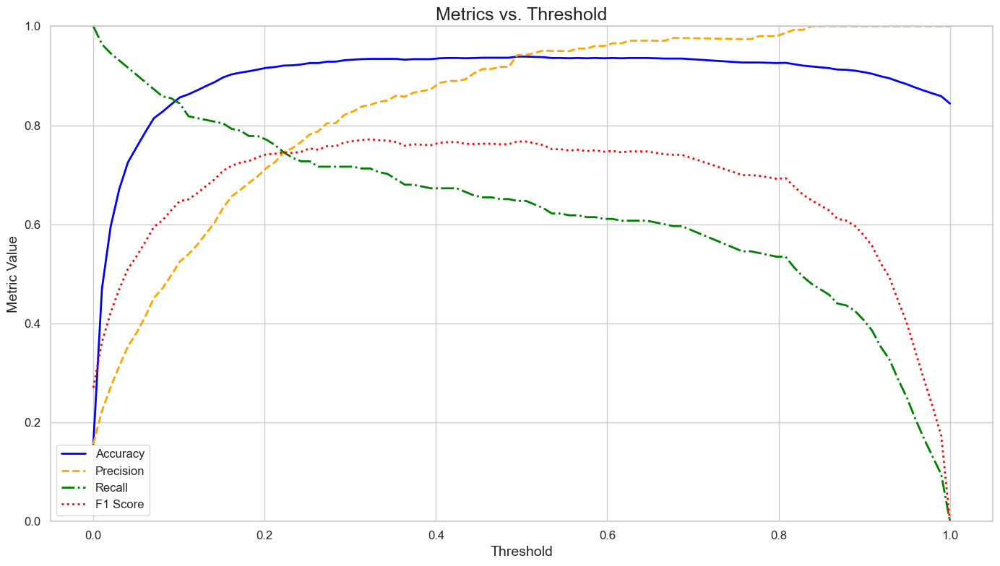

In [205]:
# Визуализируем метрики, зависящие от порога классификации
mectics_df = plot_metrics_vs_threshold(final_model, X_test, y_test)

Максимизация ROC-AUC позволила добиться того, что модель достаточно хорошо различает классы на широком диапазоне порогов классификации. Это видно по тому, как стабильна ведет себя метрика Accuracy в диапазоне примерно от 0.2 до 0.8.

Интересно, что с получившейся моделью при желании мы сможем добиться 100% precision (точности) предсказаний, имея при этом высокую accuracy и неплохой recall(полноту). Это может быть полезным, в случае если расходы на маркетинговую компанию будут высокими и нам будет важно выдать промокоды только тем пользователям, кто практически гарантированно уйдет в ближайшее время.

Если наоборот, стоиомость выдачи одного промокода будет невысокой, то вероятно лучше будет максимизировать recall, т.е. раздать промокоды всем пользователям, по которым мы ожидаем хотя бы небольшую вероятность их ухода.

Высокий ROC-AUC говорит о том, что модель в целом хорошо различаеть классы на широком диапазоне пороговых значений классификации, что делает ее гибкой для адаптации под любые поставленные цели.

In [206]:
mectics_df.sort_values('Accuracy', ascending=False)

,Threshold,Accuracy,Recall,Precision,F1 Score
50,0.505051,0.938671,0.647273,0.941799,0.767241
49,0.494949,0.938671,0.647273,0.941799,0.767241
51,0.515152,0.938103,0.640000,0.946237,0.763557
52,0.525253,0.937535,0.632727,0.950820,0.759825
45,0.454545,0.936400,0.654545,0.913706,0.762712
...,...,...,...,...,...
4,0.040404,0.725156,0.916364,0.353436,0.510121
3,0.030303,0.671210,0.930909,0.313725,0.469294
2,0.020202,0.595116,0.945455,0.271399,0.421736
1,0.010101,0.470187,0.963636,0.223064,0.362269


По условиям задачи вспомогательной метриков является **Accuracy** (доля верных предсказаний).

Из таблицы выше видно, что максимальный Accuracy достигается в районе 50% (стандартный порог классификации).

Поэтому вручную менять порог классификации не будем и используем стандартные 50%.

In [207]:
# Получаем важность признаков
feature_importances = final_model.named_steps['model'].get_feature_importance()

# Получаем названия признаков после OHE
feature_names = final_model.named_steps['preprocessor'].get_feature_names_out()

# соберем df важности и названия в один df
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importances
})
# Сортируем по важности
importance_df = importance_df.sort_values(by='Importance', ascending=False)

importance_df

,Feature,Importance
21,num__contract_duration,70.512504
20,num__total_charges,10.413490
22,num__payment_size,6.792334
19,num__monthly_charges,4.028141
23,num__num_additional_services,1.506703
5,ohe__payment_method_mailed check,1.245821
9,ohe__device_protection_1.0,0.864398
15,ohe__family_status_single no kids,0.810335
13,ohe__multiple_lines_1.0,0.515505
16,ohe__family_status_single with kids,0.505282


Больше всего на вероятность ухода клиента влиют следующие показатели:
- **num__contract_duration:** 70.512504
- **num__total_charges:** 10.413490
- **num__payment_size:** 6.792334
- **num__monthly_charges:** 4.028141

Примечательно, что все количественные непрерывные признаки оказались важней категориальных. В целом это можно объяснить тем, что эти признаки получились сложными и во многих случая зависят или определяются другими категориальными (например, месячный платеж зависит от набора и количества доп. услуг, типа подключения, типа услуг и т.д.).

Самый важный признак - длительность контракта. Этот признак существенней всего влияет на вероятность ухода клиентов.

#### SHAP-values

In [208]:
final_preprocessor = final_model.named_steps['preprocessor']

# Обработка данных
X_train_processed = final_preprocessor.fit_transform(X_train)
X_test_processed = final_preprocessor.transform(X_test)

# Преобразование обратно в DataFrame с сохранением названий колонок
X_train_processed = pd.DataFrame(X_train_processed, columns=feature_names)
X_test_processed = pd.DataFrame(X_test_processed, columns=feature_names)

In [209]:
# сгенерируем оценщик значений Шепли, который соответствует построенной модели бустинга
explainer = shap.TreeExplainer(final_model.named_steps['model'])
# вычислим значения Шепли для тестовой выборки
shap_values = explainer(X_test_processed)

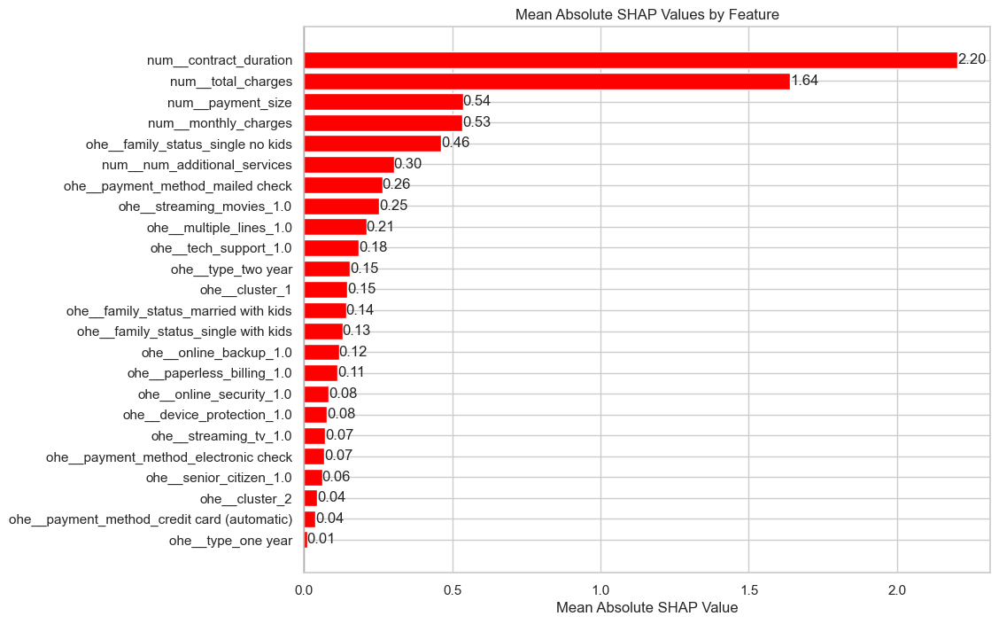

In [210]:
shap_values_array = shap_values.values

# Сортируем абсолютные значения SHAP
mean_shap_values = np.mean(np.abs(shap_values_array), axis=0)
sorted_indices = np.argsort(mean_shap_values)[::-1]

# Создаем график с увеличенной высотой
plt.figure(figsize=(10, 8))  # Увеличена высота графика
bars = plt.barh(np.array(feature_names)[sorted_indices], mean_shap_values[sorted_indices], color='red')
plt.xlabel('Mean Absolute SHAP Value')
plt.title('Mean Absolute SHAP Values by Feature')
plt.axvline(0, color='black', lw=0.8)
plt.gca().invert_yaxis()  # Инвертируем ось Y для правильного порядка

# Добавляем подписи значений
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, 
             f'{bar.get_width():.2f}', 
             va='center')

plt.show()

Анализ важности признаков на основе ценности Шепли ппоказывает ту же картину, что и коэффициенты полученные из модели.

Посмотрим на знак, с которым данные признаки влияли на вероятность ухода клиента.

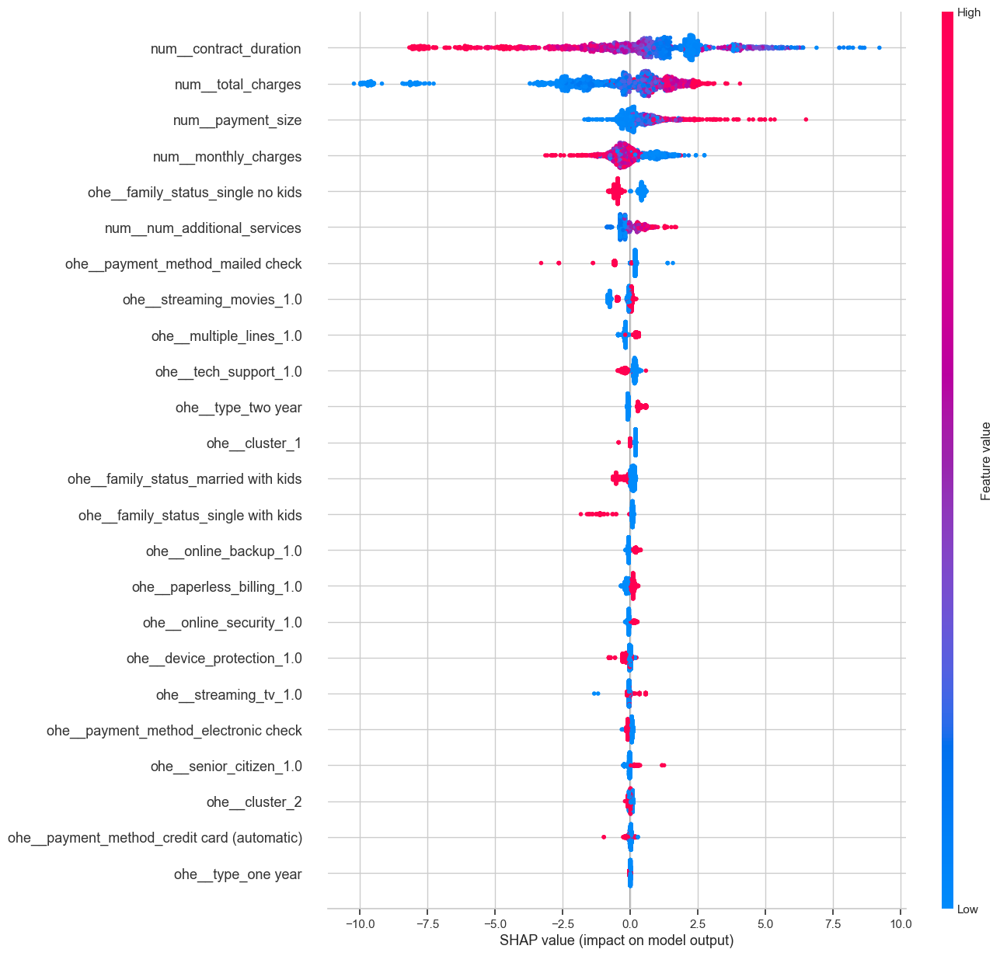

In [211]:
shap.plots.beeswarm(shap_values, max_display=len(feature_names), plot_size=(12, 15))

- **num__contract_duration:** чем короче срок обслуживания клиентов, тем больше вероятность ухода.
- **num__total_charges:** чем выше общие расходы клиента за весь срок, тем больше вероятность ухода.
- **num__payment_size:** чем выше размер одного платежа, тем выше вероятность ухода.
- **num__monthly_charges:** чем меньше размер ежемесячного платежа, тем больше вероятность ухода.

In [212]:
# подтянем в тестовый датасет (обработанный) целевой признак и предсказанный признак
X_test_full = X_test_processed.copy()
X_test_full['target'] = y_test.values
X_test_full['predicted_target'] = y_test_pred
X_test_full['predicted_target_proba'] = y_test_proba
X_test_full.head()

,ohe__type_one year,ohe__type_two year,ohe__paperless_billing_1.0,ohe__payment_method_credit card (automatic),ohe__payment_method_electronic check,ohe__payment_method_mailed check,ohe__senior_citizen_1.0,ohe__online_security_1.0,ohe__online_backup_1.0,ohe__device_protection_1.0,ohe__tech_support_1.0,ohe__streaming_tv_1.0,ohe__streaming_movies_1.0,ohe__multiple_lines_1.0,ohe__family_status_married with kids,ohe__family_status_single no kids,ohe__family_status_single with kids,ohe__cluster_1,ohe__cluster_2,num__monthly_charges,num__total_charges,num__contract_duration,num__payment_size,num__num_additional_services,target,predicted_target,predicted_target_proba
0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,-1.482495,-0.757632,-0.168023,-0.731902,-1.206257,0,0,0.041011
1,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.675584,-0.725481,-1.010011,-0.643768,-0.229415,0,0,0.023753
2,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.614019,0.013999,-0.168023,-0.646282,-0.229415,0,0,0.125437
3,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.347795,-0.864379,-1.144262,-0.657154,-0.717836,0,0,0.009481
4,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.991725,0.080784,-0.299355,-0.630857,0.259005,0,0,0.022129


Посмотрим на отдельные примеры неверно классифицированных объектов. Для этого отфильтруем такие наблюдения по двум критериям:

- Истинное значение целевого признака — 1 (клиент ушел)
- Вероятность принадлежность к классу 1 была оценена ниже чем 0.3 (модель предсказала, что клиент остался, а на самом деле ушел)

In [213]:
X_test_full[(X_test_full['target']==1)&(X_test_full['predicted_target_proba']<0.3)].sort_values(by='predicted_target_proba')

,ohe__type_one year,ohe__type_two year,ohe__paperless_billing_1.0,ohe__payment_method_credit card (automatic),ohe__payment_method_electronic check,ohe__payment_method_mailed check,ohe__senior_citizen_1.0,ohe__online_security_1.0,ohe__online_backup_1.0,ohe__device_protection_1.0,ohe__tech_support_1.0,ohe__streaming_tv_1.0,ohe__streaming_movies_1.0,ohe__multiple_lines_1.0,ohe__family_status_married with kids,ohe__family_status_single no kids,ohe__family_status_single with kids,ohe__cluster_1,ohe__cluster_2,num__monthly_charges,num__total_charges,num__contract_duration,num__payment_size,num__num_additional_services,target,predicted_target,predicted_target_proba
1046,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.186397,1.316868,1.782996,1.538391,1.235847,1,0,0.001787
344,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.509114,-0.889559,-1.100484,-0.692150,-0.717836,1,0,0.002932
1198,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.519177,1.419234,1.520331,-0.650155,-0.229415,1,0,0.003740
789,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,-1.351047,-0.969600,-1.189499,0.031476,-0.717836,1,0,0.003957
276,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.487563,-0.538881,-0.791123,-0.651446,-0.229415,1,0,0.004005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.309530,0.321035,-0.168023,-0.617878,1.235847,1,0,0.235623
237,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.301210,1.770755,1.031482,-0.618218,1.235847,1,0,0.238243
127,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.903458,-0.793152,-0.791123,0.470177,0.259005,1,0,0.257375
1271,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.687231,1.004381,0.808216,0.634894,0.259005,1,0,0.259319


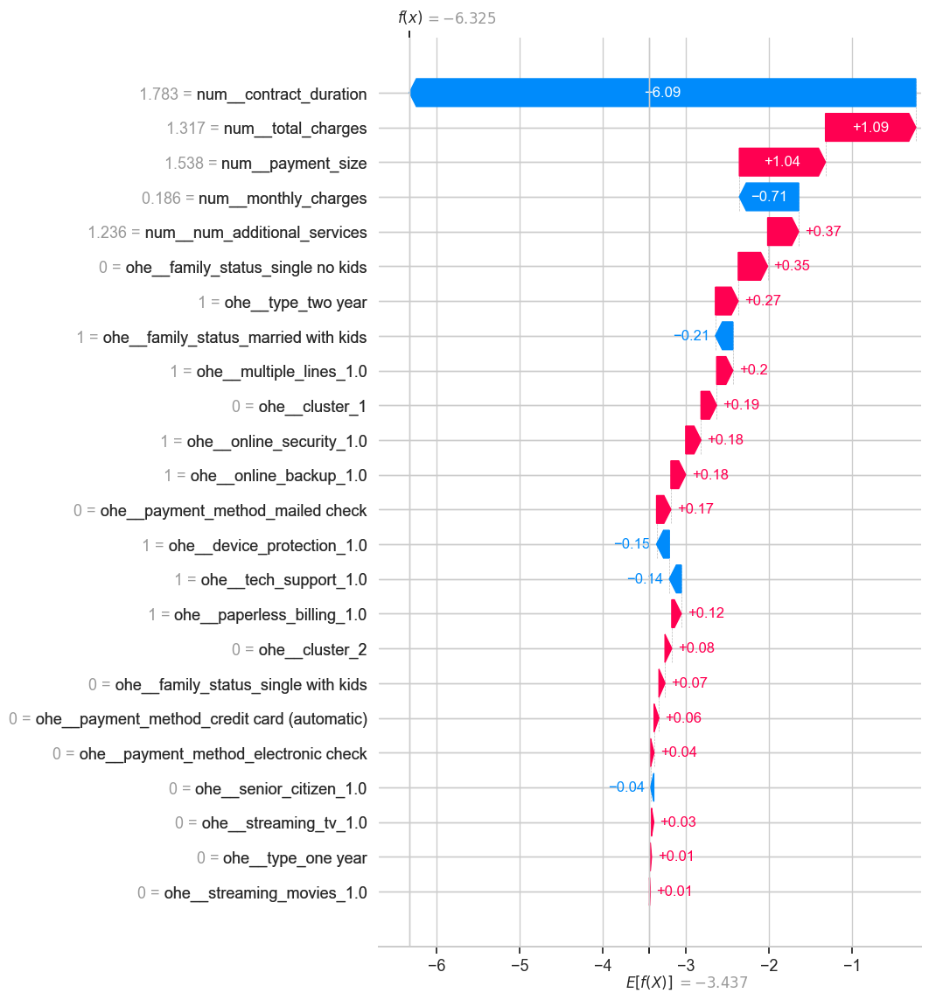

In [214]:
shap.plots.waterfall(shap_values[1046], max_display=len(feature_names))

In [215]:
X_test.iloc[1046]

type                                        two year
paperless_billing                               True
payment_method             bank transfer (automatic)
monthly_charges                                70.45
total_charges                                 4931.5
senior_citizen                                 False
online_security                                 True
online_backup                                   True
device_protection                               True
tech_support                                    True
streaming_tv                                   False
streaming_movies                               False
multiple_lines                                  True
contract_duration                               2129
payment_size                                  1690.8
num_additional_services                            5
family_status                      married with kids
cluster                                            0
Name: 3913-FCUUW, dtype: object

Модель предсказала, что этот клиент останется, потому что срок действия его контракта очень длинный (почти 6 лет). Поскольку этот параметр в модели имеет самый большой вес, то он перевесил тот факт, что размер платежа и общие расходы достаточно большие.

Также посмотрим случай, когда модель ошиблась, предсказав уход клиента, а он остался:

In [216]:
X_test_full[(X_test_full['target']==0)&(X_test_full['predicted_target_proba']>0.7)].sort_values(by='predicted_target_proba', ascending=False)

,ohe__type_one year,ohe__type_two year,ohe__paperless_billing_1.0,ohe__payment_method_credit card (automatic),ohe__payment_method_electronic check,ohe__payment_method_mailed check,ohe__senior_citizen_1.0,ohe__online_security_1.0,ohe__online_backup_1.0,ohe__device_protection_1.0,ohe__tech_support_1.0,ohe__streaming_tv_1.0,ohe__streaming_movies_1.0,ohe__multiple_lines_1.0,ohe__family_status_married with kids,ohe__family_status_single no kids,ohe__family_status_single with kids,ohe__cluster_1,ohe__cluster_2,num__monthly_charges,num__total_charges,num__contract_duration,num__payment_size,num__num_additional_services,target,predicted_target,predicted_target_proba
1643,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.465936,0.276250,-0.213260,2.792522,1.724268,0,1,0.834088
515,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.287895,-0.106033,-0.168023,1.637873,0.747426,0,1,0.815885
839,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.718845,0.744905,0.587869,2.060266,1.724268,0,1,0.805584
410,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.003372,0.745352,0.364604,0.789826,0.747426,0,1,0.774616


In [217]:
X_test.iloc[1643]

type                               two year
paperless_billing                     False
payment_method             electronic check
monthly_charges                       108.9
total_charges                        2722.5
senior_citizen                        False
online_security                       False
online_backup                          True
device_protection                      True
tech_support                           True
streaming_tv                           True
streaming_movies                       True
multiple_lines                         True
contract_duration                       761
payment_size                         2613.6
num_additional_services                   6
family_status                single no kids
cluster                                   0
Name: 4016-BJKTZ, dtype: object

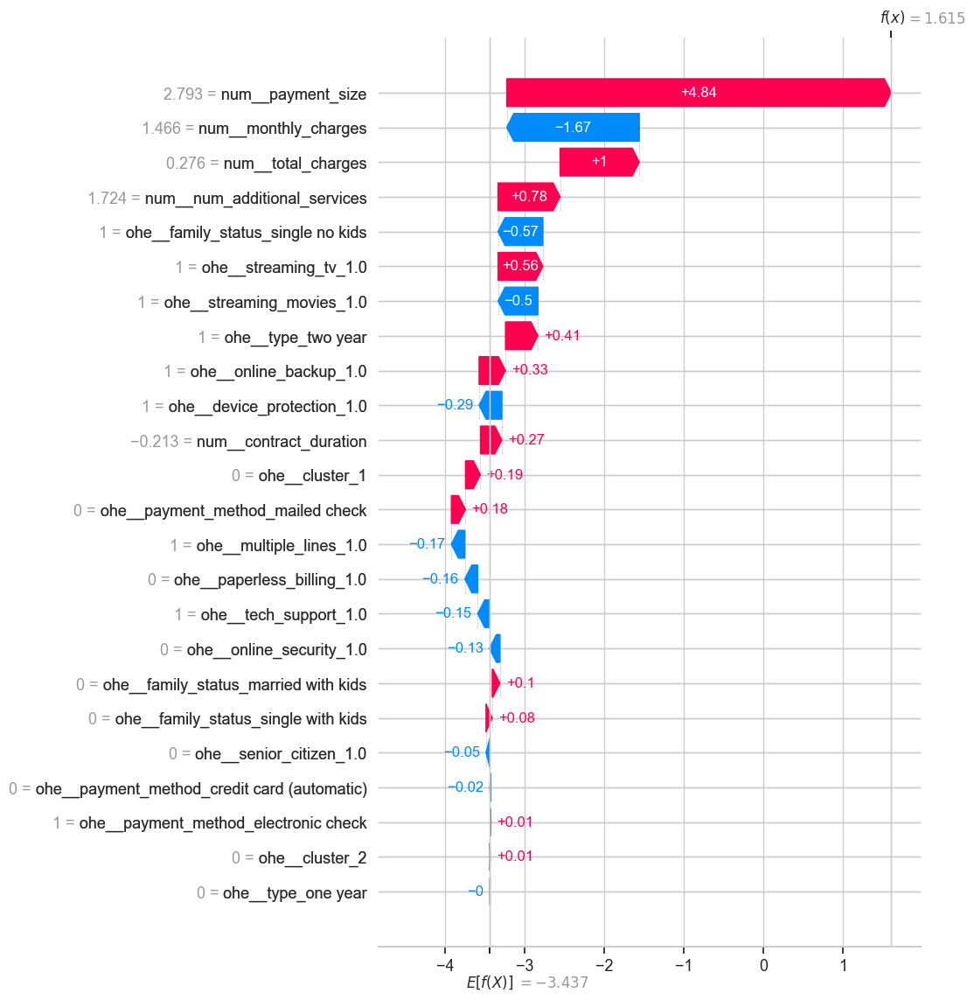

In [218]:
shap.plots.waterfall(shap_values[1643], max_display=len(feature_names))

В данном случа модель предсказала, что клиент уйдет, потому что у него огромный единоразовый платеж (2613), что перевесило по важности все другие признаки.

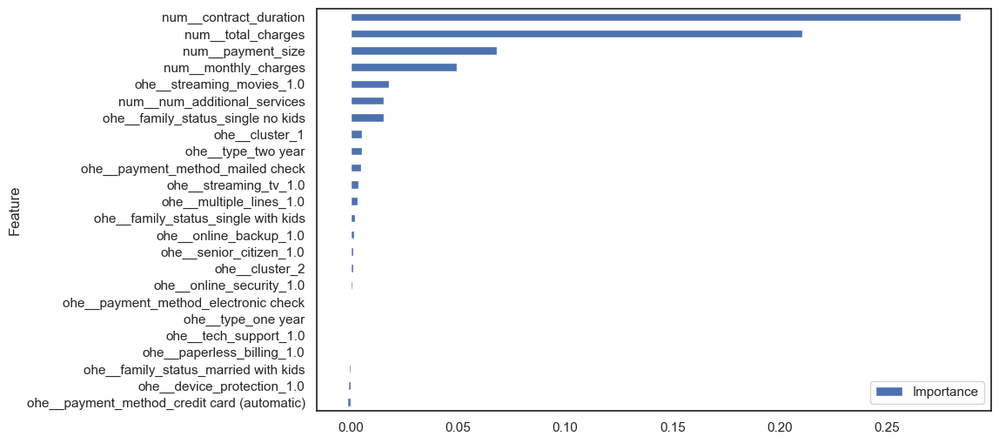

In [219]:
# Оценка важности признаков
result_perm = permutation_importance(final_model.named_steps['model'], X_test_processed, y_test, scoring='roc_auc', random_state=RANDOM_STATE)

feature_importance_perm = pd.DataFrame({'Feature': X_test_processed.columns, 'Importance': result_perm['importances_mean']})
feature_importance_perm = feature_importance_perm.sort_values('Importance', ascending=True)
sns.set_style('white')
feature_importance_perm.plot(x='Feature', y='Importance', kind='barh', figsize=(10, 6))
plt.show()

Проверим важность признаков после их перестановки.

**Сохранение важности:**
Важность признаков не изменилась после перестановки, это может указывать на то, что модель действительно стабильно оценивает их значимость.

**Адекватность уровня обучения:**
Сохранение значимости признаков может свидетельствовать о том, что модель адекватно обучилась на тренировочной выборке.

### Выводы

**1. Обучение моделей:**
- Категориальные признаки переведены в тип `category` для корректной обработки.
- Создан пайплайн для обучения моделей, внутри которого:
 - категориальные признаки кодируются OHE кодировщиком;
 - количественные признаки масштабируются с помощью StandardScaler, добавлена возможность создания новых количественных признаков с помощью полиномизации (по умолчанию полиномизации не применяется).
- Основная метрика: AUC-ROC; дополнительная: Accuracy.

**2. Обучение и выбор лучшей модели:**
- Рассмотрены 4 основные вида моделей, относящиеся к различным семействам:
 - LogisticRegression
 - SVC
 - RandomForestClassifier
 - CatBoostClassifier
- Ко всем указанным выше моделей был произведен подбор оптимальных гиперпараметров с помощью Optuna. В результате чего, только бустинговая модель CatBoostClassifier смогла преодолеть установленный порог качества (0.85).
- Другие модели: Logistic Regression, Random Forest, SVC показали худшие результаты и не удовлетворяют условиям задачи.
- Оценка качества лучшей модели (CatBoostClassifier):  
 - ROC-AUC: 0.9356 (кросс-валидация) и 0.9237 (тест).
 - Accuracy: 93.86% (лучшая Accuracy достигается на стандартном пороге 50%).
 - Recall: 64.73%.
 - Precision: 94.18%.
 
**3. Влияние признаков:**

Ключевые факторы ухода клиентов:

- Длительность контракта: чем короче срок обслуживания клиентов, тем больше вероятность ухода.
- Общие расходы: чем выше общие расходы клиента за весь срок, тем больше вероятность ухода.
- Размер платежа: чем выше размер одного платежа, тем выше вероятность ухода.
- Ежемесячные расходы: чем меньше размер ежемесячного платежа, тем больше вероятность ухода.

## Общие выводы и рекомендации

В рамках проекта по прогнозированию оттока клиентов для оператора связи «ТелеДом» была проведена комплексная работа, включающая следующие ключевые этапы:

**1. Сбор и предобработка данных:**
- Объединение данных из четырех источников (договоры, персональные данные, интернет-услуги и телефония) в единую таблицу.
- Преобразование данных в удобный формат (приведение названий колонок к snake_case, обработка пропусков, изменение типов данных, удаление дубликатов).
- Создание новых признаков (длительность контракта, регулярность платежей, количество дополнительных услуг, семейный статус и др.), что позволило выявить более сложные взаимосвязи.

**2. Исследовательский анализ данных (EDA):**
- Изучены распределения количественных и качественных признаков.
- Выявлены общие характеристики клиентов, влияющие на их уход (например, пользователи с более высокими расходами и длительными контрактами чаще уходят).
- Проведена сегментация пользователей и выделены 3 основные кластера: премиум-пользователи, телефонные пользователи и базовые интернет-пользователи.
- Построен корреляционный анализ признаков, что позволило устранить мультиколлинеарность и выделить значимые для прогноза уходов параметры.

**3. Обучение моделей:**
- Разработан пайплайн для обработки данных (масштабирование численных признаков, кодирование категориальных).
- Протестированы различные модели машинного обучения (Logistic Regression, SVC, Random Forest, CatBoostClassifier).
- Оптимизация гиперпараметров выполнена с помощью библиотеки Optuna.
- Лучшую метрику качества достигла модель CatBoostClassifier, которая показала на тестовых данных:
 - ROC-AUC: 0.9237.
 - Accuracy: 93.86%.
 - Recall (полнота): 64.73%.
 - Precision (точность): 94.18%.

**4. Анализ значимости признаков:**
- Наибольшее влияние на прогноз ухода клиентов оказывают:
 - Длительность контракта (короткие контракты — высокий риск ухода).
 - Общие расходы клиента за весь срок (высокие расходы - высокий риск ухода).
 - Размер одного платежа (большой платеж - высокий риск ухода).
 - Ежемесячные расходы (малые ежемесячные расходы - высокий риск ухода).
- Самый важный критерий "длительность контракта", именно он в основном определяет вероятность ухода текущих клиентов. 

**Рекомендации по удержанию клиентов**

1. Разработать программы удержания для клиентов с короткими контрактами. Например, предлагать скидки или бонусы при переходе на годовые или двухгодовые контракты, системы долгосрочной лояльности и скидок.
2. Перевести клиентов на ежемесячную оплату (вместо раза в год или в два года). Это позволит сократить размер одного платежа и снизить негативную реакцию клиентов на единоразовое списание крупных сумм.
3. Ориентировать маркетинговые мероприятия на семейные пары без детей. Отток клиентов происходит в основном в данной категории пользователей.

**Рекомендации по возможному улучшению качества получившейся модели:**
Для улучшения качества получившейся модели, рекомендуется собирать больше дополнительной информации о клиентах:
1. Информация о действующих тарифных планах клиентов (тарифный план, его стоимость, что в него включено и т.д.)
2. Информации о фактических объемах потребляемых услуг (объем трафика, длительность сессий, количество минут и т.д.)
3. Информация об истории маркетинговой активности с клиентами (количество рассылков за последнее время, предложенные ранее промокоды и т.д)

Такая информация может позволить модели находить дополнительны взаимосвязи в данных, объясняющие причины ухода клиентов. 